## Exploratory Data Analysis, Waves 1 & 2

This notebook runs the overview of the exploratory data analysis (EDA) for Waves 1 and 2.

The EDA followed the below structure:
- Split of total data into 3 samples:
    - Wave 1 sample (Willingness/Intention as the target variable)
    - Wave 2 Intention sample (Willingness/Intention as the target variable)
    - Wave 2 Uptake sample (Willingness/Intention as the target variable)
- Investigation into target variable distributions
- Comparison of demographics across Wave 1 & 2 samples.
- Analysis of demographics by target group. For each sub sample, demographics explored include:
    - Region
    - Gender
    - Education level
    - Working Status
    - Income level
    - Shielding Status
    - Voting Intention (W2 only)
    - Media source Trust/Usage
- Analysis of knowledge and emotion scale variable correlations
- Exploration of Age variable, including:
    - Age distribution within subsamples
    - Correlation between age variable and targets
    - Correlation of age variable with emotion and knowledge variables
    
    
A summary of findings is presented at the bottom of the notebook.

In [1]:
#Importing necessary packages
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(font_scale=1.5)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
# Importing various datasets, both dummified and non-dummified. Non-dummified data will often be more appropriate for the creation of charts. 
w1 = pd.read_csv("C:/Users/laure/Documents/vaccine_hesitancy_and_uptake/1_data_cleaning/wave_1_vaccine_intention_data.csv")
w1_nondum = pd.read_csv("C:/Users/laure/Documents/vaccine_hesitancy_and_uptake/1_data_cleaning/wave_1_vaccine_intention_data_nondum.csv")
w2_uptake = pd.read_csv("C:/Users/laure/Documents/vaccine_hesitancy_and_uptake/1_data_cleaning/wave_2_vaccine_uptake_data.csv")
w2_intention = pd.read_csv("C:/Users/laure/Documents/vaccine_hesitancy_and_uptake/1_data_cleaning/wave_2_vaccine_intention_data.csv")
w2_nondum = pd.read_csv("C:/Users/laure/Documents/vaccine_hesitancy_and_uptake/1_data_cleaning/wave_2_data_nondum.csv")

In [3]:
# Splitting the non dummy wave 2 file into the uptake and intention subsample dataframes. 
# Irrelevant records and variables are dropped (i.e. empty uptake var is dropped in the intention data and vice versa)
w2uptake_nondum = w2_nondum.dropna(axis=0, subset='COV_DOSE')
w2intent_nondum = w2_nondum.dropna(axis=0, subset='intention')
w2uptake_nondum = w2uptake_nondum.copy()
w2intent_nondum = w2intent_nondum.copy()
w2uptake_nondum.drop('intention', axis=1, inplace=True)
w2intent_nondum.drop(['COV_DOSE', 'COV_DOSE_2'], axis=1, inplace=True)

**Investigation of target variable distribution**

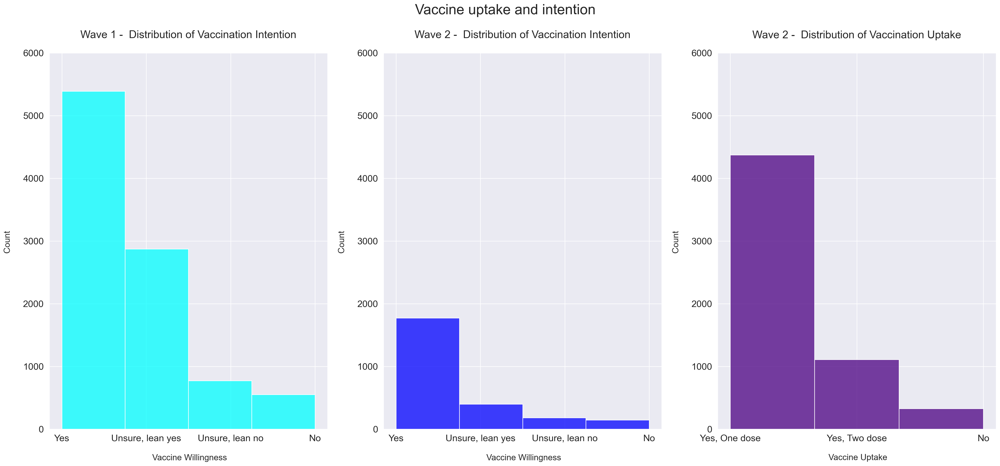

In [4]:
# Creating histograms to compare the distribution of each target variable

fig, ax = plt.subplots(ncols=3, figsize=(30, 12))
fig.suptitle('Vaccine uptake and intention \n \n', fontsize=25)
sns.histplot(w1['COV_VAC_SELF'], bins=4, kde=False, ax=ax[0], color='aqua')
sns.histplot(w2_intention['intention'], bins=4, kde=False, ax=ax[1], color='blue')
sns.histplot(w2_uptake['COV_DOSE'], bins=3, kde=False, ax=ax[2], color='indigo')
ax[0].set_ylim(0, 6000) # Equalising the y axis across all 3 subplots to aid cross-sample comparison
ax[1].set_ylim(0, 6000) # Equalising the y axis across all 3 subplots to aid cross-sample comparison
ax[2].set_ylim(0, 6000) # Equalising the y axis across all 3 subplots to aid cross-sample comparison
labels = ['Yes', 'Unsure, lean yes', 'Unsure, lean no', 'No']
labels2 = ['Yes, One dose', 'Yes, Two dose', 'No']
ax[0].set_xticks([1, 2, 3, 4])
ax[0].set_xticklabels(labels)
ax[1].set_xticks([1, 2, 3, 4])
ax[1].set_xticklabels(labels)
ax[2].set_xticks([1, 2, 3])
ax[2].set_xticklabels(labels2)
ax[0].set_title('\n Wave 1 -  Distribution of Vaccination Intention \n', fontsize=19)
ax[1].set_title('\n Wave 2 -  Distribution of Vaccination Intention \n', fontsize=19)
ax[2].set_title('\n Wave 2 -  Distribution of Vaccination Uptake \n', fontsize=19)
ax[0].set_xlabel('\n Vaccine Willingness', fontsize=15)
ax[1].set_xlabel('\n Vaccine Willingness', fontsize=15)
ax[2].set_xlabel('\n Vaccine Uptake', fontsize=15)
ax[0].set_ylabel('Count \n', fontsize=15)
ax[1].set_ylabel('Count \n', fontsize=15)
ax[2].set_ylabel('Count \n', fontsize=15)
plt.show()

In [5]:
# Also calculating distribution as a proportion.
print(w1['COV_VAC_SELF'].value_counts(normalize=True)*100)
print()
print(w2_intention['intention'].value_counts(normalize=True)*100)
print()
print(w2_uptake['COV_DOSE'].value_counts(normalize=True)*100)

1    56.201106
2    29.978095
3     8.063002
4     5.757797
Name: COV_VAC_SELF, dtype: float64

1.0    70.92
2.0    16.00
3.0     7.28
4.0     5.80
Name: intention, dtype: float64

1    75.249570
2    19.087780
3     5.662651
Name: COV_DOSE, dtype: float64


**Comparison of Wave 1 and Wave 2 demographics**

In [6]:
w1percent = (w1_nondum.groupby('DEMREG')[['DEMAGE']].count() / w1_nondum[['DEMAGE']].count() * 100).sort_values(by='DEMAGE', ascending=False)

In [7]:
w2percent = (w2_nondum.groupby('DEMREG')[['DEMAGE']].count() / w2_nondum[['DEMAGE']].count() * 100).sort_values(by='DEMAGE', ascending=False)

In [8]:
# Setting demographic variable lists to iterate through to create summary dataframes for use in plotting.
df_names = ['sex', 'reg', 'edu', 'wrk', 'rel', 'inc', 'shield', 'dec']
variable_list = ['DEMSEX', 'DEMREG', 'DEMEDU', 'DEMWRK', 'DEMREL', 'DEMINC', 'COV_SHIELD', 'VAC_DEC']
column_names = ['Wave 1', 'Wave 2']

In [9]:
# Creating function to create summary dataframes for use in plotting
def create_dfs(names, variables, columns):
    """Function to create summary dataframes of cross-wave comparison of proportions rather than raw counts
    
    :param names: New summary dataframe name.
    :param variables: Original variables from which to draw data.
    :param column_names: New dataframe column names, referring to each wave/original dataframe.
    :return: new summary dataframes
    """
    dfs = {} # Creating a summary dictionary in which to store new summary dataframe information.
    for index, value in enumerate(names):
        data = pd.DataFrame(([(w1_nondum[variables[index]].value_counts(normalize=True) * 100), (w2_nondum[variables[index]].value_counts(normalize=True) * 100)])).T # Creating a summary dataframe of each wave's proportional information for a given variable.
        data.set_axis(column_names, axis=1, inplace=True) # setting column names as per columns list input.
        data.reset_index(inplace=True) # Reseting row index
        data.rename(columns={'index': value}, inplace=True) # Reseting index name
        dfs[value] = data # Assigning dataframe to the summary dictionary.
    return dfs

In [10]:
# Creating dictionary of summary dataframes using create_dfs column.
datas = create_dfs(df_names, variable_list, column_names)

In [11]:
datas['wrk']

,wrk,Wave 1,Wave 2
0,Working full-time,46.104099,46.786117
1,Retired,21.237092,24.921689
2,Working part-time,16.678836,17.190828
3,Looking after the home,5.173673,4.410475
4,Student,3.901116,2.856785
5,Unemployed,3.817670,3.771457
6,Unable to work,3.087514,0.062649


In [12]:
# datas['reg'].reset_index(inplace=True)
# datas['reg'].rename(columns={'index': 'Region'}, inplace=True)

In [13]:
# Creating a function to create cross wave comparison barcharts for each variable

def bar_chart(a, b, c, data, label1, label2, title):
    """Creates grouped barchart
    
    :param a: First column from which to draw data
    :param b: Second column from which to draw data
    :param c: Column value labels
    :param data: Dataframe from which to draw data
    :param label1: First column label
    :param label2: Second column label
    :param title: Chart title"""
    
    
    x = np.arange(0, data.shape[0])
    width = 0.35
    
    fig, ax = plt.subplots(figsize=(25, 14))
    rects1 = ax.bar(x-width/2, a, width, label=label1)
    rects2 = ax.bar(x+width/2, b, width, label=label2)

    ax.set_ylabel('%', rotation=90)
    ax.set_title(title, fontsize=25)
    ax.set_xticks(x, c, fontsize=16)
#     ax.set_yticks(c, fontsize=15)
#     ax.xticks(fontsize=15)
    ax.legend()   

#     ax.bar_label(rects1, padding=3)
#     ax.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

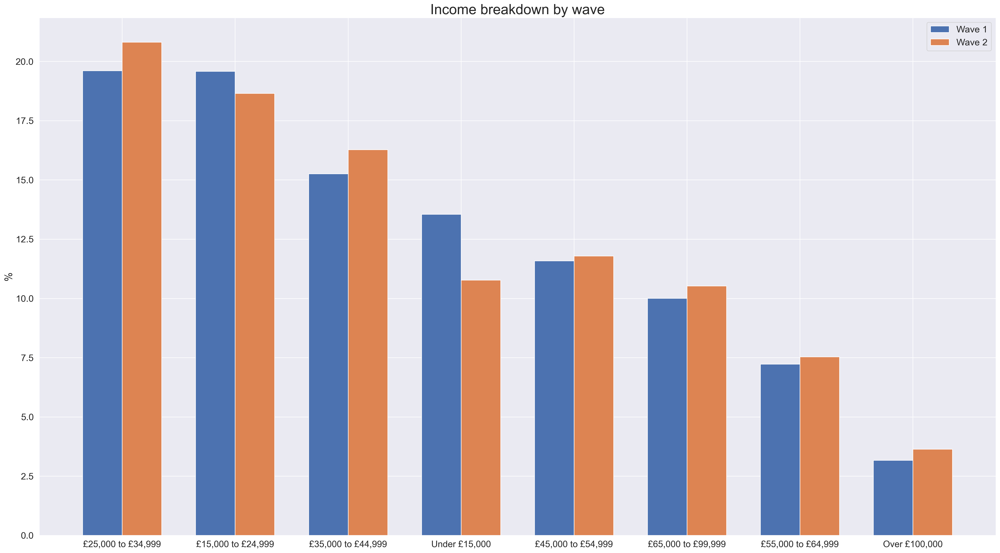

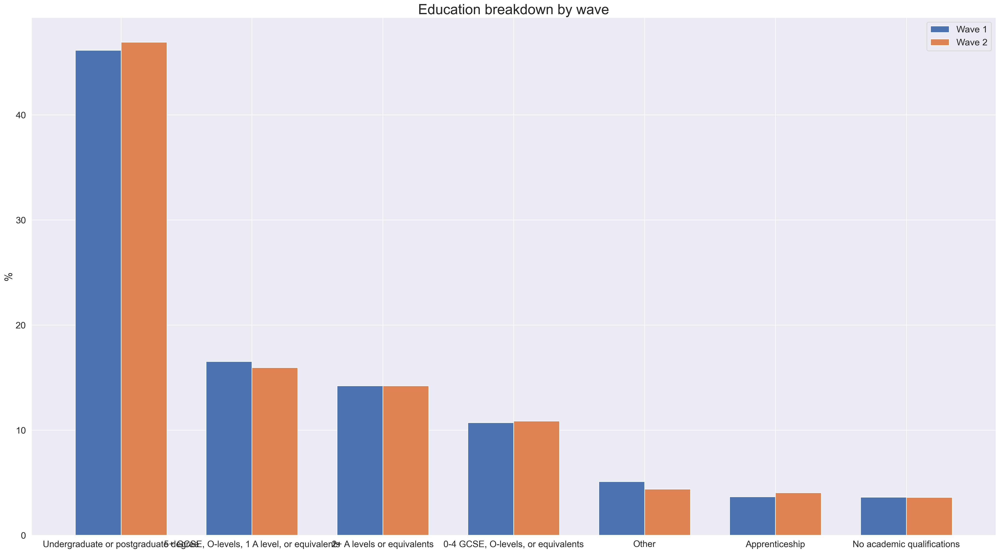

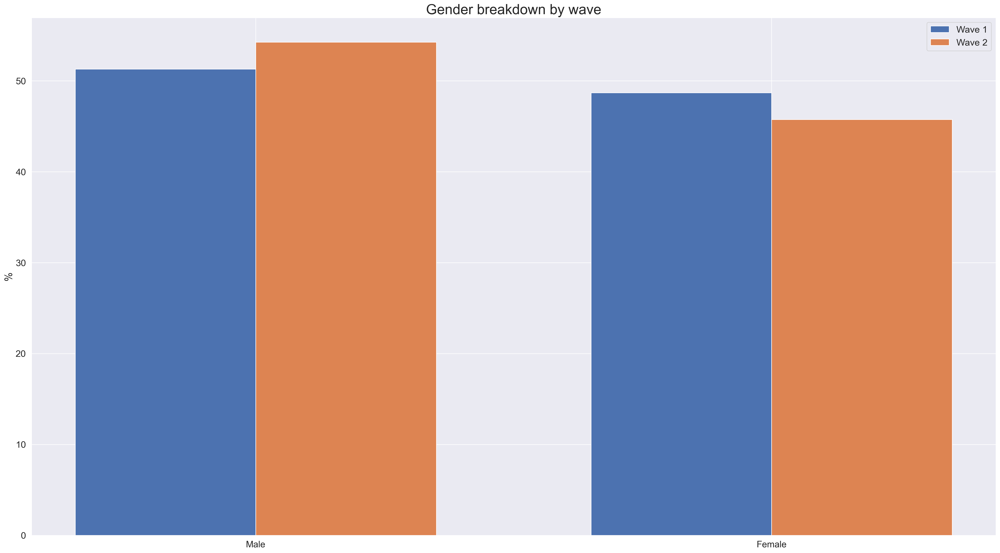

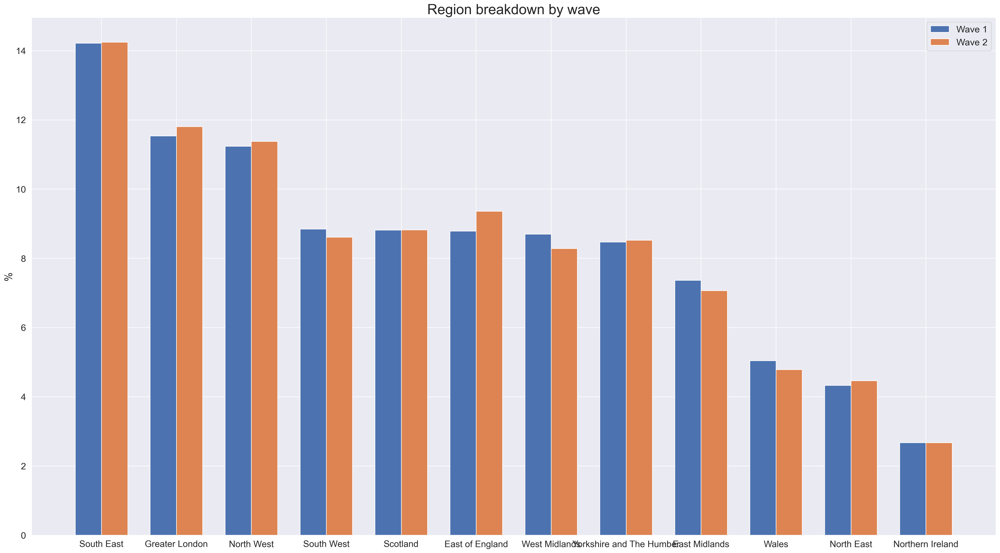

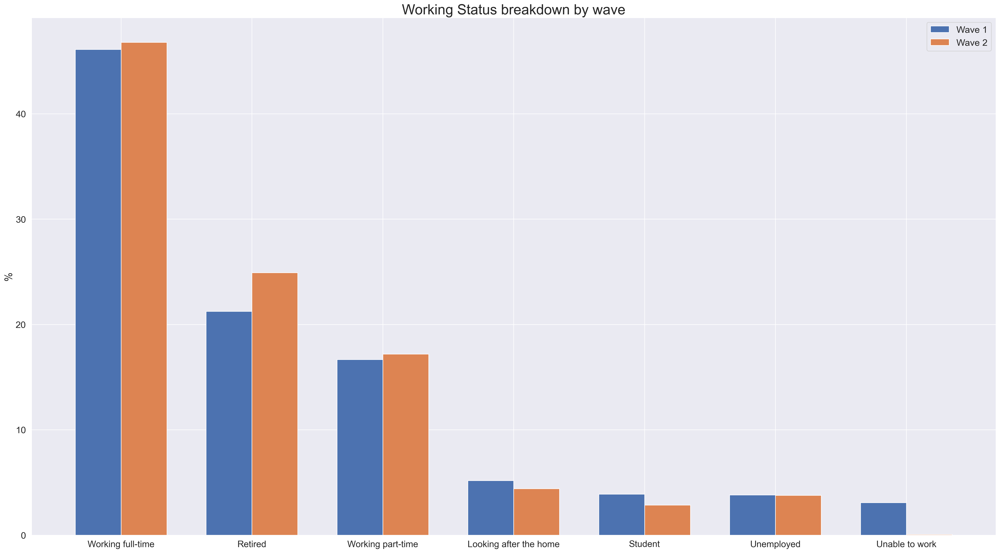

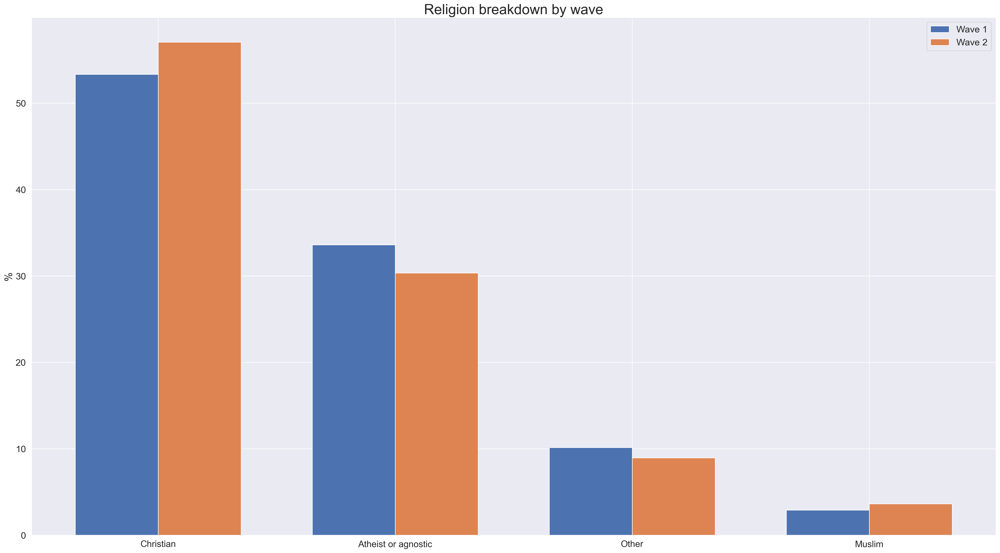

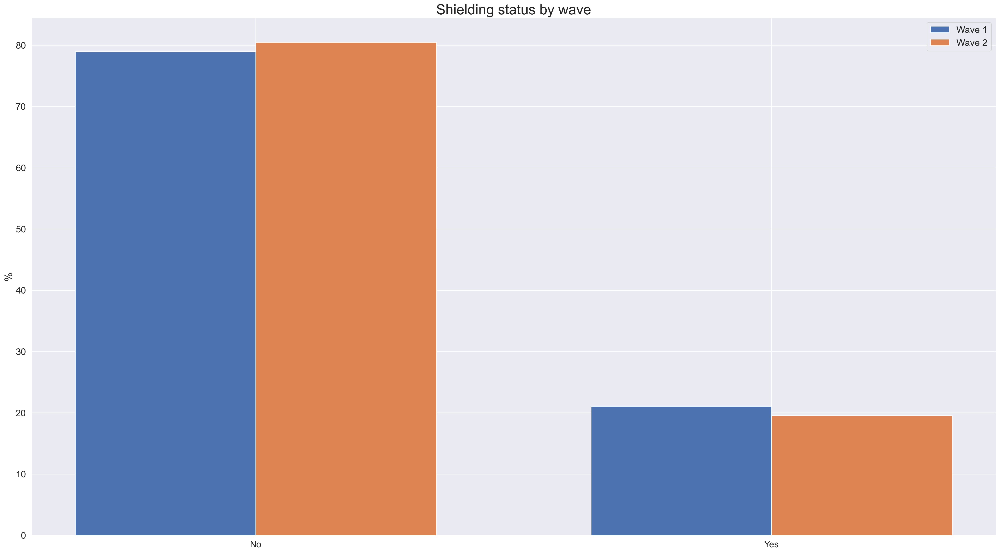

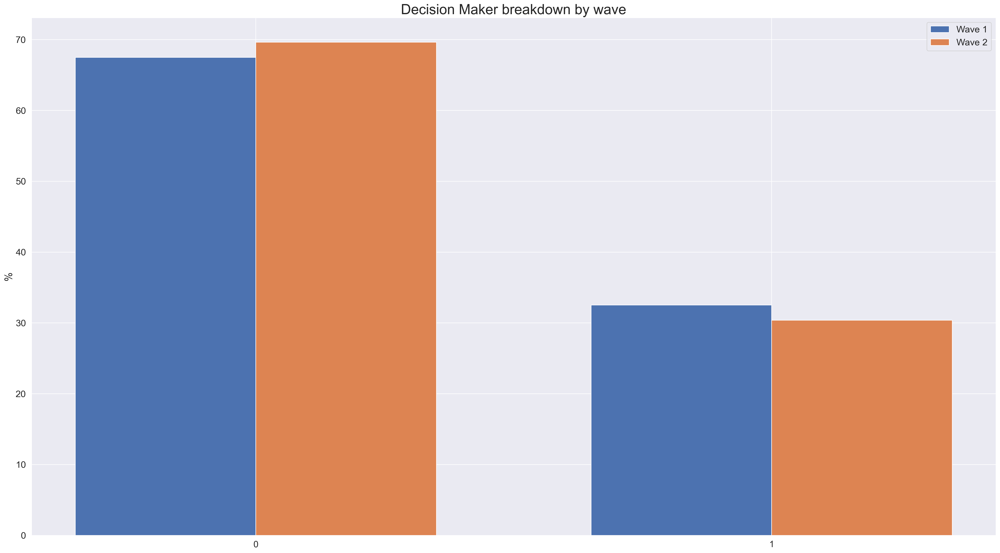

In [14]:
# Using barchart function to output charts of demographic breakdown.
bar_chart(datas['inc']['Wave 1'], datas['inc']['Wave 2'], datas['inc']['inc'], datas['inc'], 'Wave 1', 'Wave 2', 'Income breakdown by wave')
bar_chart(datas['edu']['Wave 1'], datas['edu']['Wave 2'], datas['edu']['edu'], datas['edu'], 'Wave 1', 'Wave 2', 'Education breakdown by wave')
bar_chart(datas['sex']['Wave 1'], datas['sex']['Wave 2'], datas['sex']['sex'], datas['sex'], 'Wave 1', 'Wave 2', 'Gender breakdown by wave')
bar_chart(datas['reg']['Wave 1'], datas['reg']['Wave 2'], datas['reg']['reg'], datas['reg'], 'Wave 1', 'Wave 2', 'Region breakdown by wave')
bar_chart(datas['wrk']['Wave 1'], datas['wrk']['Wave 2'], datas['wrk']['wrk'], datas['wrk'], 'Wave 1', 'Wave 2', 'Working Status breakdown by wave')
bar_chart(datas['rel']['Wave 1'], datas['rel']['Wave 2'], datas['rel']['rel'], datas['rel'], 'Wave 1', 'Wave 2', 'Religion breakdown by wave')
bar_chart(datas['shield']['Wave 1'], datas['shield']['Wave 2'], datas['shield']['shield'], datas['shield'], 'Wave 1', 'Wave 2', 'Shielding status by wave')
bar_chart(datas['dec']['Wave 1'], datas['dec']['Wave 2'], datas['dec']['dec'], datas['dec'], 'Wave 1', 'Wave 2', 'Decision Maker breakdown by wave')

**1) W1 & W2 Intention/Willingness**

**Analysis of Target Variables by demographic group**

In [15]:
# Creating summary dataframes from which to create charts for willingness target variables.

def group_analysis(data, target, var1, var2):
    """Creates summary dataframe of target by subgroup
    
    :param data: dataframe from which to draw information
    :target: Target variable of interest
    :var1: Variable on which to group findings
    :var2: Variable used to produce summary statistics
    :return: summary dataframe, and dataframe for charting"""
    
    
    df = ((data.groupby([var1, target])[[var2]].count() / data.groupby([var1])[[var2]].count()) * 100) # Creating summary dataframe of target breakdown per demographic category. Resulting data is shown as a proportion of total in demographic category.
    value_list = [] # Creating list of values for converting into final dataframe
    column_list = list(data[var1].unique()) # Collecting category labels
    for j in range(0, 4):
        sub_list = [] # Creating sublist of values per category label
        for a in column_list: # Iterating through category labels
            try:
                value = int(df.loc[a].iloc[j]) # Extracting each target value proportion of each category for each category label
                sub_list.append(value) # appending value to sublist
            except:
                pass
        value_list.append(sub_list) # appending sublist to values.
    
    df2 = pd.DataFrame(value_list, columns=column_list) # Creating final dataframe from value lists
    forcharting = df2.T # Transposing dataframe for ease of charting
    
    forcharting.columns = ['Definitely Yes', 'Unsure, leaning yes', 'Unsure, leaning no', 'Not willing'] # Assigning column names to final datafile
    return df, forcharting

In [16]:
# Creating stacked bar function

def stacked_bar(data, title):
    """Creates stacked barchart from dataframe
    
    :param data: dataframe from which to draw information
    :title: Chart title"""
    
    fig, ax = plt.subplots(figsize=(10, 10))

    data.plot(ax=ax, kind='bar', stacked=True,
            title=f'Vaccination intention by {title}')
    ax.legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()

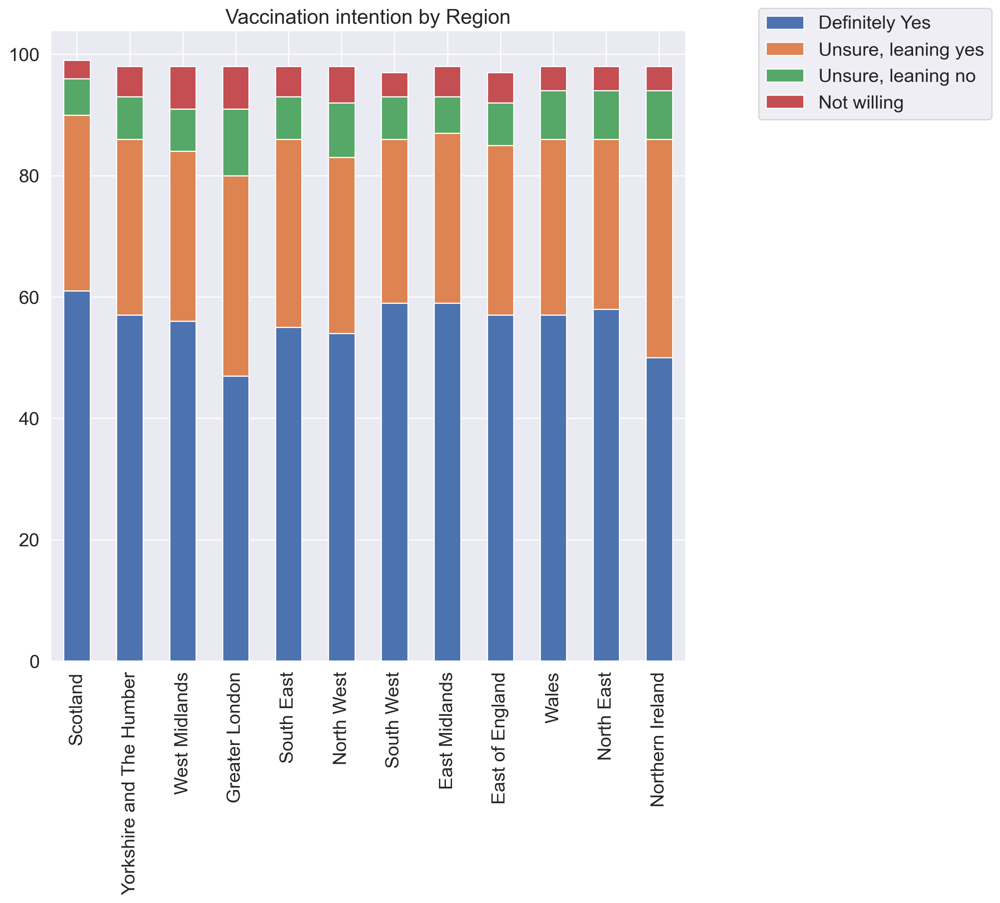

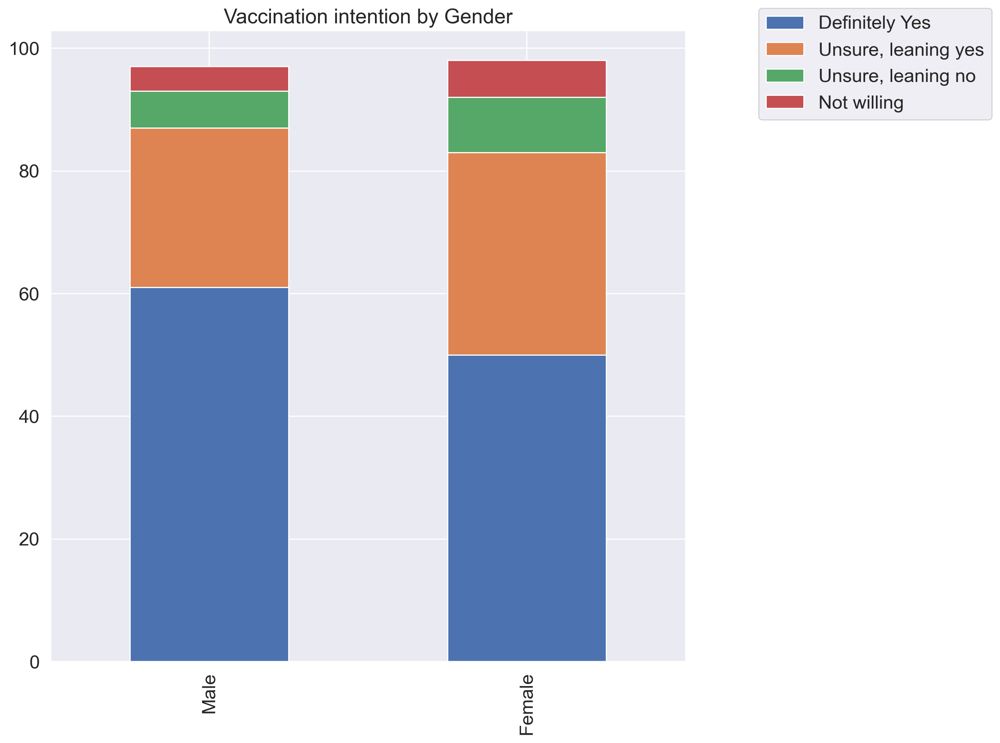

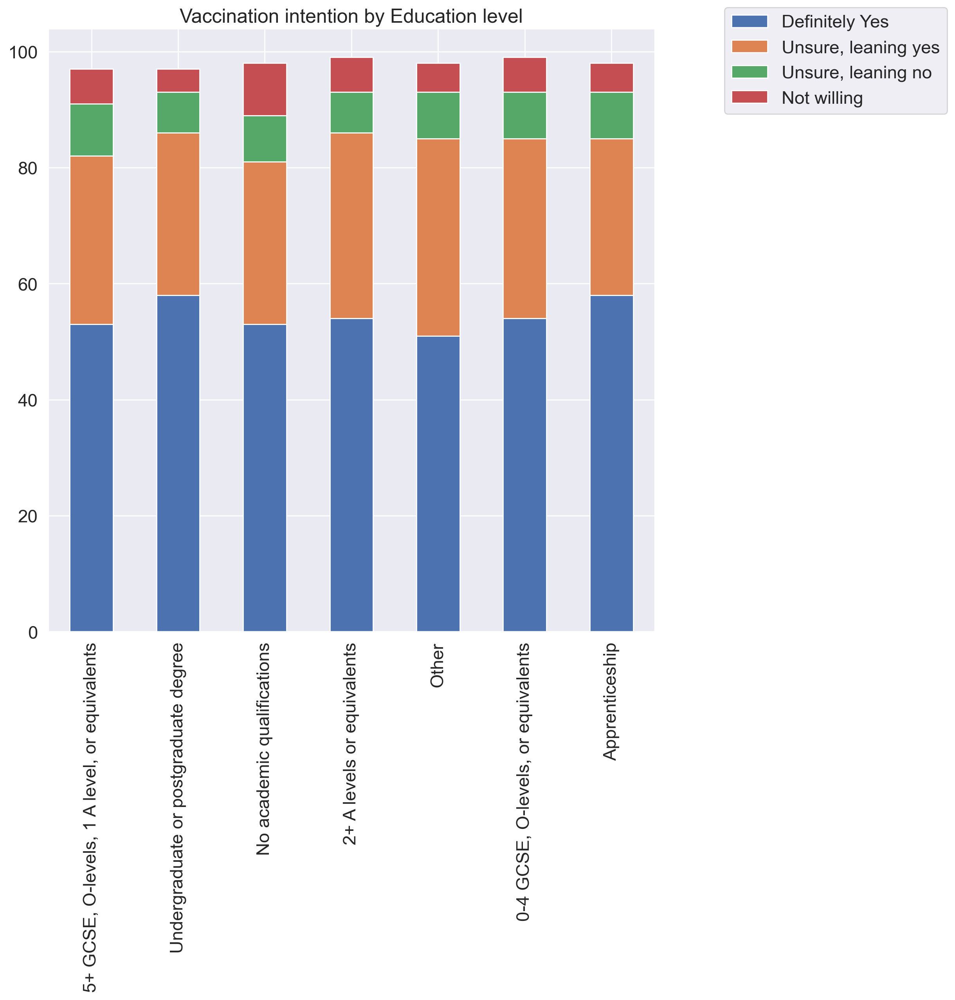

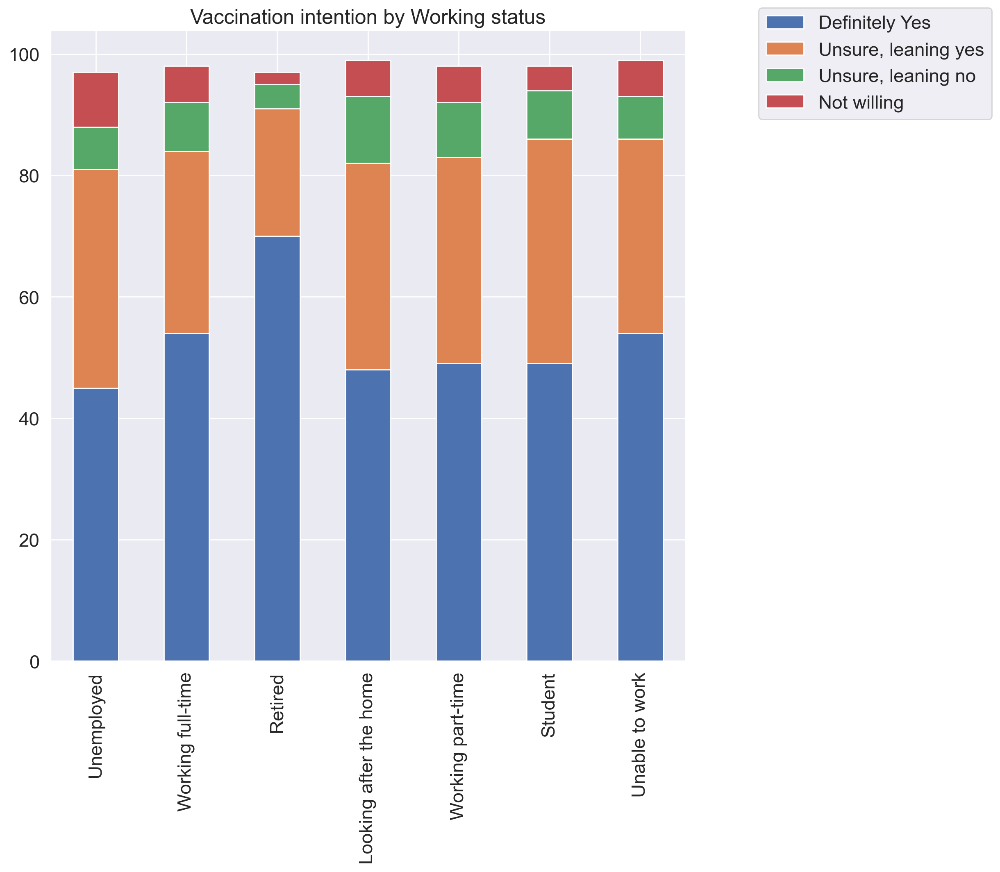

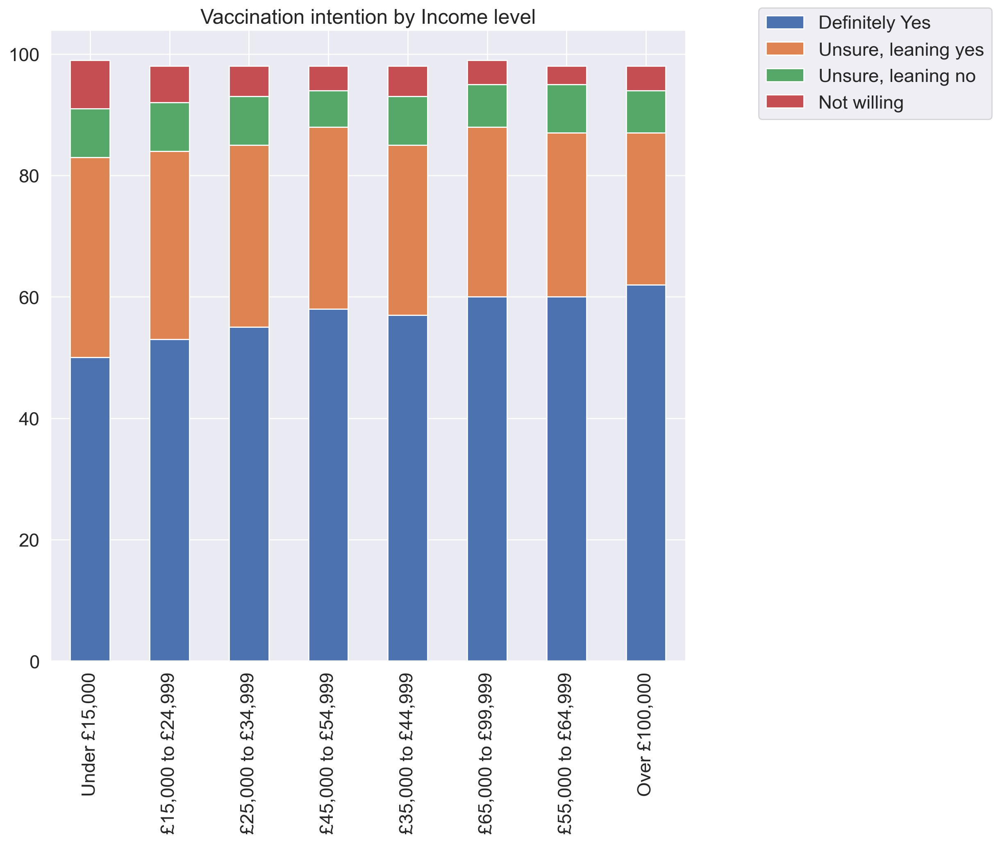

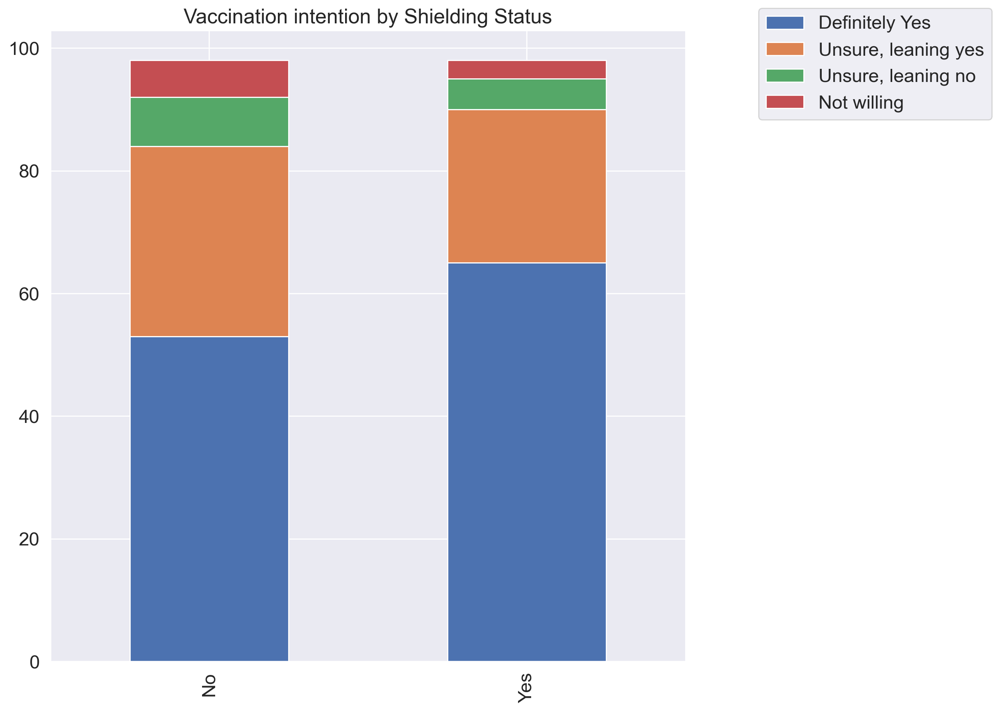

In [17]:
# Iterating through wave 1 data to create stacked barcharts.

w1_list = [('DEMREG', 'Region'), ('DEMSEX', 'Gender'), 
           ('DEMEDU', 'Education level'), ('DEMWRK', 'Working status'),
          ('DEMINC', 'Income level'),
          ('COV_SHIELD', 'Shielding Status')]

for item in w1_list:
    df_group, df_chart = group_analysis(w1_nondum, 'COV_VAC_SELF', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])

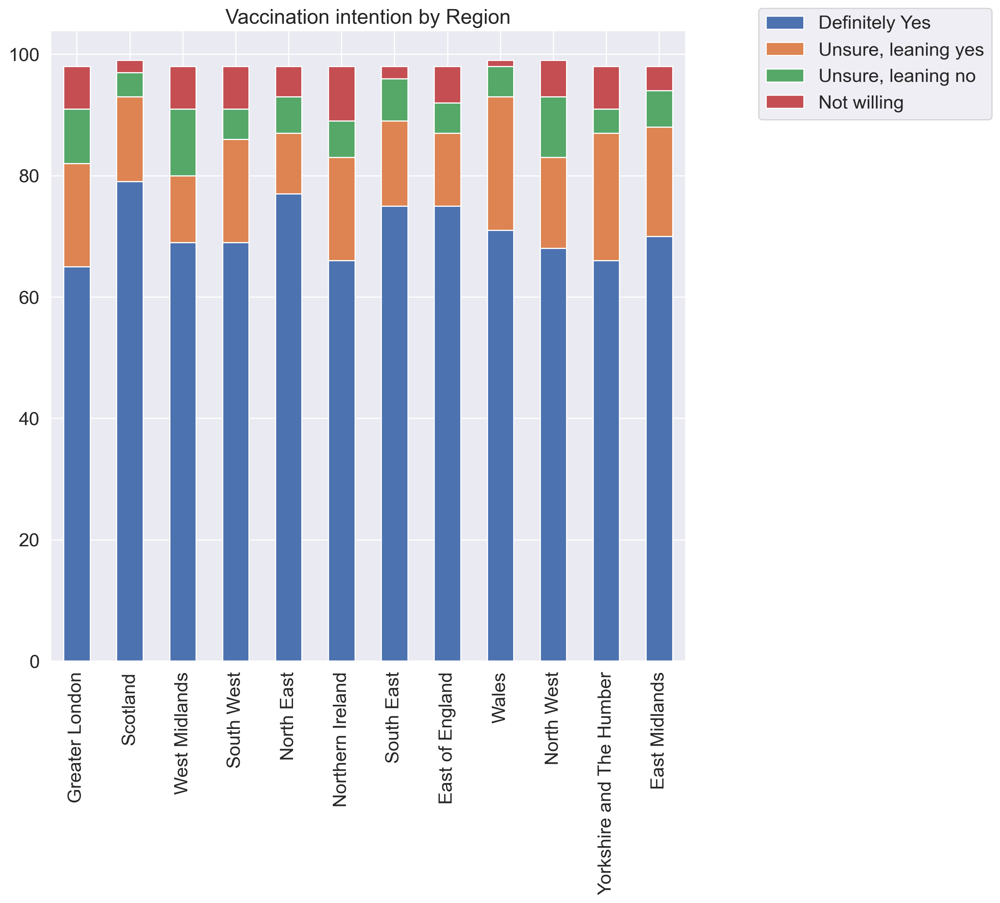

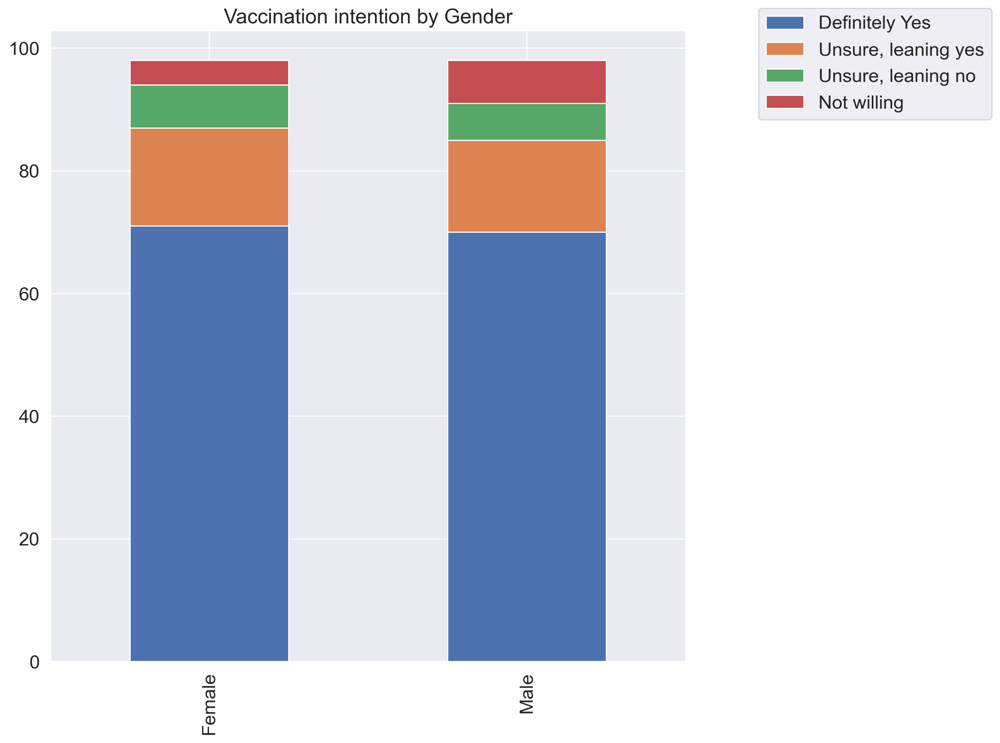

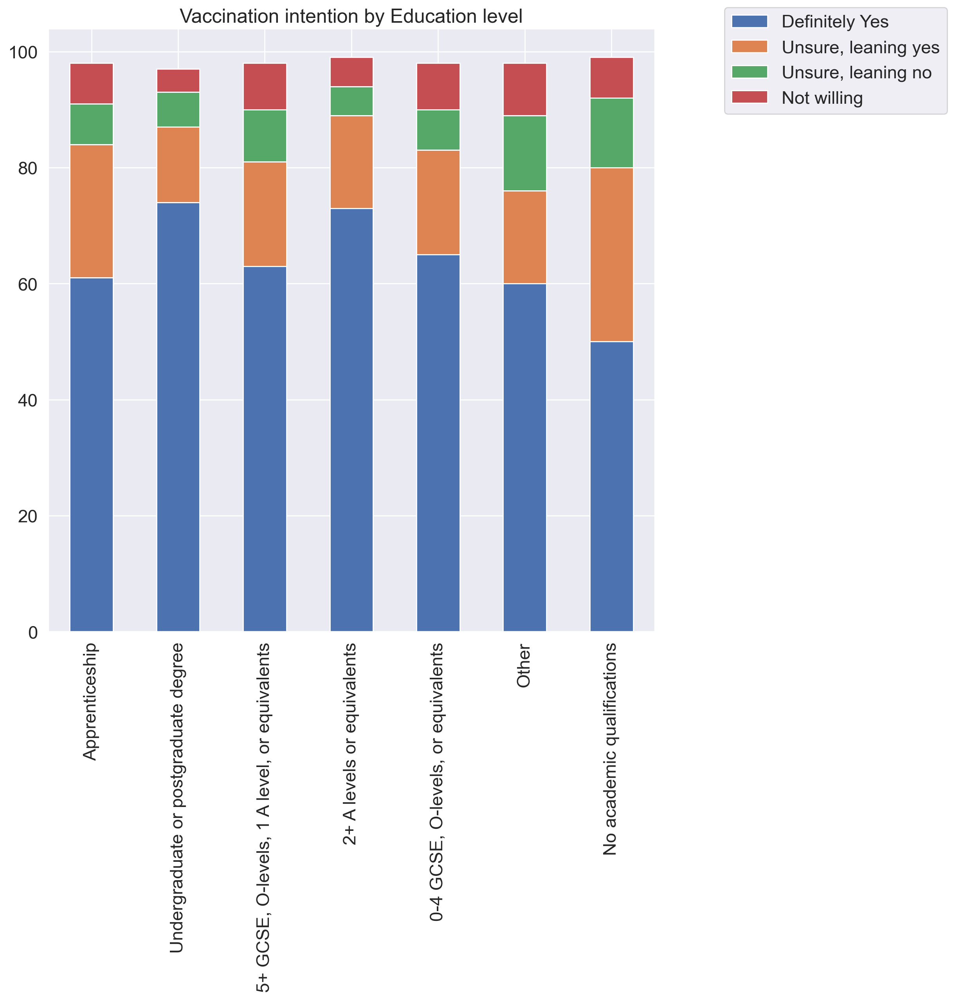

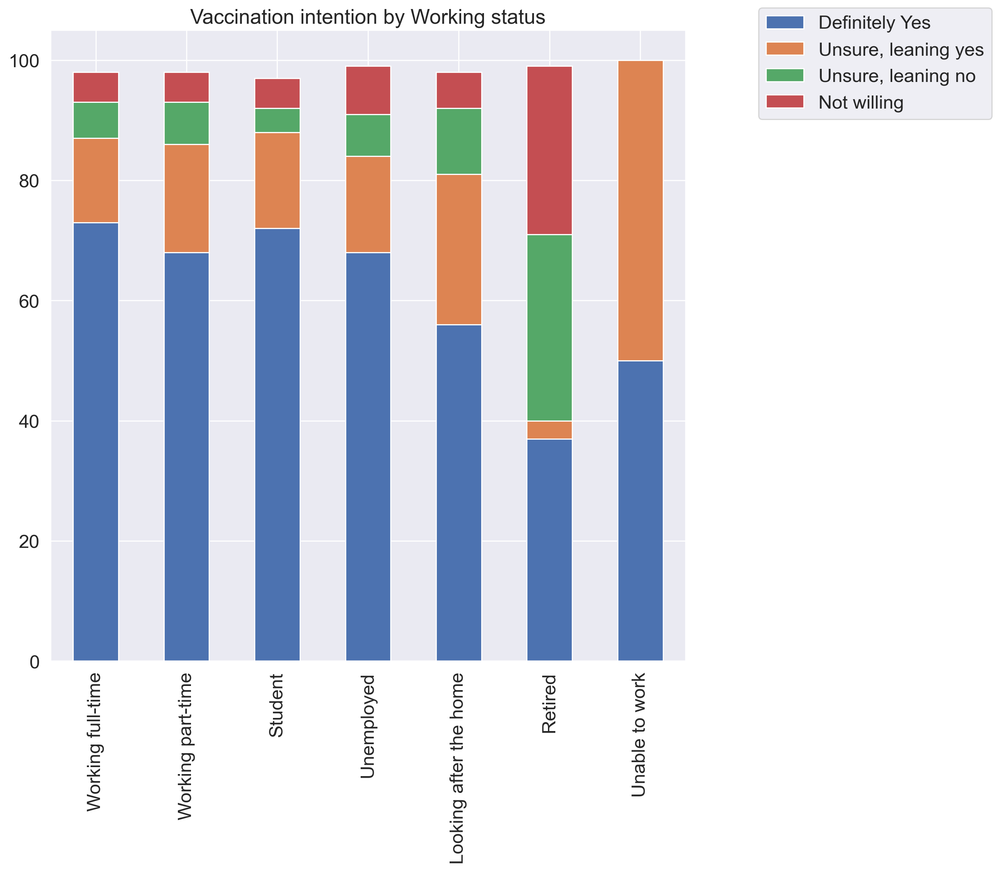

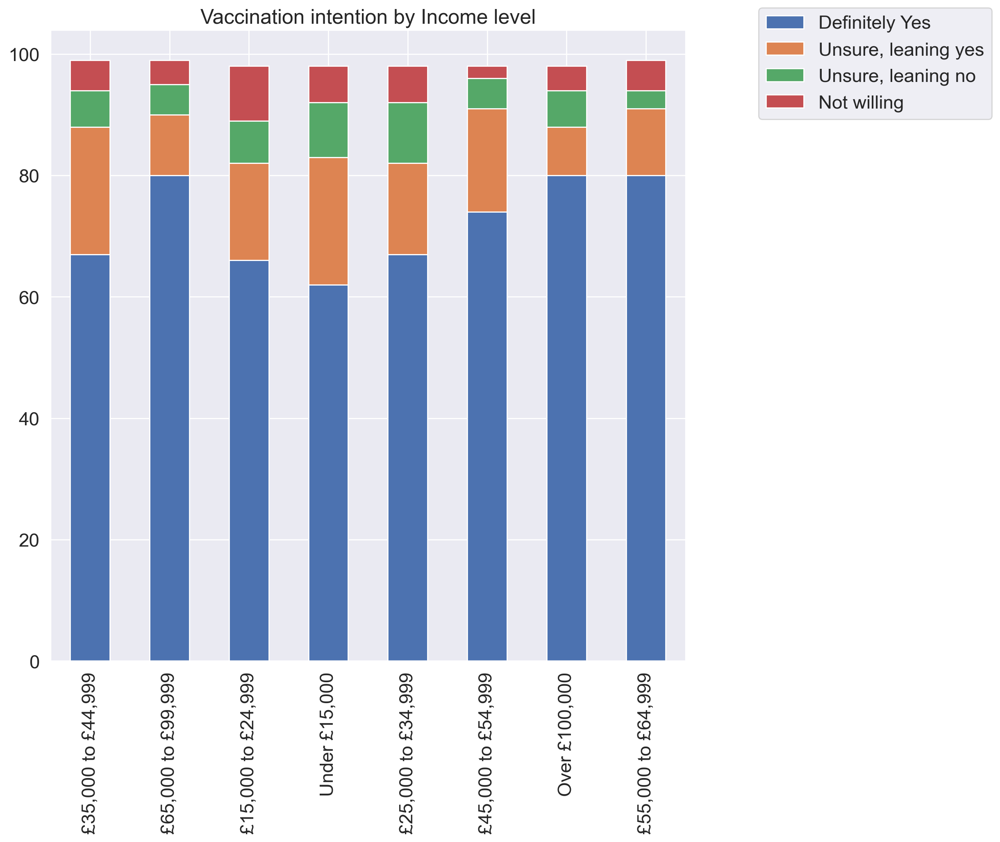

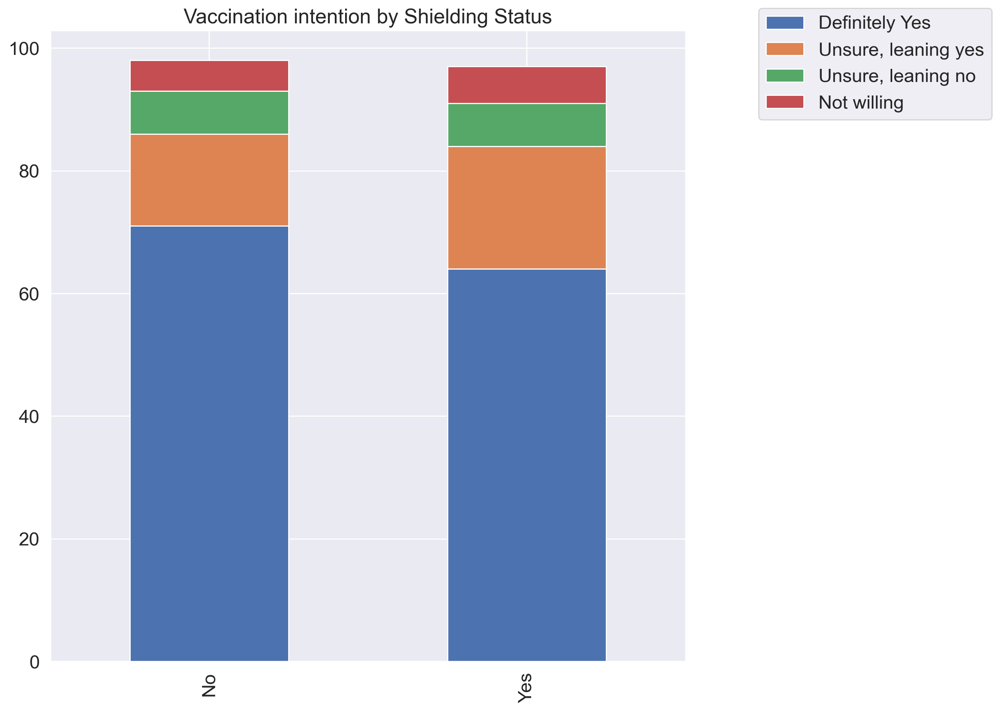

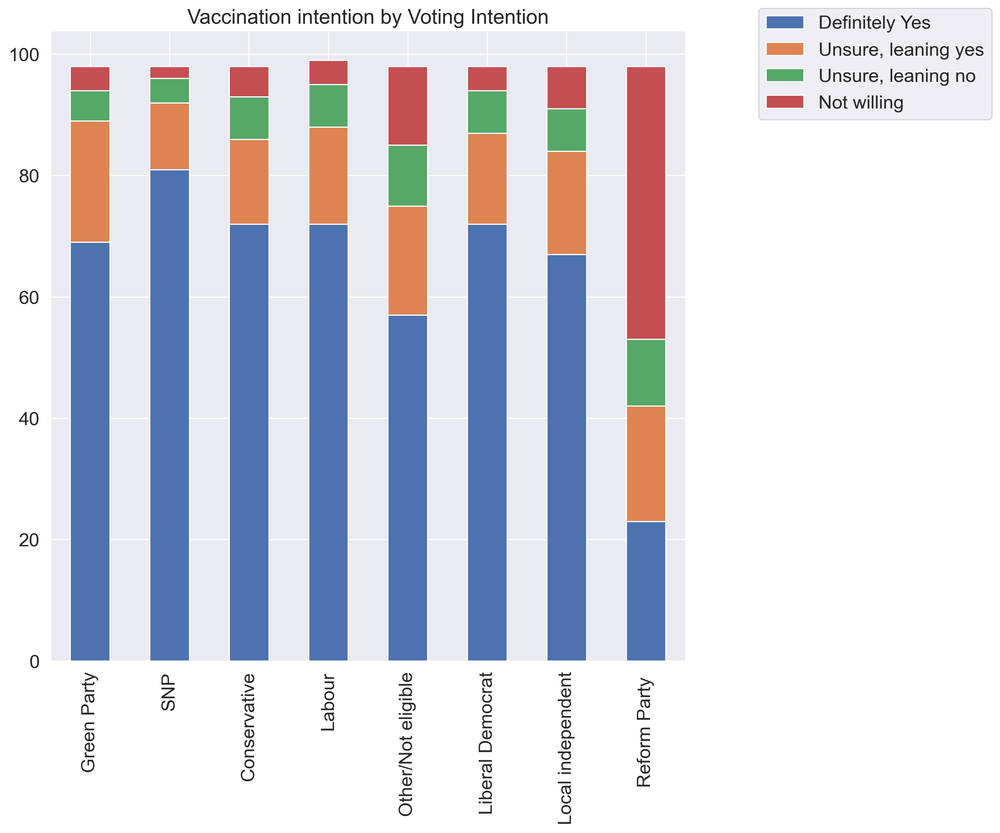

In [18]:
# Iterating through wave 2 data to create stacked barcharts.
w2_list = [('DEMREG', 'Region'), ('DEMSEX', 'Gender'), 
           ('DEMEDU', 'Education level'), 
           ('DEMWRK', 'Working status'),   
          ('DEMINC', 'Income level'),
          ('COV_SHIELD', 'Shielding Status'), ('Q71', 'Voting Intention')]

for item in w2_list:
    df_group, df_chart = group_analysis(w2intent_nondum, 'intention', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])


**Analysis of Target Variables by Media Source**

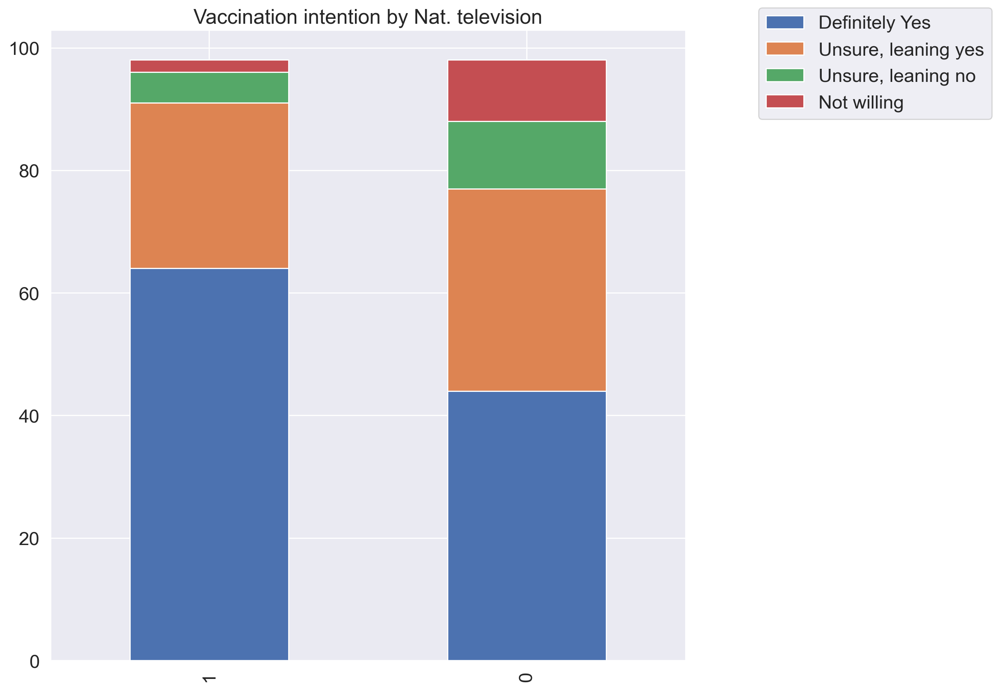

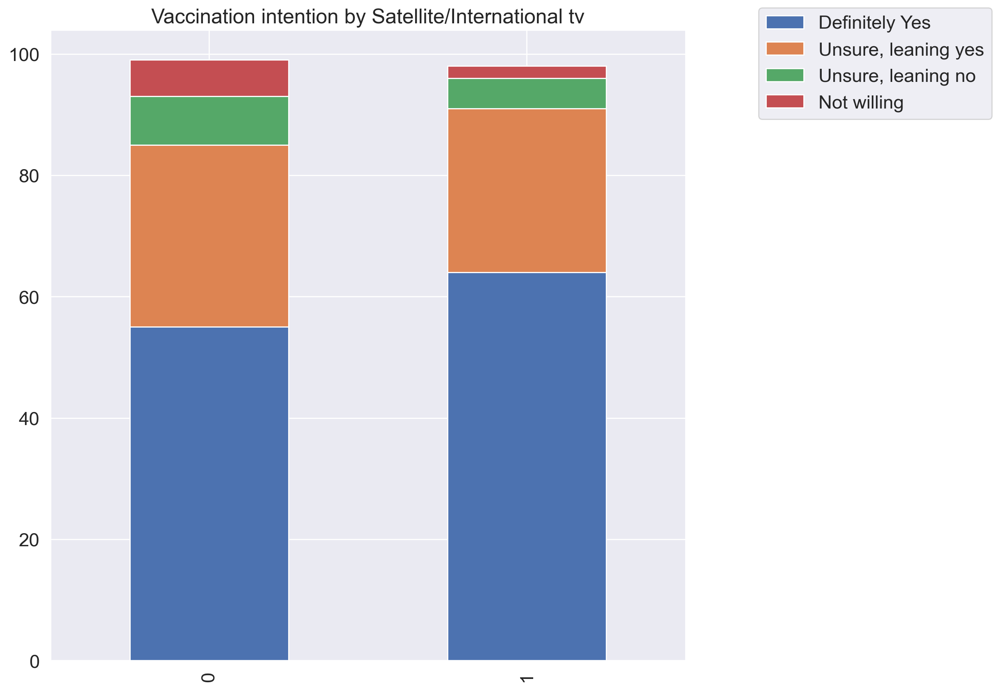

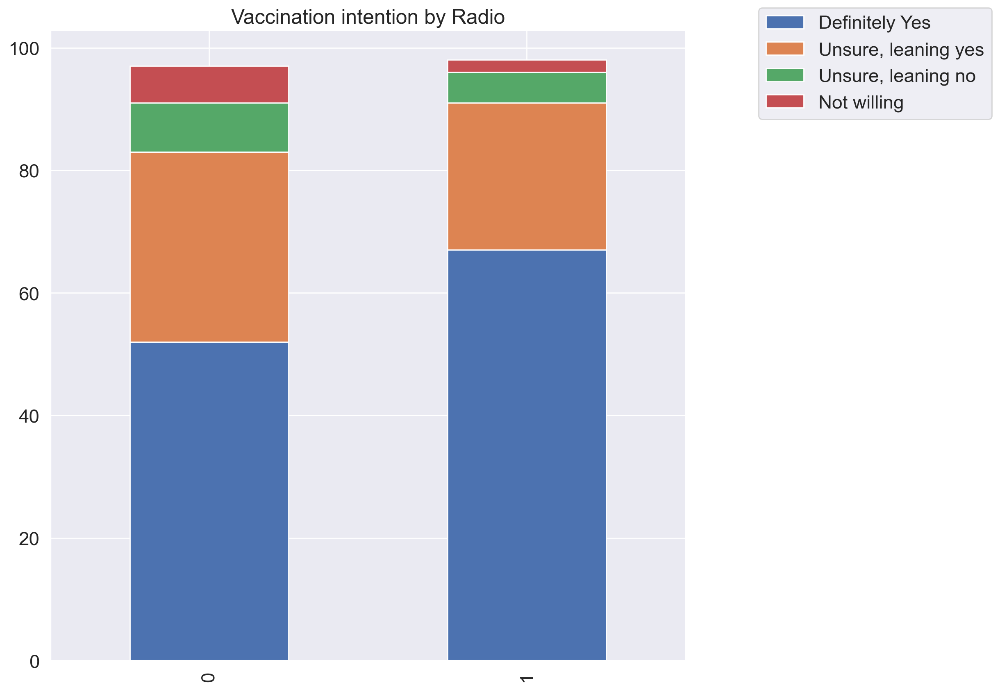

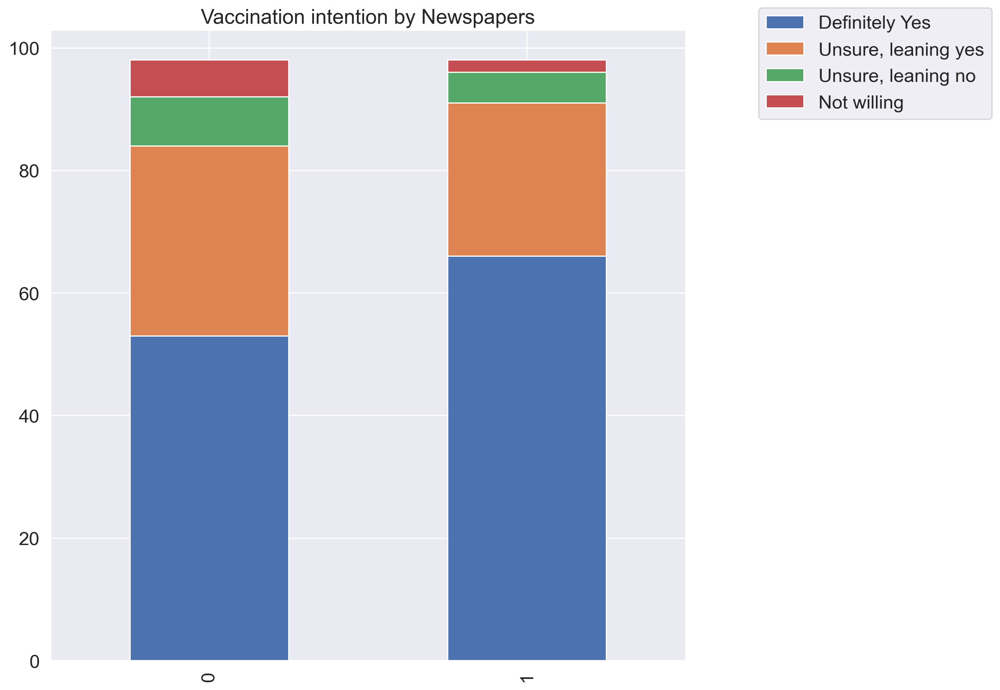

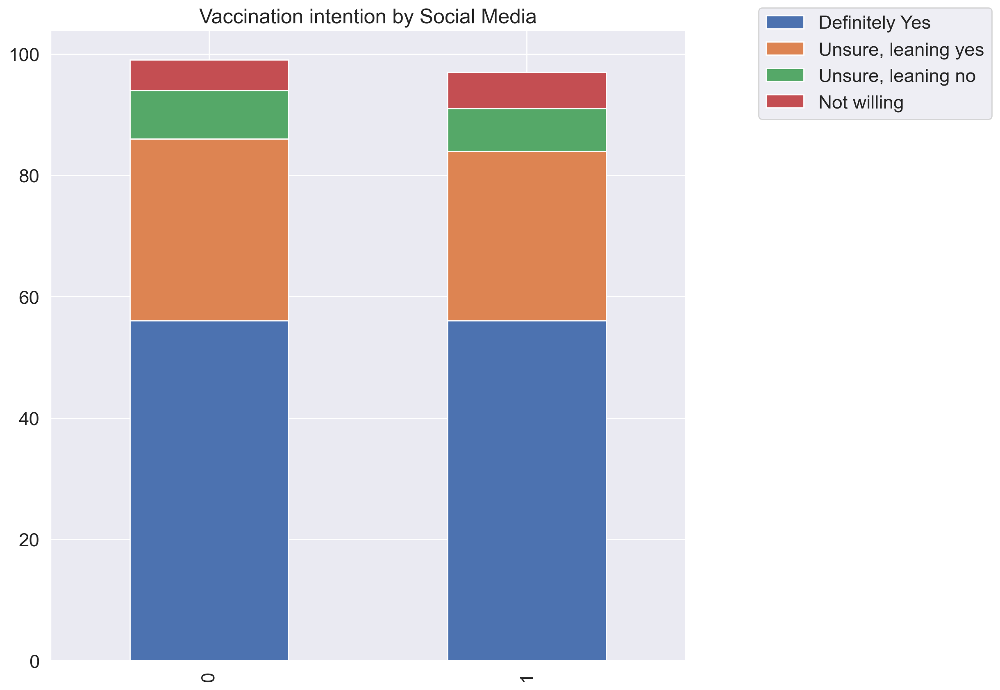

...

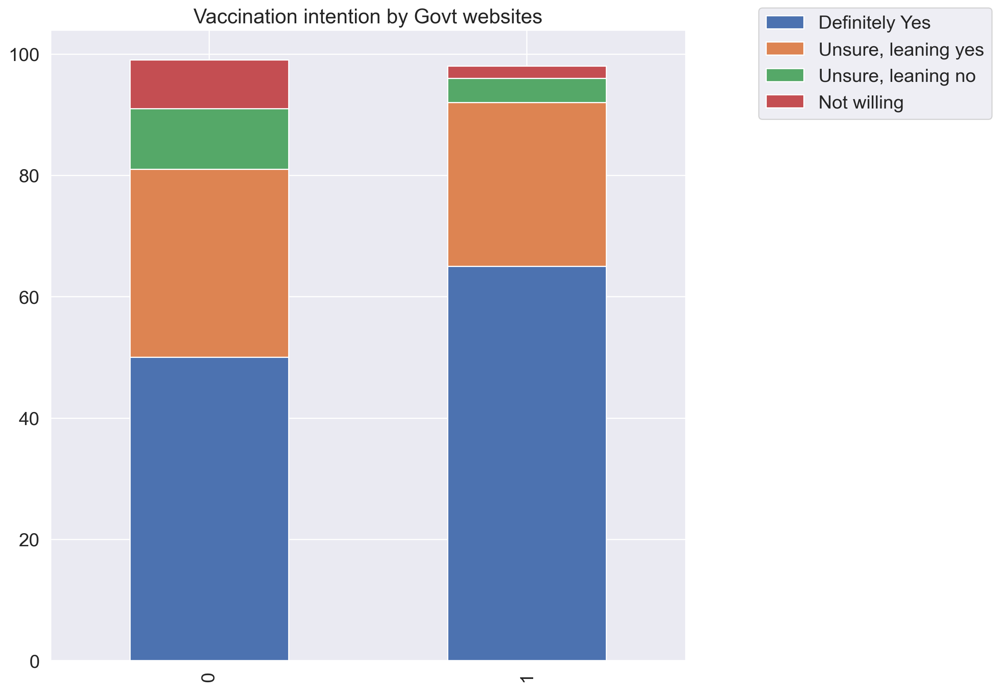

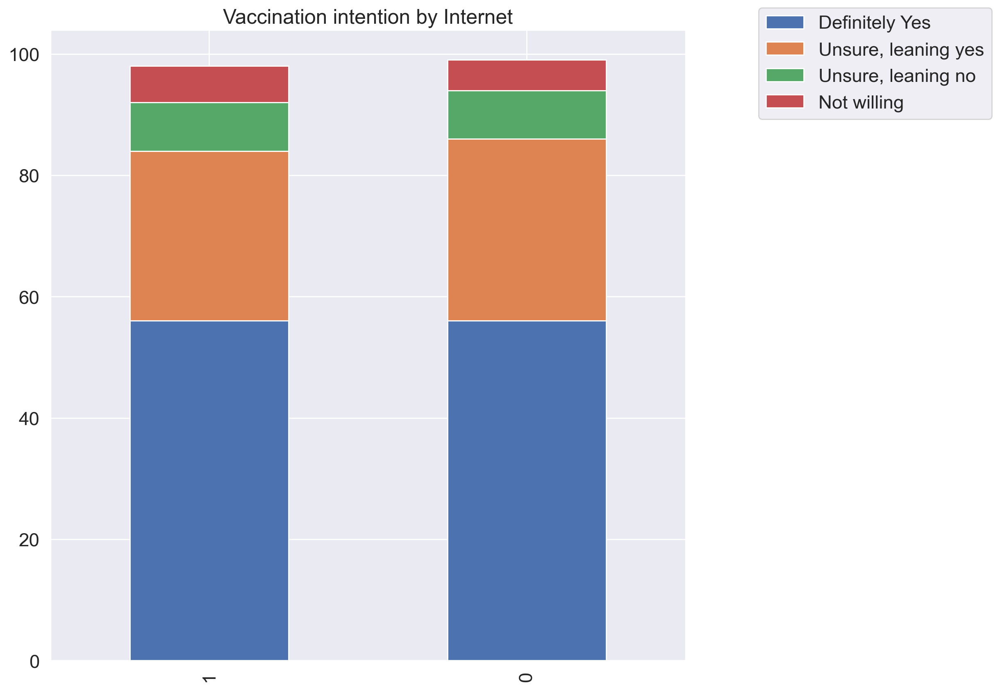

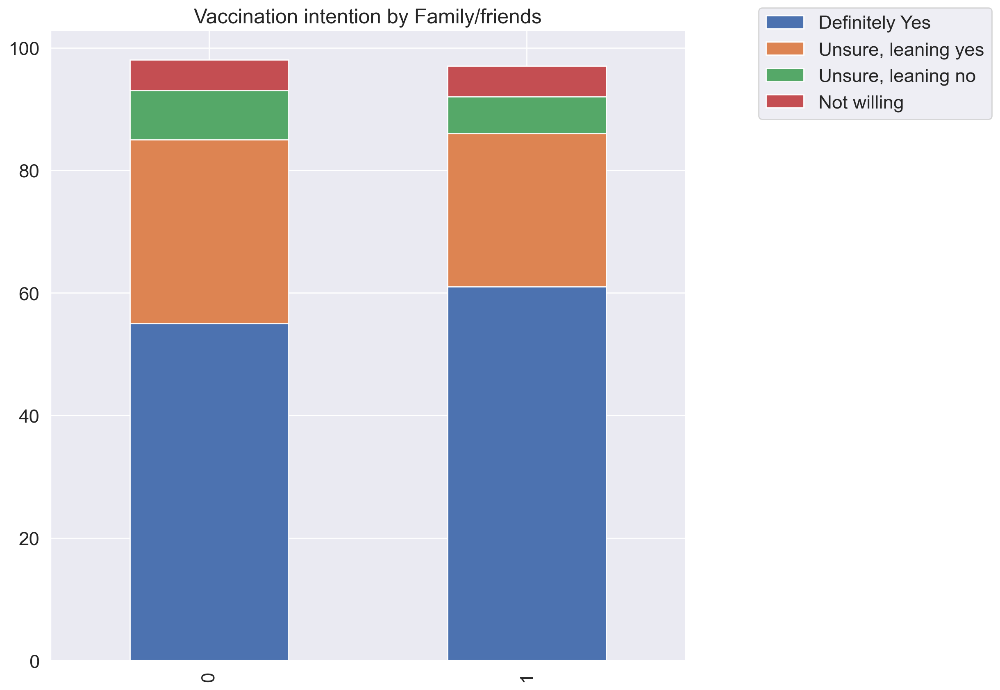

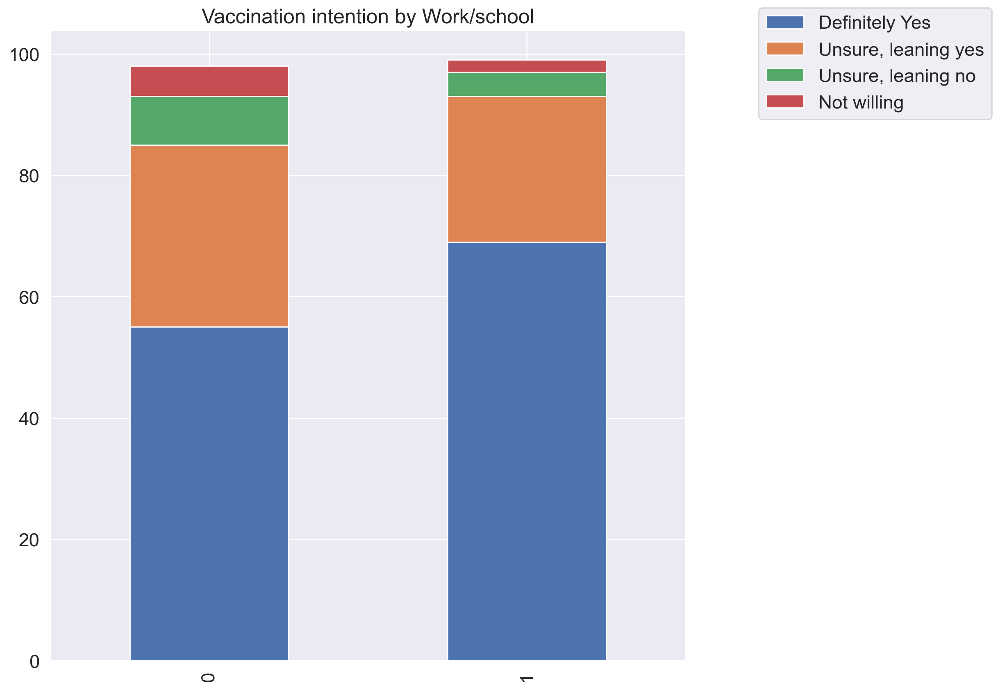

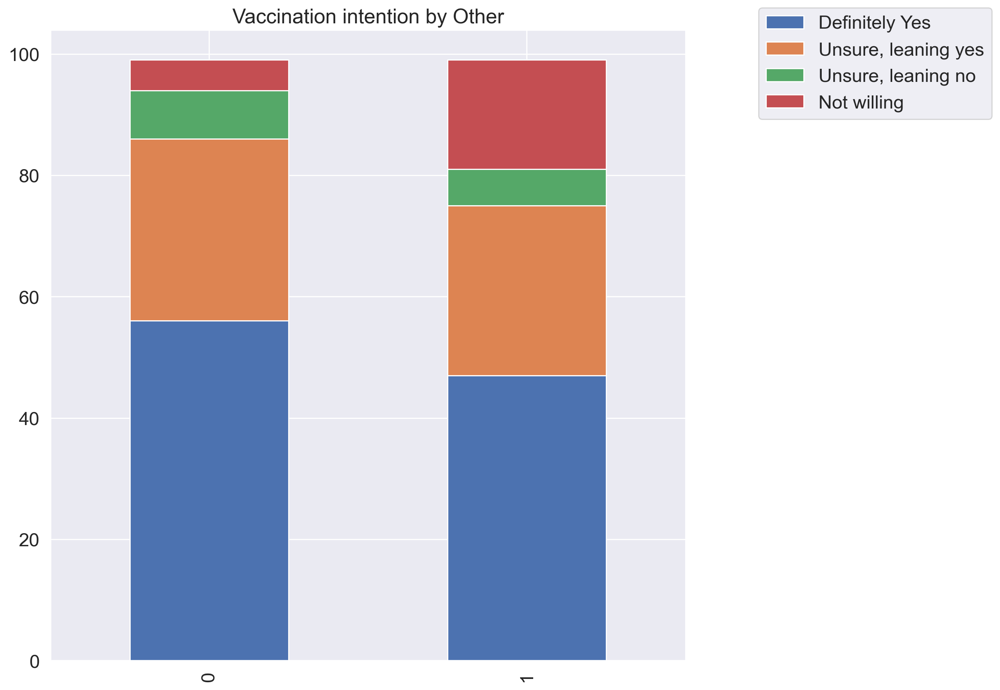

In [19]:
# Iterating through wave 1 data to create stacked barcharts.

w1_media = [('COV_TRUST_1_National television', 'Nat. television'), ('COV_TRUST_2_Satellite / international television channels', 'Satellite/International tv'), ('COV_TRUST_3_Radio', 'Radio'),
       ('COV_TRUST_4_Newspapers', 'Newspapers'), ('COV_TRUST_5_Social media (Facebook, Twitter, etc)', 'Social Media'), ('COV_TRUST_6_National public health authorities (such as the NHS or Public Health England / Wales)', 'Nat. health authorities'), 
            ('COV_TRUST_7_Healthcare workers', 'Healthcare workers'), ('COV_TRUST_8_International health authorities (such as The World Health Organization)', 'Int. Health authorities'), ('COV_TRUST_9_Government websites', 'Govt websites'),
            ('COV_TRUST_10_The internet or search engines', 'Internet'), ('COV_TRUST_11_Family and friends', 'Family/friends'), ('COV_TRUST_12_Work, school, or college', 'Work/school'), ('COV_TRUST_13_Other (please specify)', 'Other')]

for item in w1_media:
    df_group, df_chart = group_analysis(w1, 'COV_VAC_SELF', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])

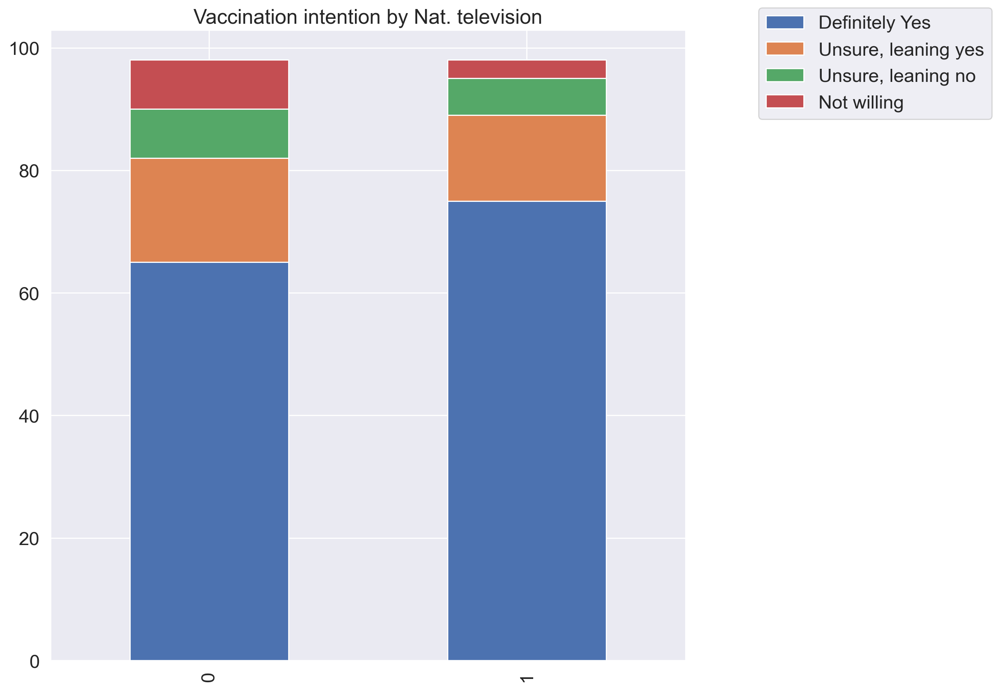

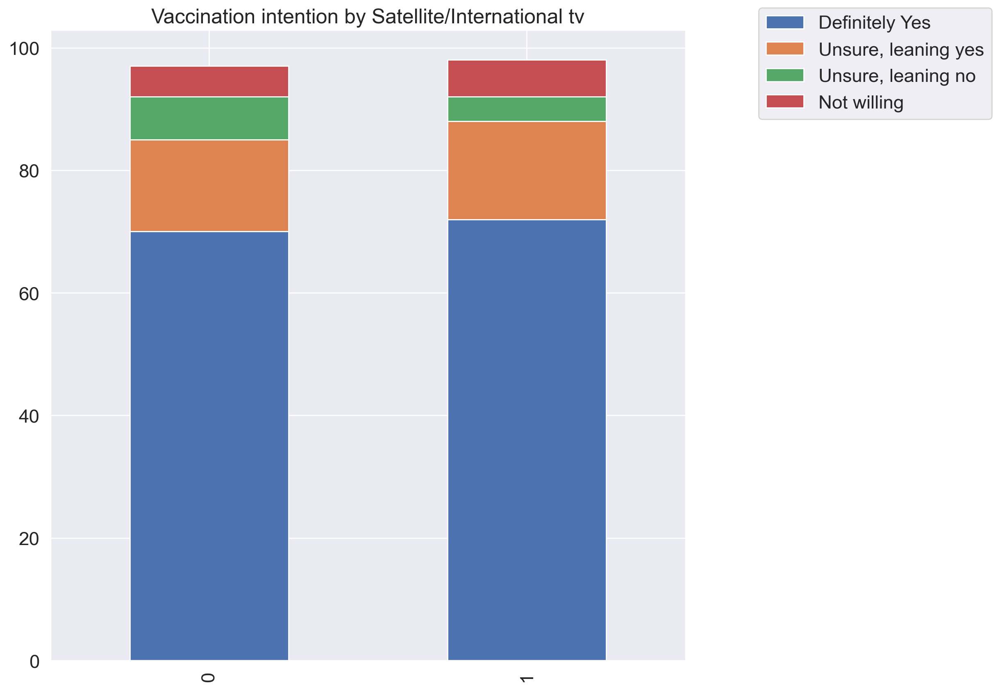

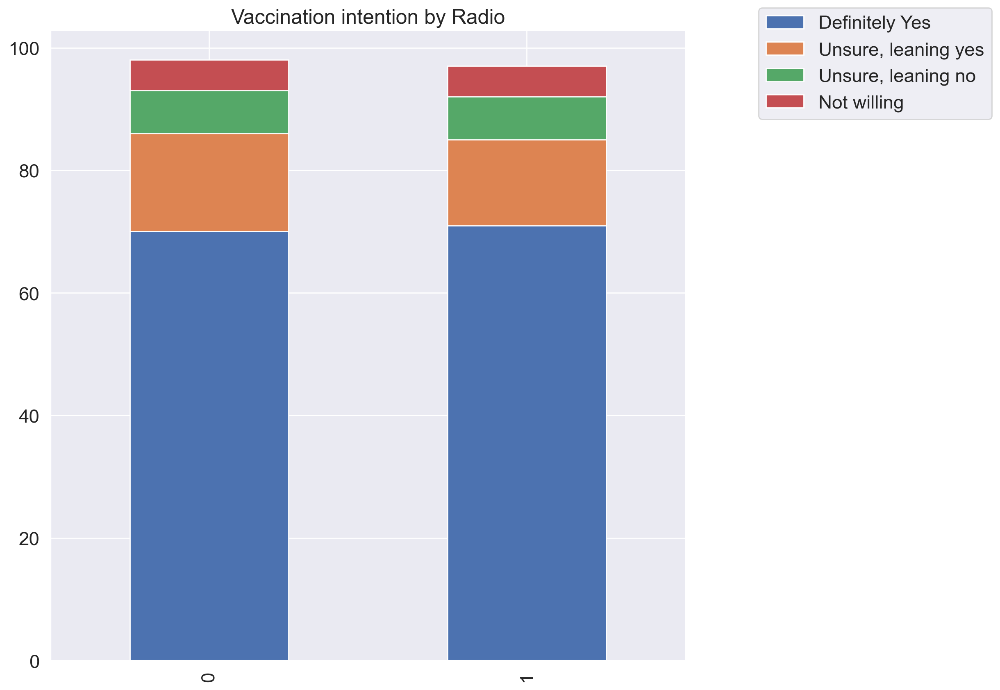

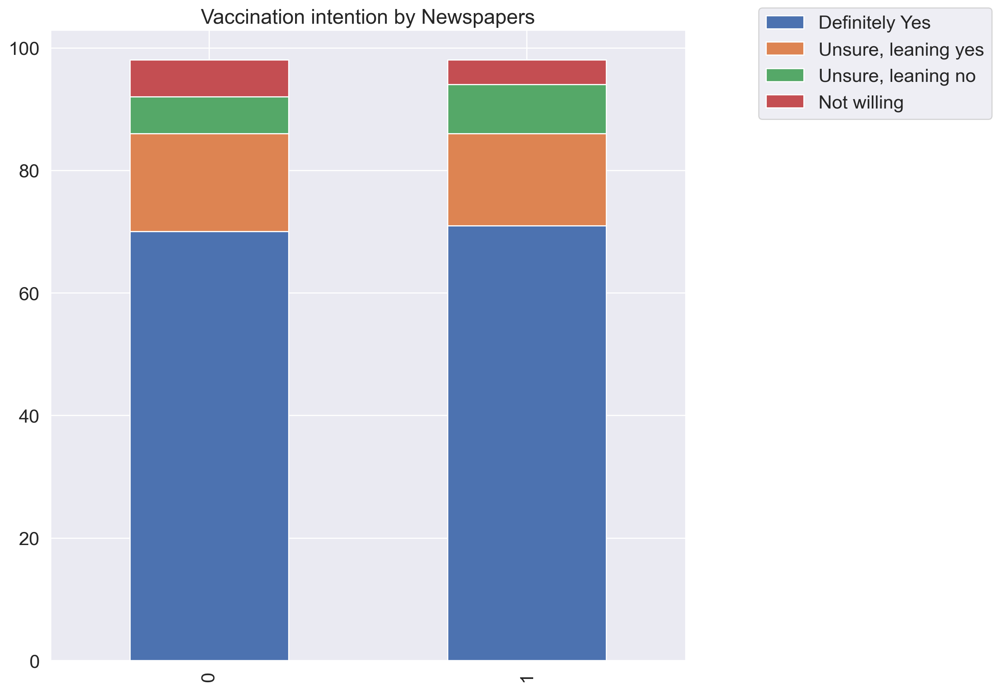

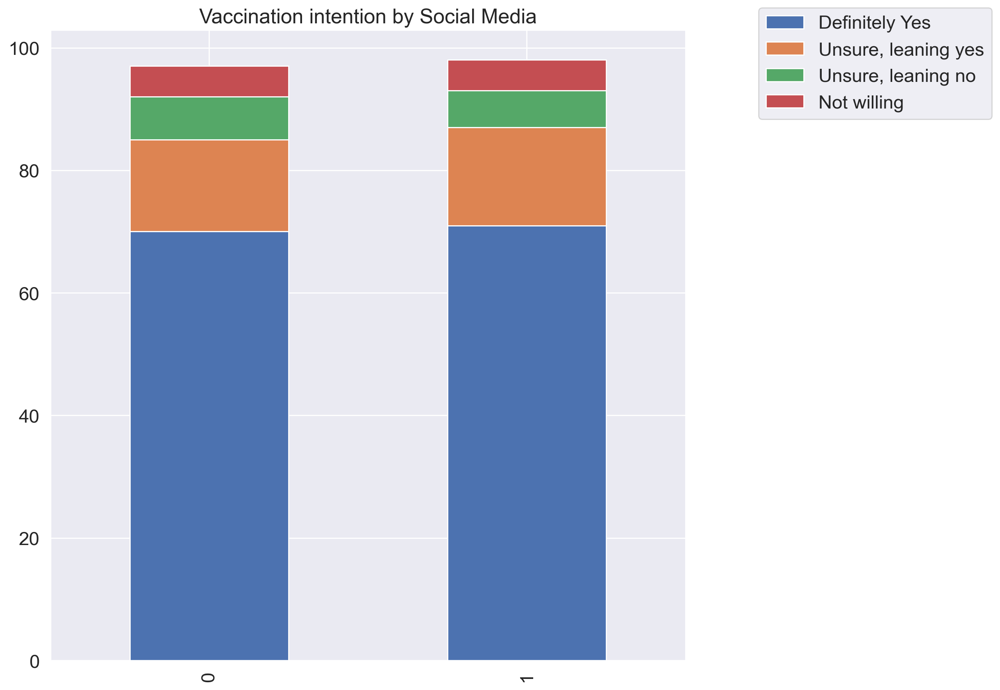

...

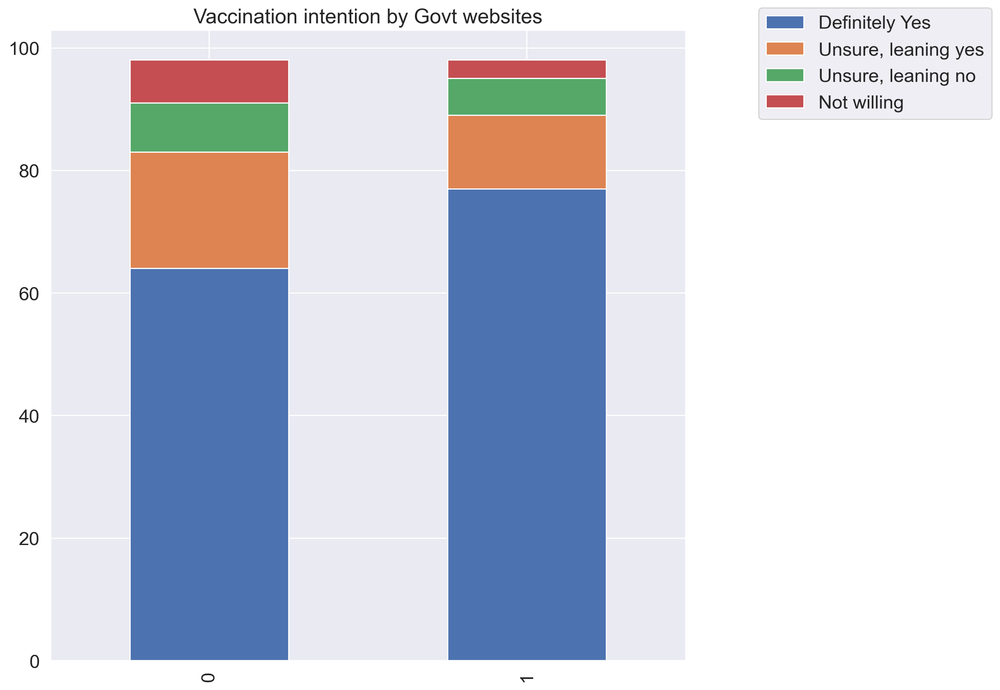

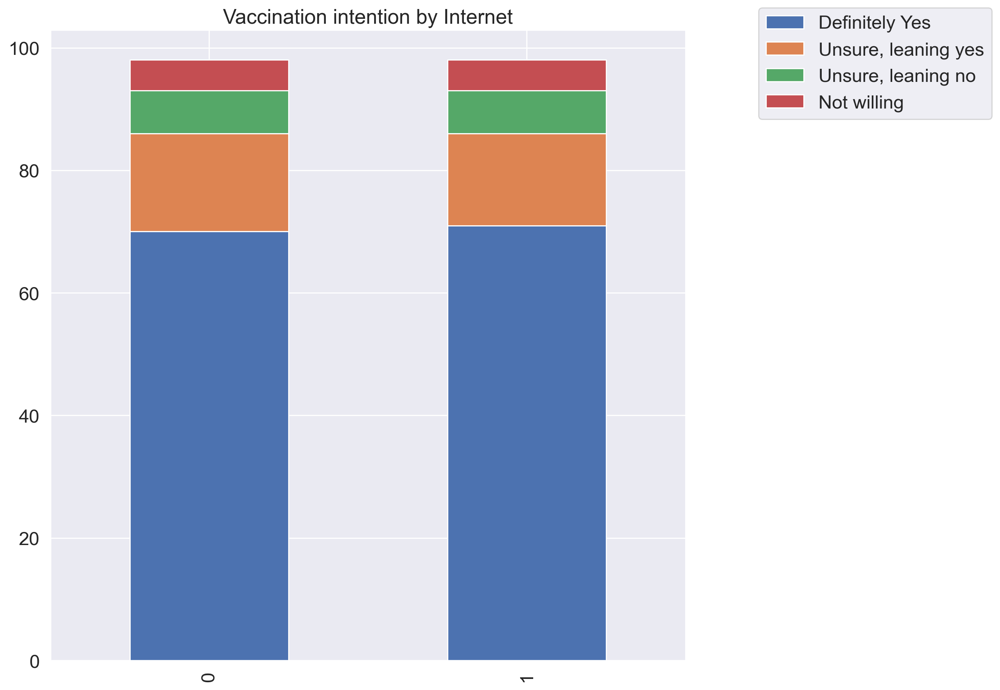

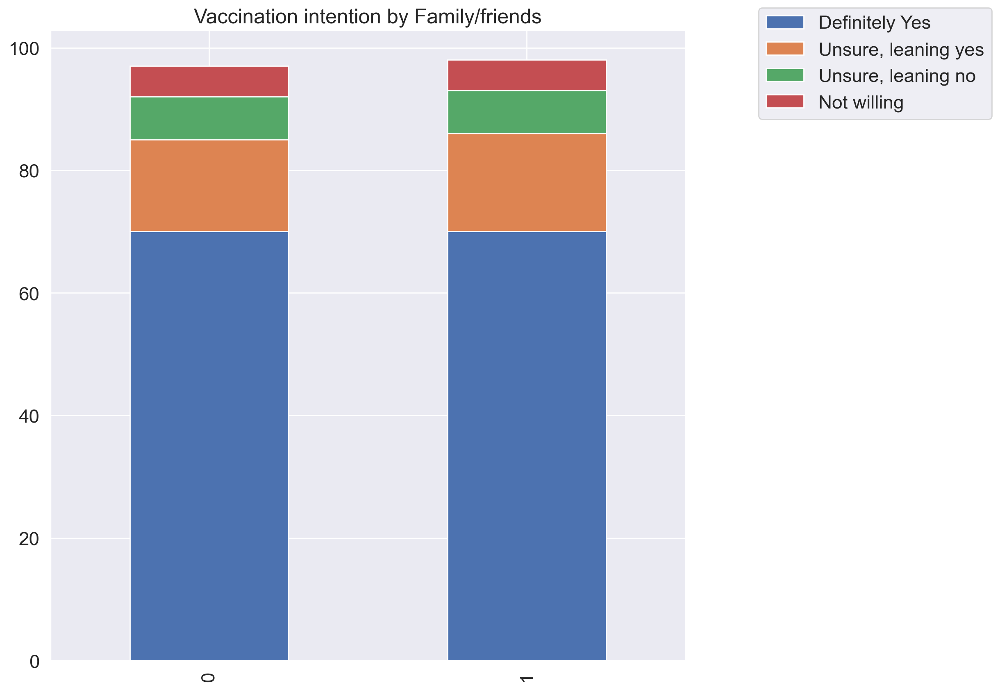

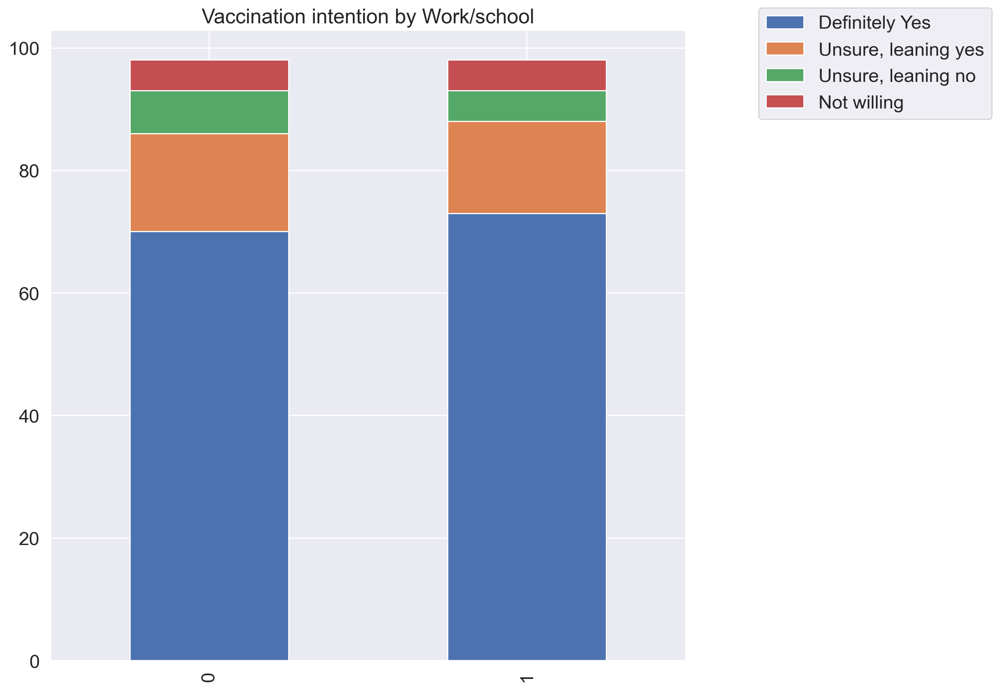

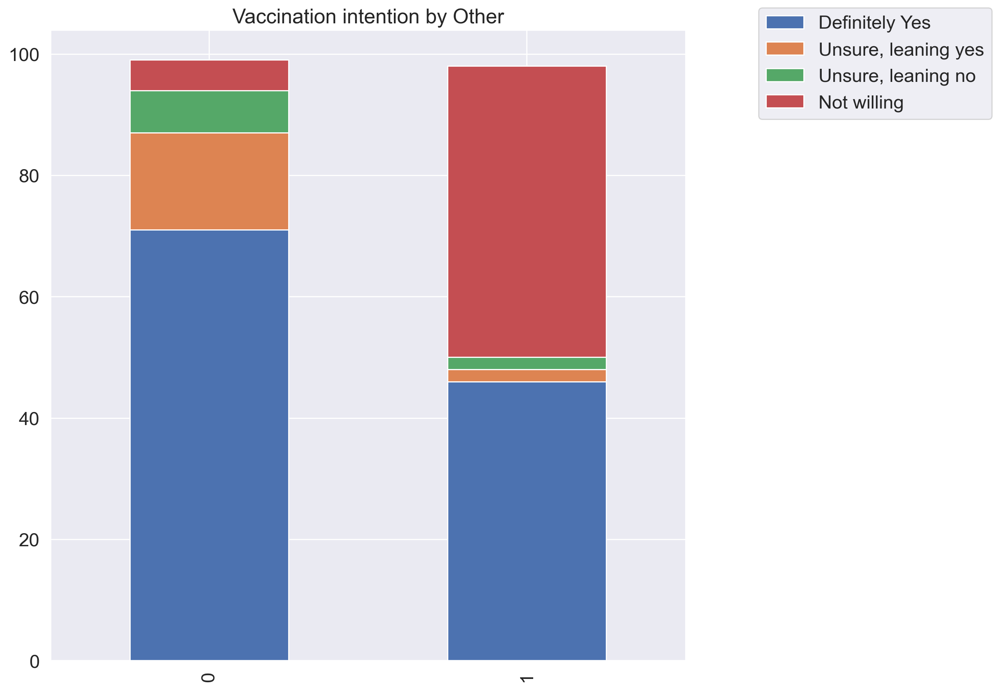

In [20]:
# Iterating through wave 2 data to create stacked barcharts.

w2_media = [('COV_TRUST_1_National television', 'Nat. television'), ('COV_TRUST_2_Satellite / international television channels', 'Satellite/International tv'), ('COV_TRUST_3_Radio', 'Radio'),
       ('COV_TRUST_4_Newspapers', 'Newspapers'), ('COV_TRUST_5_Social media (Facebook, Twitter, etc)', 'Social Media'), ('COV_TRUST_6_National public health authorities (such as the NHS or Public Health England / Wales)', 'Nat. health authorities'), 
            ('COV_TRUST_7_Healthcare workers', 'Healthcare workers'), ('COV_TRUST_8_International health authorities (such as The World Health Organization)', 'Int. Health authorities'), ('COV_TRUST_9_Government websites', 'Govt websites'),
            ('COV_TRUST_10_The internet or search engines', 'Internet'), ('COV_TRUST_11_Family and friends', 'Family/friends'), ('COV_TRUST_12_Work, school, or college', 'Work/school'), ('COV_TRUST_13_Other (please specify)', 'Other')]

for item in w2_media:
    df_group, df_chart = group_analysis(w2_intention, 'intention', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])

**2) W2 Uptake**

**Analysis of Target Variables by demographic group**

In [21]:
# Creating summary dataframes from which to create charts for uptake target variables.

def uptake_group_analysis(data, target, var1, var2):
    """Creates summary dataframe of target by subgroup
    
    :param data: dataframe from which to draw information
    :target: Target variable of interest
    :var1: Variable on which to group findings
    :var2: Variable used to produce summary statistics
    :return: summary dataframe, and dataframe for charting"""
    
    
    df = ((data.groupby([var1, target])[[var2]].count() / data.groupby([var1])[[var2]].count()) * 100) # Creating summary dataframe of target breakdown per demographic category. Resulting data is shown as a proportion of total in demographic category.
    value_list = [] # Creating list of values for converting into final dataframe
    column_list = list(data[var1].unique()) # Collecting category labels
    for j in range(0, 3):
        sub_list = [] # Creating sublist of values per category label
        for a in column_list: # Iterating through category labels
            try:
                value = int(df.loc[a].iloc[j]) # Extracting each target value proportion of each category for each category label
                sub_list.append(value) # appending value to sublist
            except:
                pass
        value_list.append(sub_list) # appending sublist to values.
    
    df2 = pd.DataFrame(value_list, columns=column_list) # Creating final dataframe from value lists
    forcharting = df2.T # Transposing dataframe for ease of charting
    
    forcharting.columns = ['Yes, I have had one dose', 'Yes, I have had both doses', 'No'] # Assigning column names to final datafile 
    return df, forcharting

In [22]:
# Creating stacked bar function for uptake target. 

def uptake_stacked_bar(data, title):
    """Creates stacked barchart from dataframe
    
    :param data: dataframe from which to draw information
    :title: Chart title"""
        
    
    fig, ax = plt.subplots(figsize=(10, 10))

    # ax.plot(data=df.T, kind='bar', stacked=True, title = 'Stacked Bar Graph by dataframe')
    data.plot(ax=ax, kind='bar', stacked=True,
            title=f'Vaccination uptake by {title}')
    # ax.legend(loc='upper right')
    ax.legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()

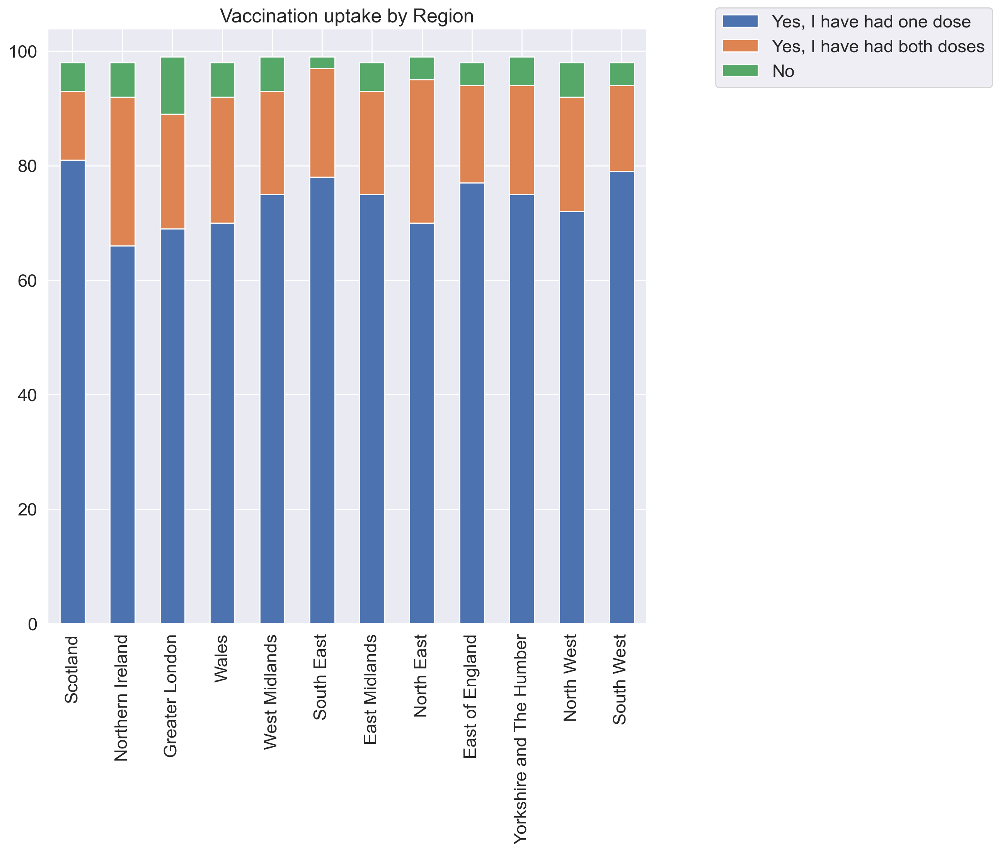

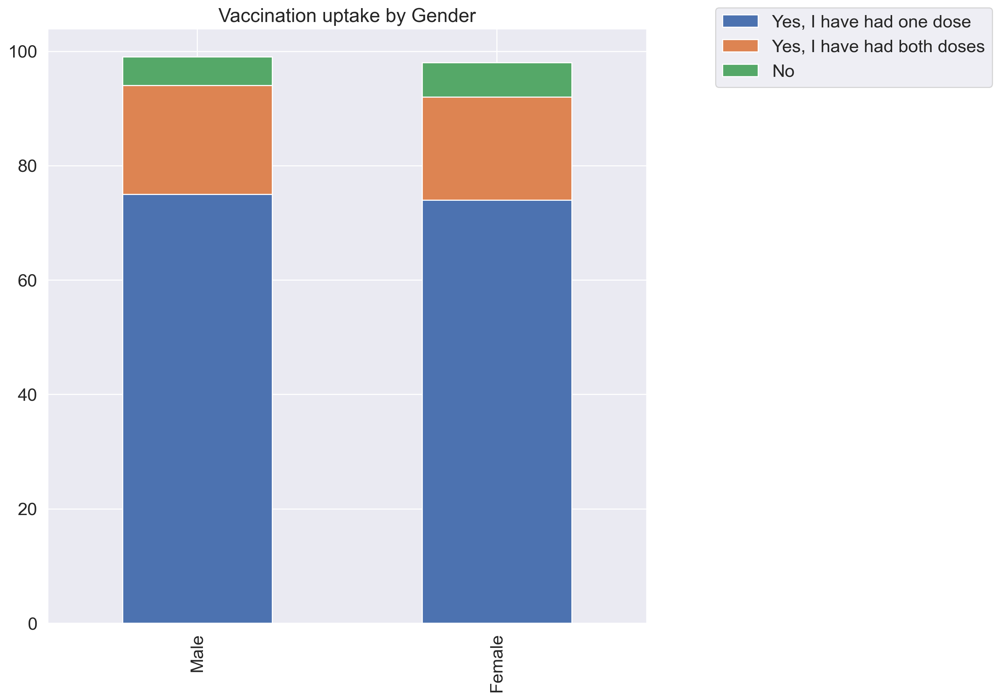

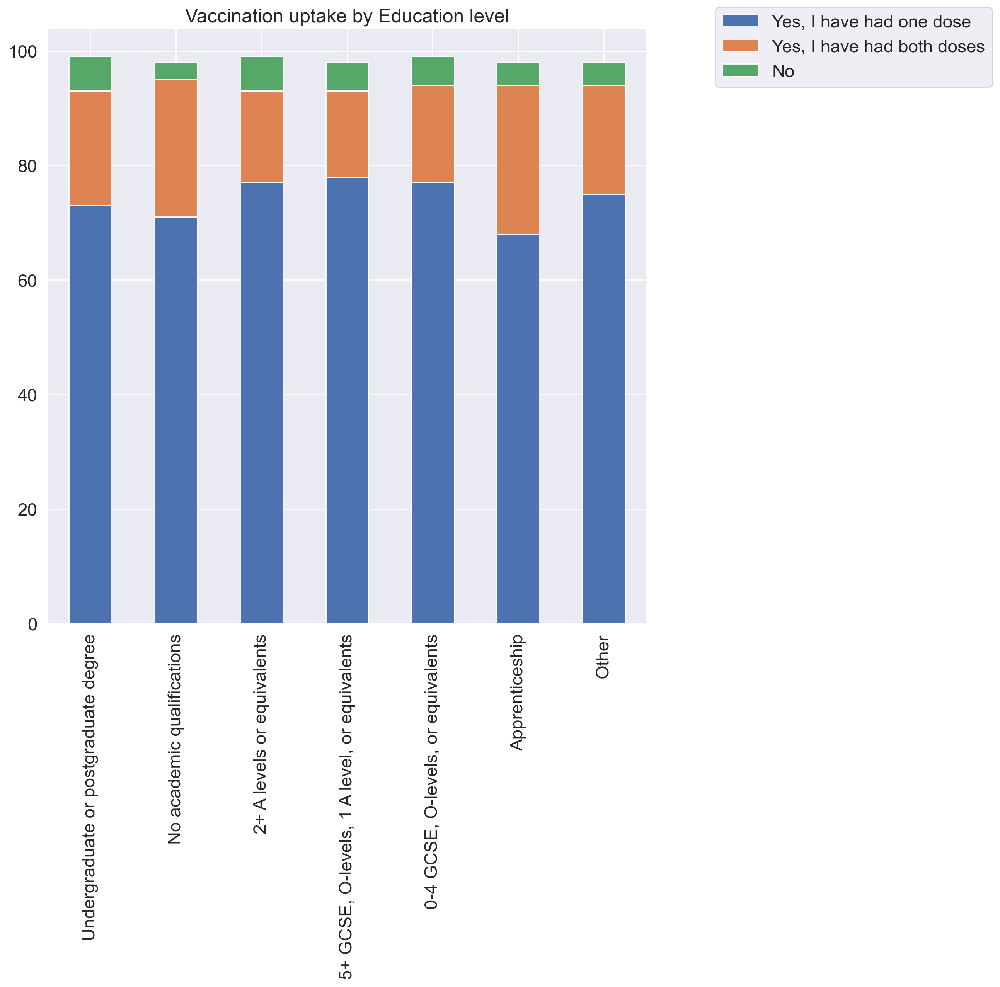

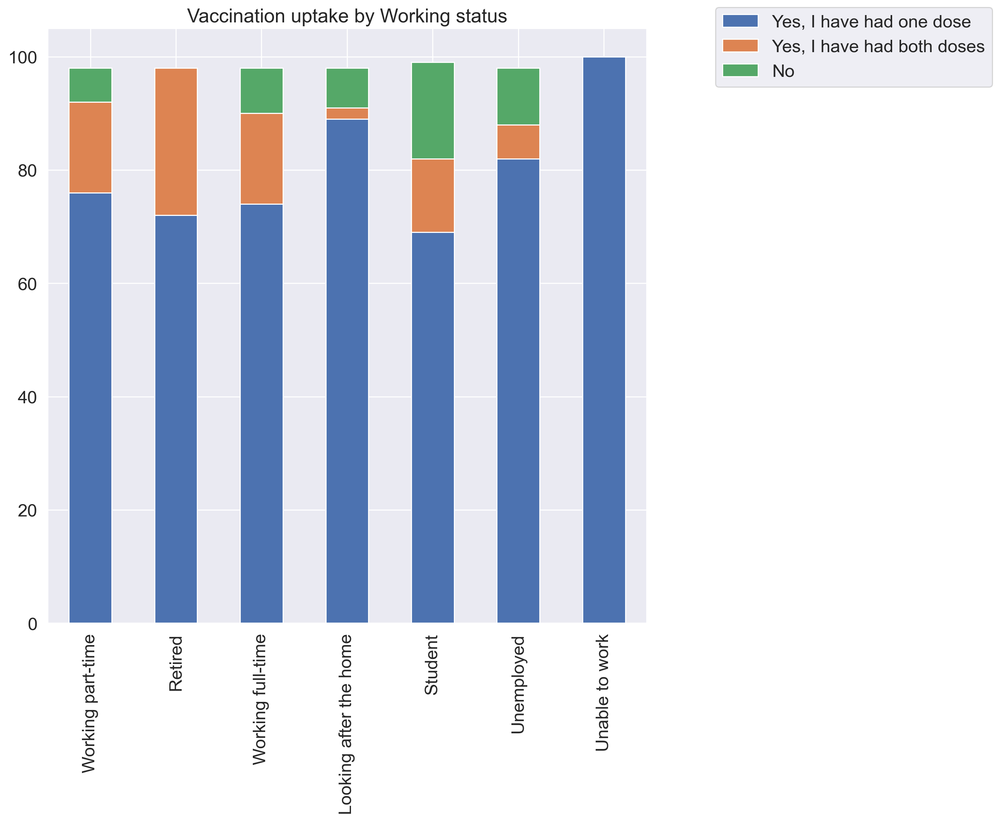

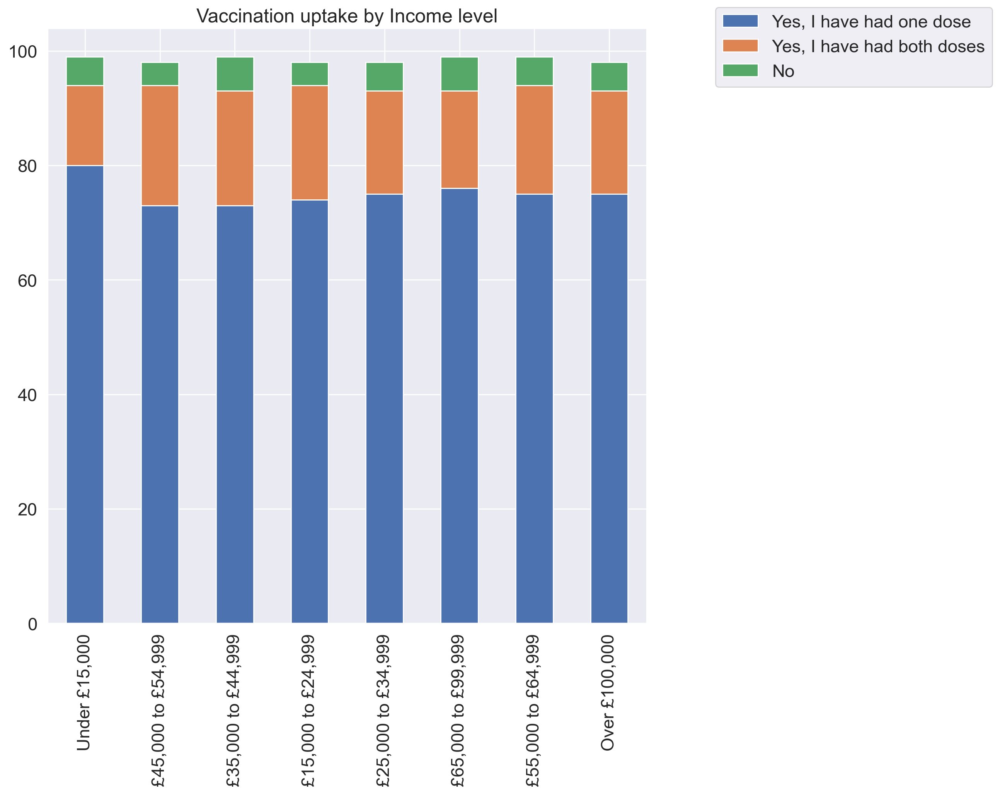

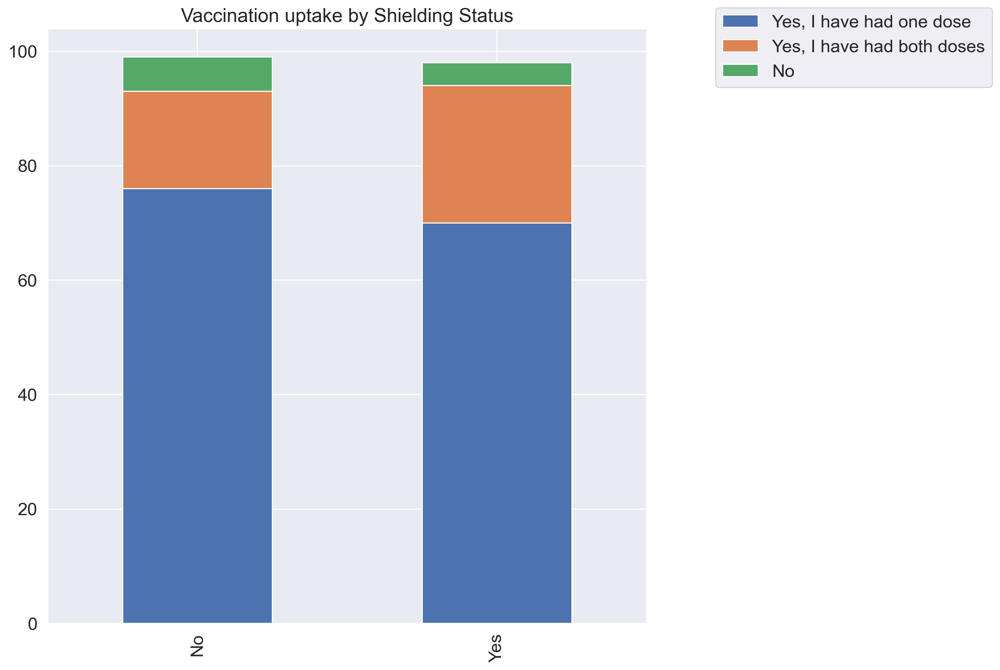

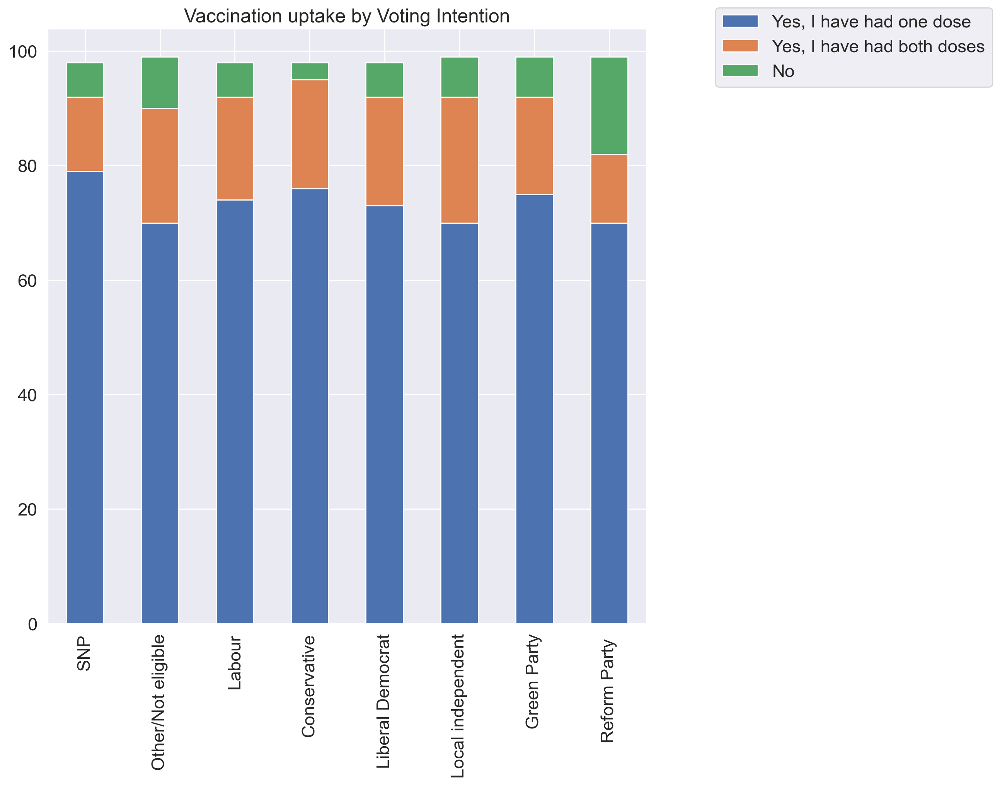

In [23]:
# Iterating through wave 2 uptake data to create stacked barcharts.

w2_list = [('DEMREG', 'Region'), ('DEMSEX', 'Gender'), 
           ('DEMEDU', 'Education level'), 
           ('DEMWRK', 'Working status'),   # Something odd going on with working status. need to look into this.
          ('DEMINC', 'Income level'),
          ('COV_SHIELD', 'Shielding Status'), ('Q71', 'Voting Intention')]

for item in w2_list:
    df_group, df_chart = uptake_group_analysis(w2uptake_nondum, 'COV_DOSE', item[0], 'DEMAGE')
    uptake_stacked_bar(df_chart, item[1])

**Analysis of Target Variables by Media Source**

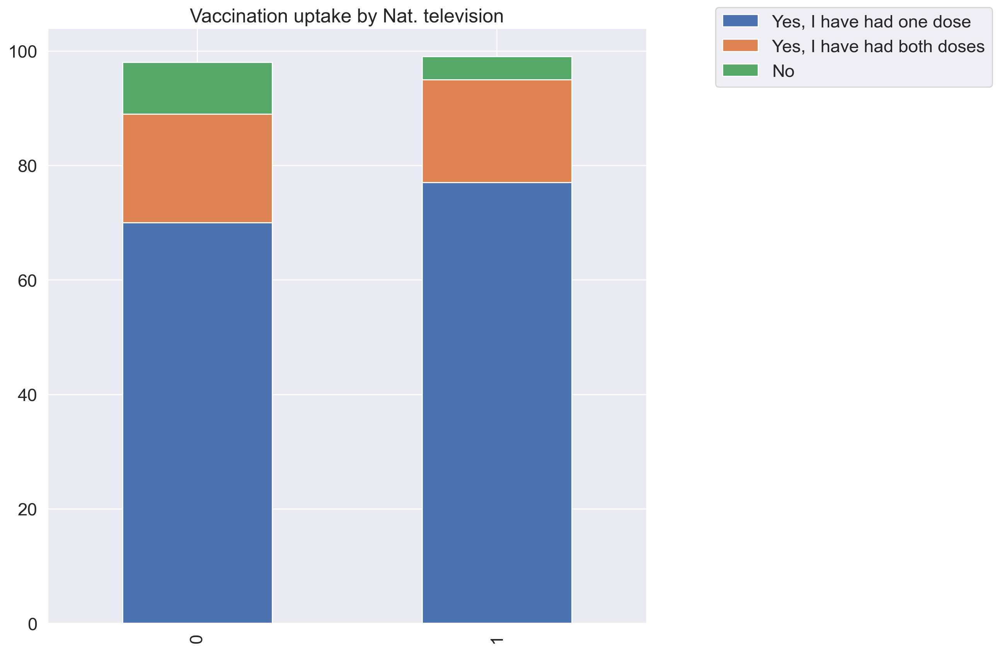

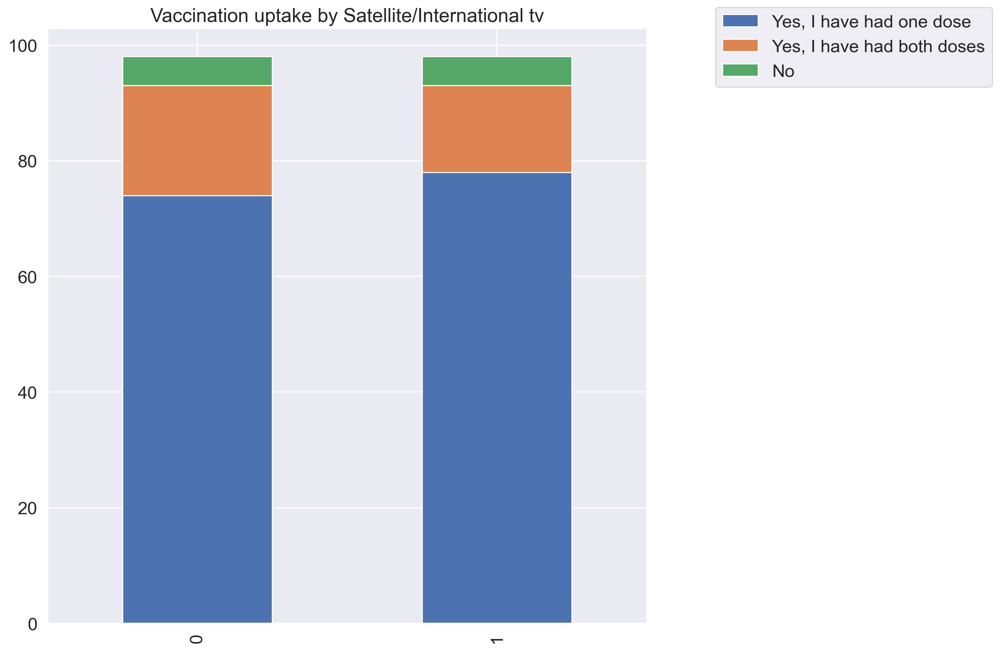

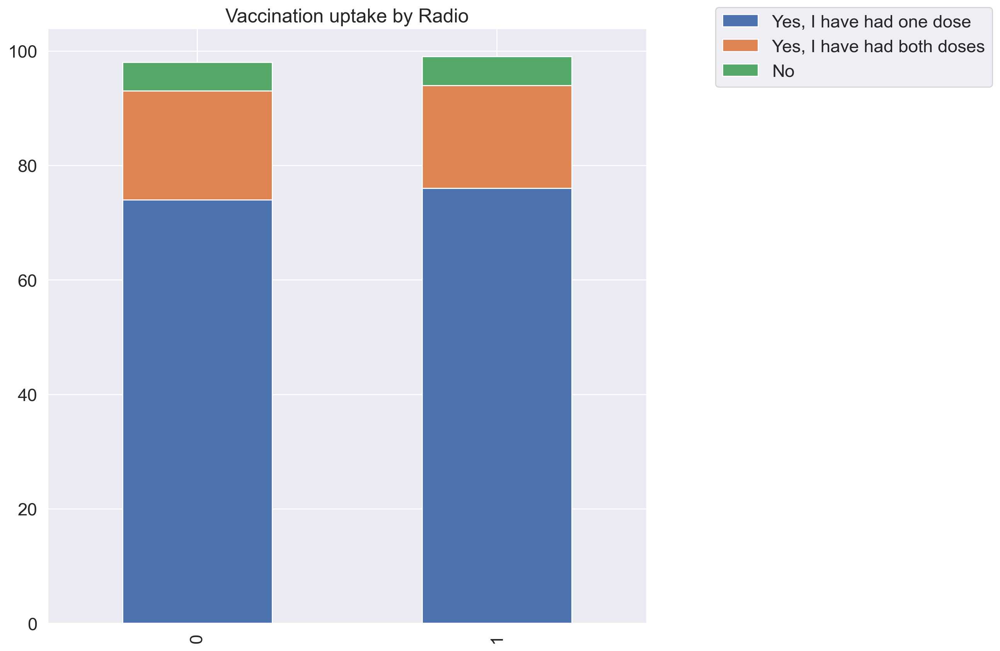

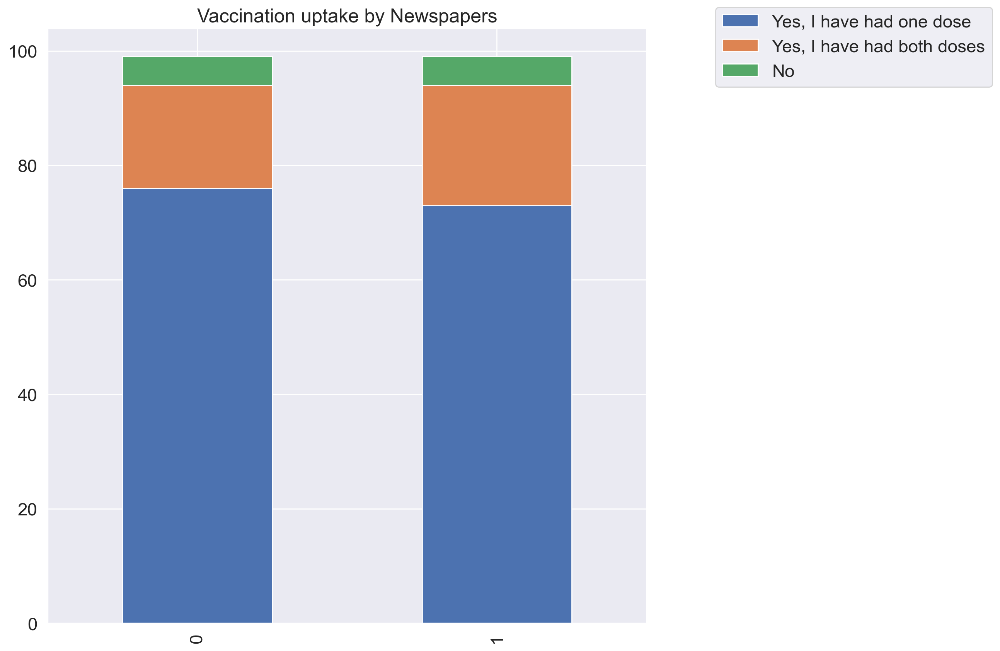

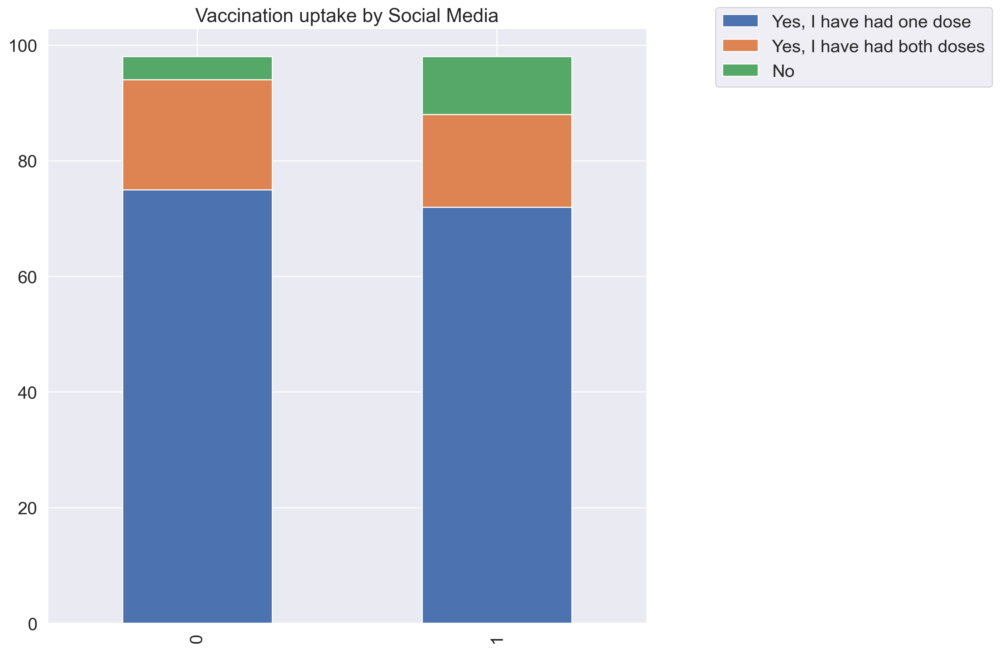

...

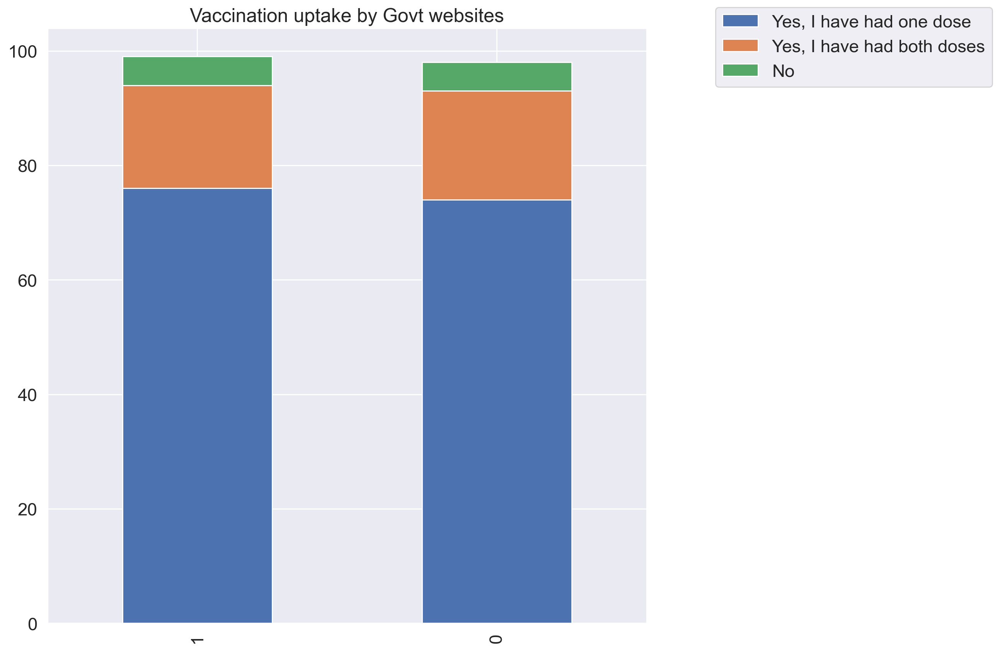

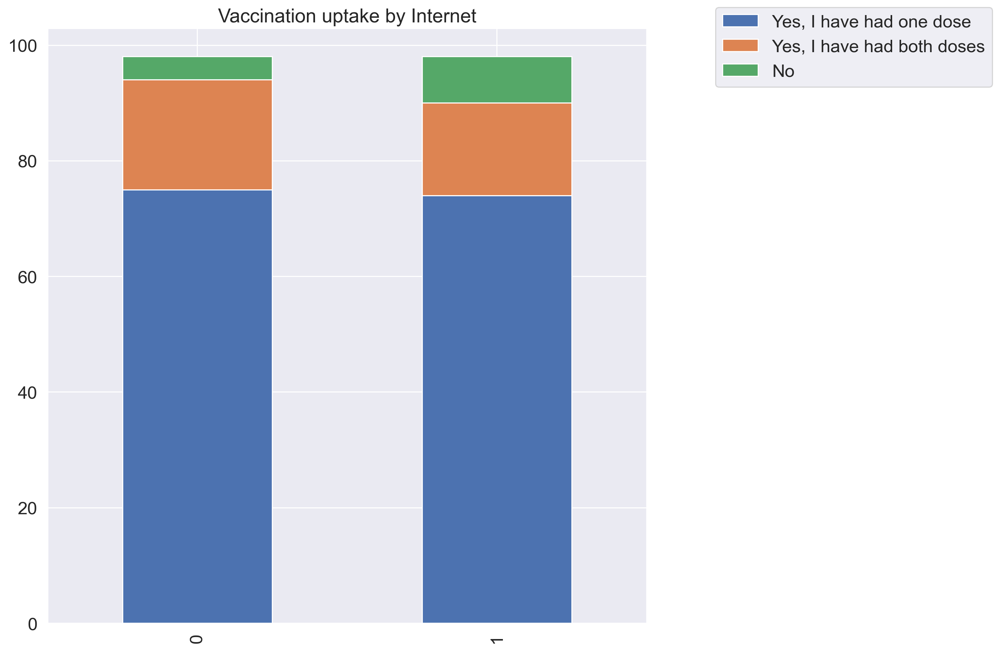

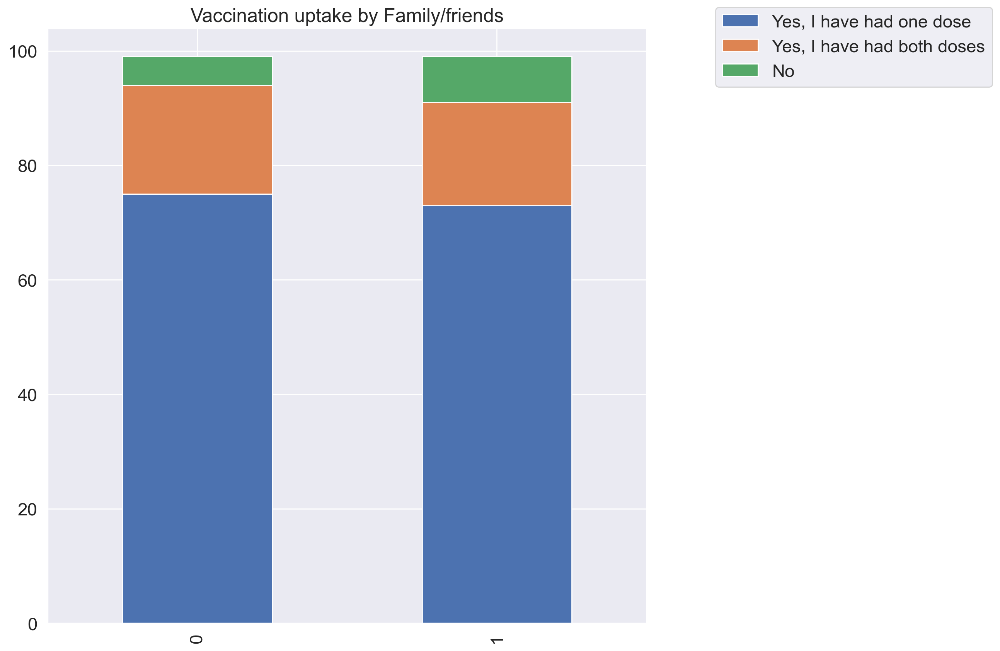

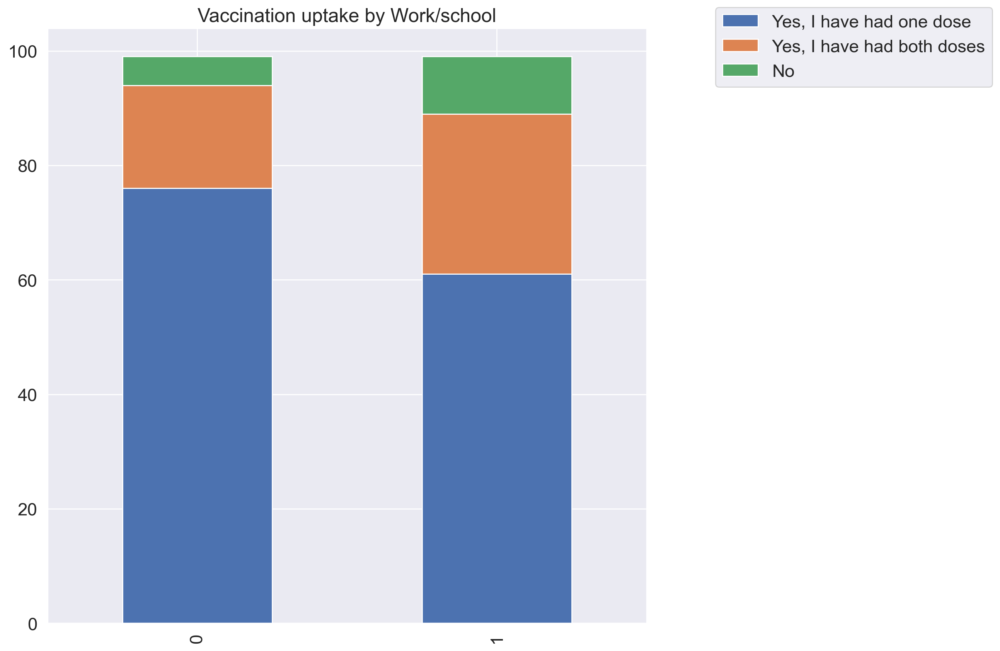

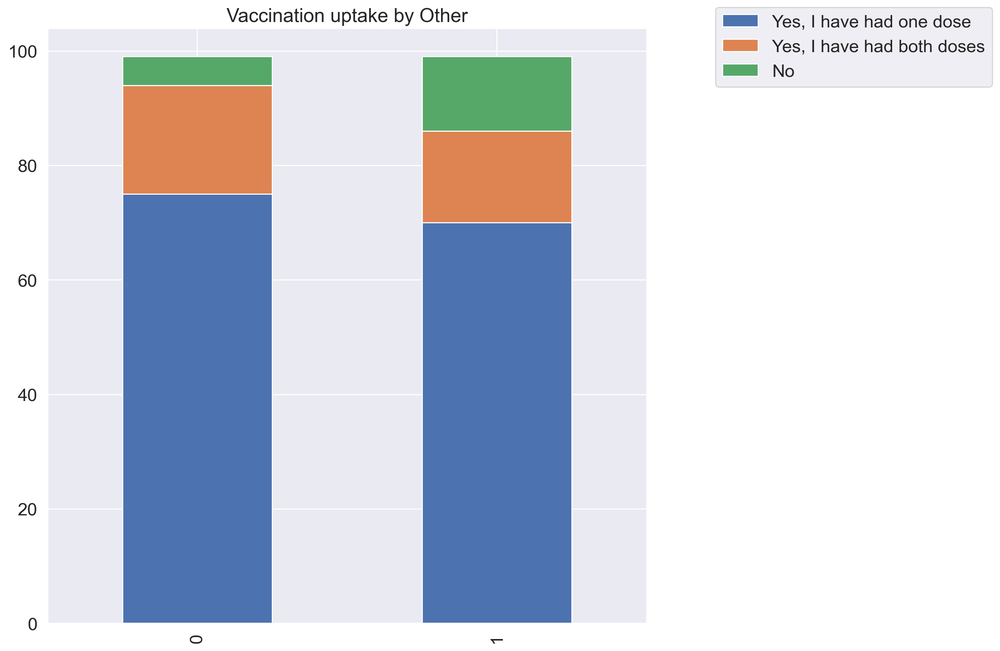

In [24]:
# Iterating through wave 2 uptake data to create stacked barcharts.

w2_media = [('COV_TRUST_1_National television', 'Nat. television'), ('COV_TRUST_2_Satellite / international television channels', 'Satellite/International tv'), ('COV_TRUST_3_Radio', 'Radio'),
       ('COV_TRUST_4_Newspapers', 'Newspapers'), ('COV_TRUST_5_Social media (Facebook, Twitter, etc)', 'Social Media'), ('COV_TRUST_6_National public health authorities (such as the NHS or Public Health England / Wales)', 'Nat. health authorities'), 
            ('COV_TRUST_7_Healthcare workers', 'Healthcare workers'), ('COV_TRUST_8_International health authorities (such as The World Health Organization)', 'Int. Health authorities'), ('COV_TRUST_9_Government websites', 'Govt websites'),
            ('COV_TRUST_10_The internet or search engines', 'Internet'), ('COV_TRUST_11_Family and friends', 'Family/friends'), ('COV_TRUST_12_Work, school, or college', 'Work/school'), ('COV_TRUST_13_Other (please specify)', 'Other')]

# df_group, df_chart = group_analysis(w2_uptake, 'COV_DOSE', 'COV_TRUST_1_National television', 'DEMAGE')

for item in w2_media:
    df_group, df_chart = uptake_group_analysis(w2_uptake, 'COV_DOSE', item[0], 'DEMAGE')
    uptake_stacked_bar(df_chart, item[1])

**Investigating Emotion and Knowledge scale variables**


**Emotion and Knowledge correlation analysis**

In [25]:
# Creating Correlation heat map function.

def correlation_heat_map(df, title='Correlation Heat Map'):
    corrs = df.corr()

    # Set figure size:
    fig, ax = plt.subplots(figsize=(7, 5))

    # Generate a mask for the upper triangle
    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Plot the heatmap with seaborn.
    # Assign the matplotlib axis the function returns. This will let us resize the labels.
    ax = sns.heatmap(corrs, mask=mask, annot=True)

    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14, rotation=30)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14, rotation=0)
    ax.set_ylim([df.shape[1], 0])
    ax.set_title(title, fontsize=15)

    return fig, ax


In [26]:
# Setting variable lists for correlation analysis.
knowledge_list = ['COV_KNOWL_1', 'COV_KNOWL_2', 'COV_KNOWL_3', 'COV_KNOWL_4', 'COV_KNOWL_5', 'COV_KNOWL_6', 'COV_KNOWL_7']
emotion_list = ['ANX_1', 'ANX_2', 'ANX_3', 'ANX_4', 'ANX_5', 'ANX_6', 'DREAD']

C:\Users\laure\AppData\Local\Temp\ipykernel_3748\861279381.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corrs, dtype=np.bool)


(<Figure size 700x500 with 2 Axes>,
 <AxesSubplot:title={'center':'W1 Knowledge correlations'}>)

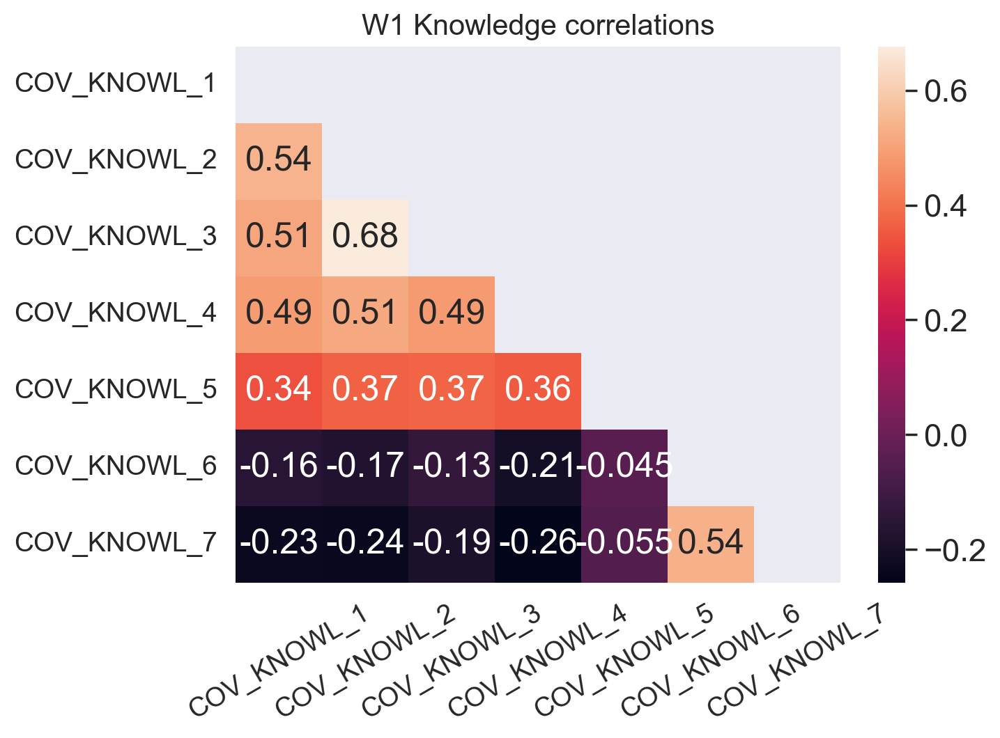

In [27]:
# W1 knowledge scale correlations
correlation_heat_map(w1_nondum[knowledge_list], 'W1 Knowledge correlations')

C:\Users\laure\AppData\Local\Temp\ipykernel_3748\861279381.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corrs, dtype=np.bool)


(<Figure size 700x500 with 2 Axes>,
 <AxesSubplot:title={'center':'W1 Emotion correlations'}>)

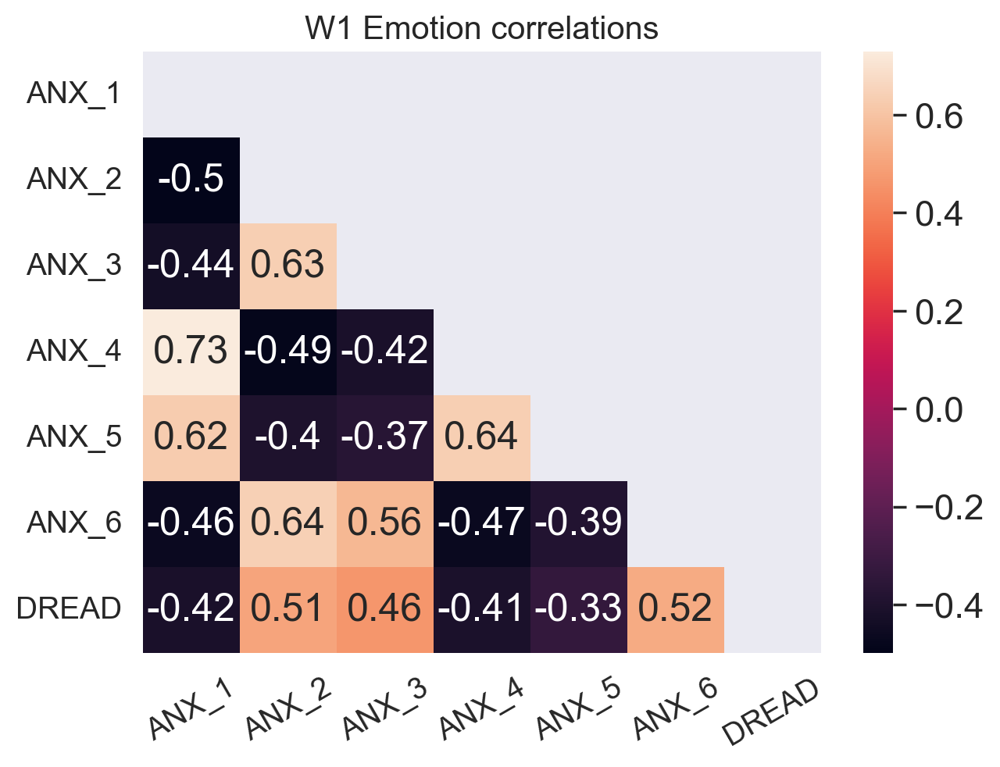

In [28]:
# W1 emotion scale correlations
correlation_heat_map(w1_nondum[emotion_list], 'W1 Emotion correlations')

C:\Users\laure\AppData\Local\Temp\ipykernel_3748\861279381.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corrs, dtype=np.bool)


(<Figure size 700x500 with 2 Axes>,
 <AxesSubplot:title={'center':'W2 Knowledge correlations'}>)

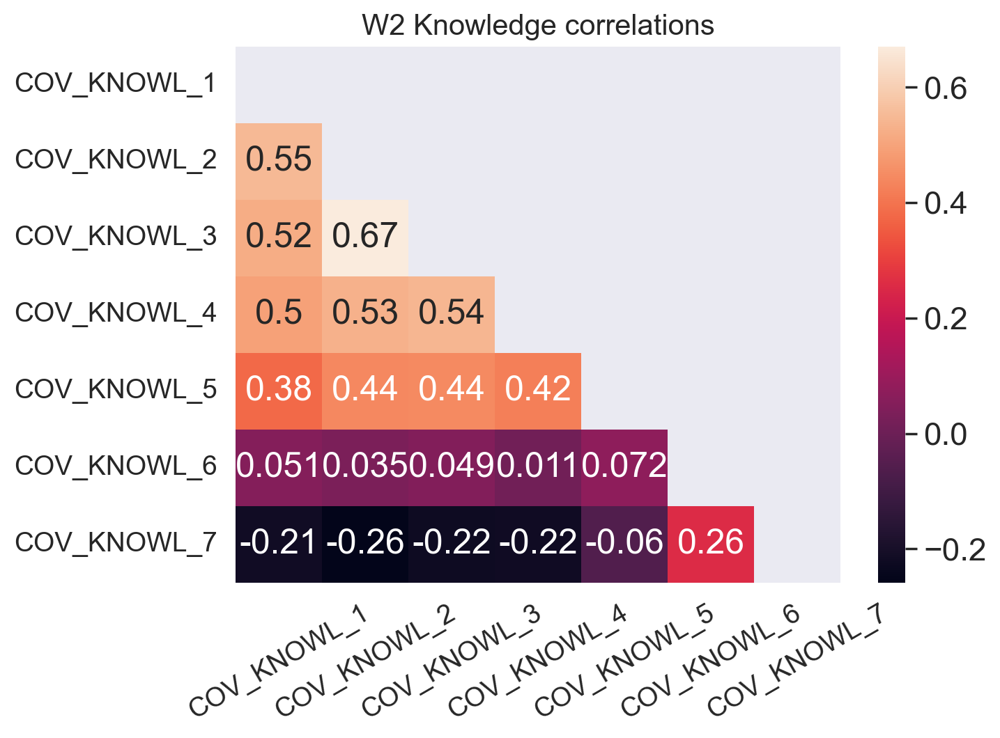

In [29]:
# W2 knowledge scale correlations
correlation_heat_map(w2_intention[knowledge_list], 'W2 Knowledge correlations')

C:\Users\laure\AppData\Local\Temp\ipykernel_3748\861279381.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corrs, dtype=np.bool)


(<Figure size 700x500 with 2 Axes>,
 <AxesSubplot:title={'center':'W2 Emotion correlations'}>)

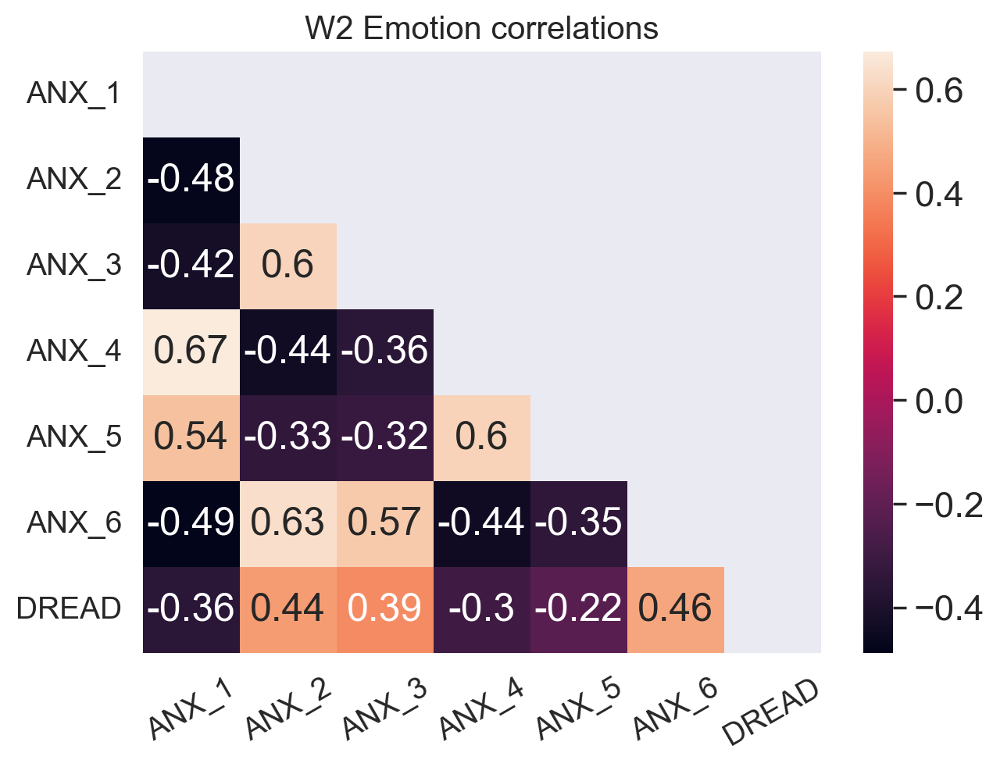

In [30]:
# W2 emotion scale correlations
correlation_heat_map(w2_intention[emotion_list], 'W2 Emotion correlations')

**Knowledge & emotion vs willingness and uptake**

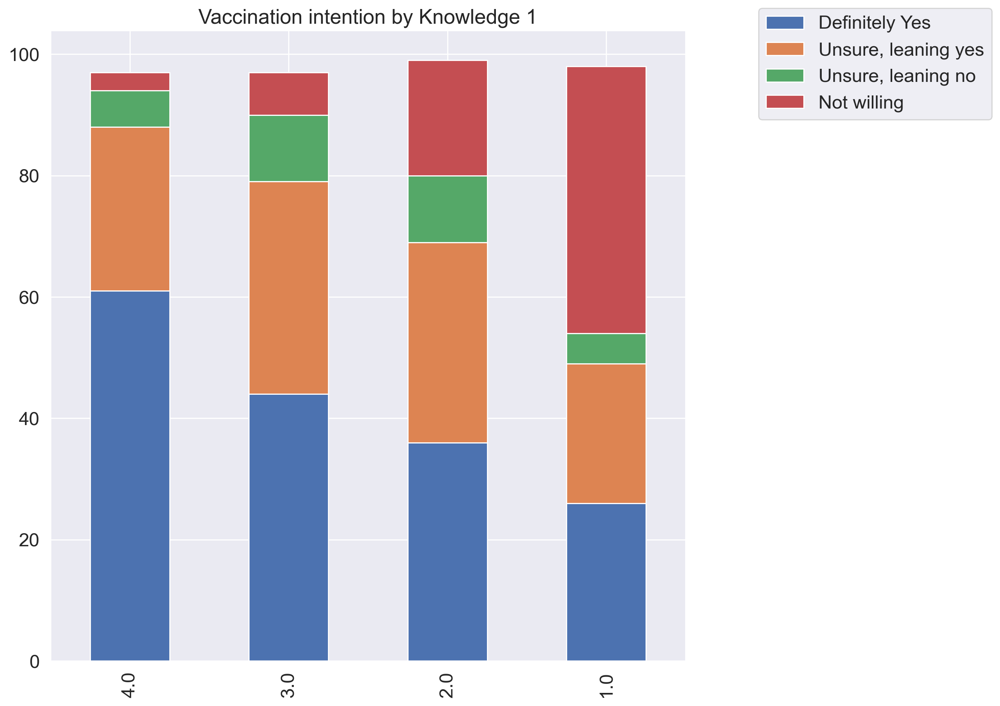

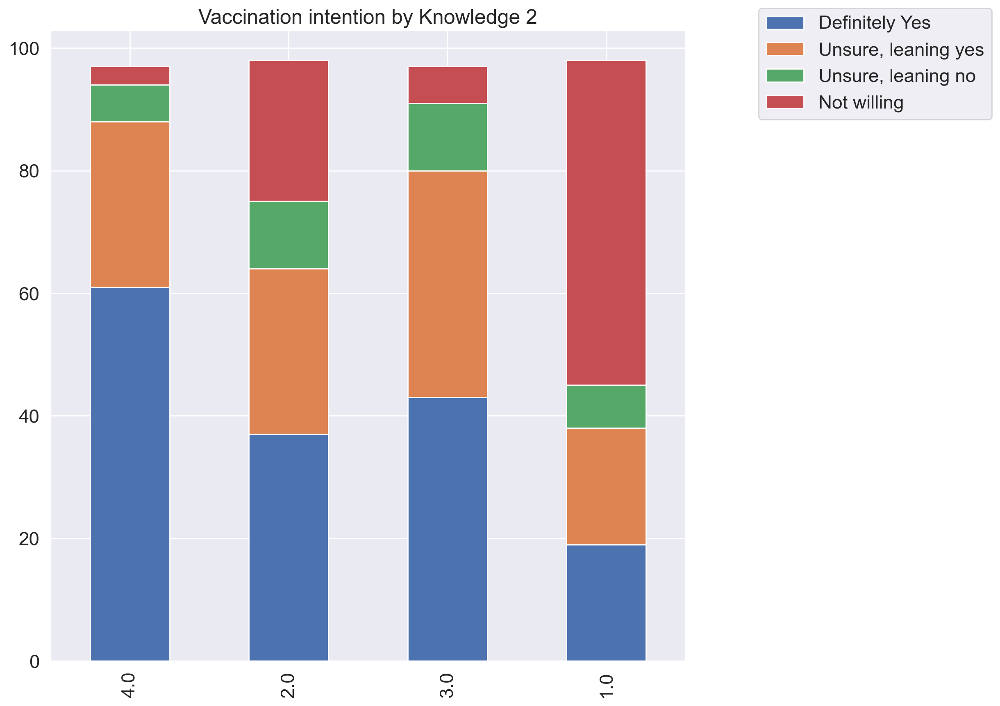

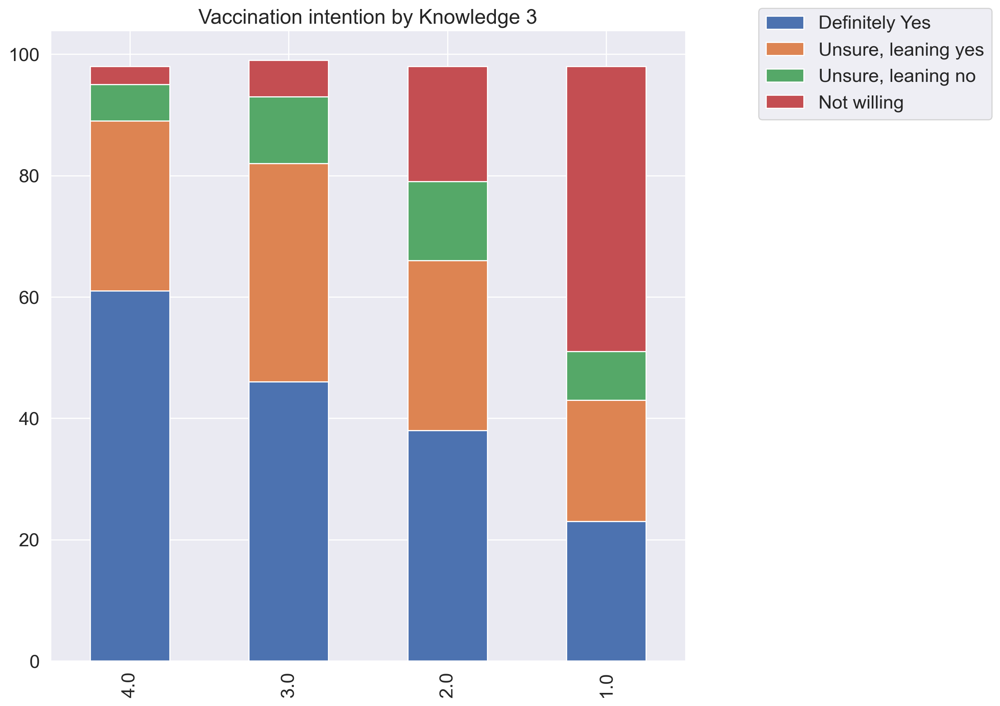

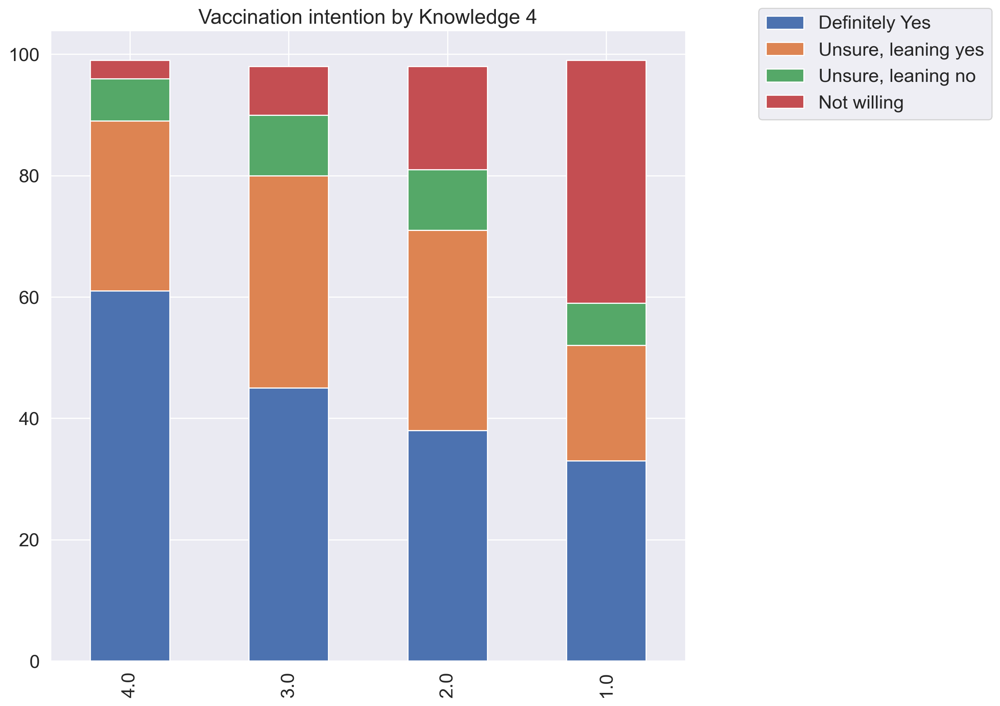

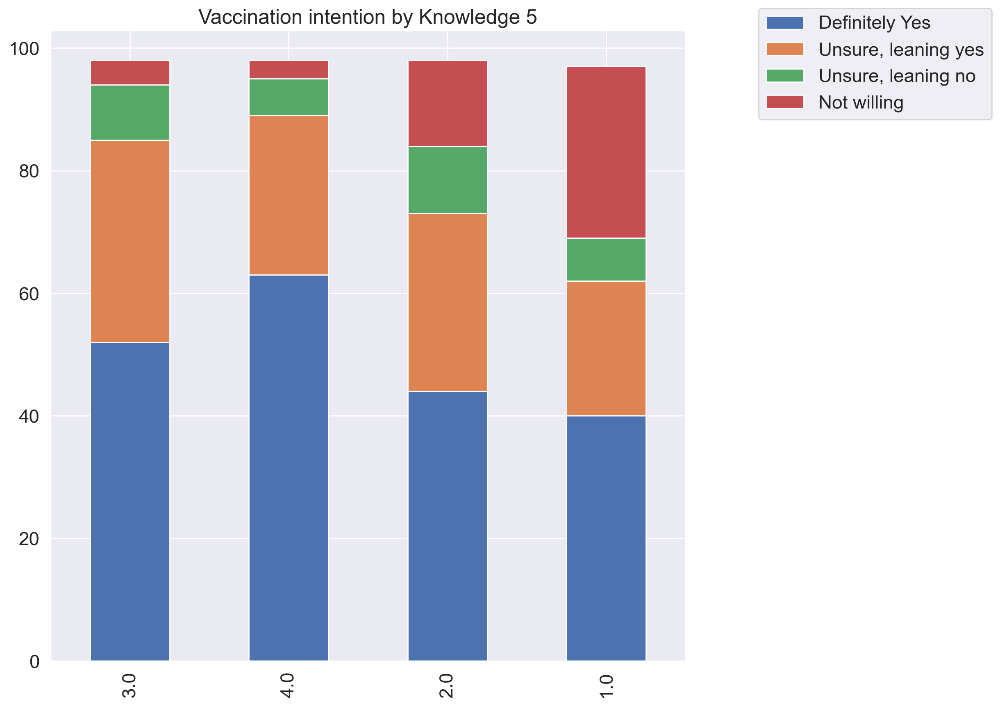

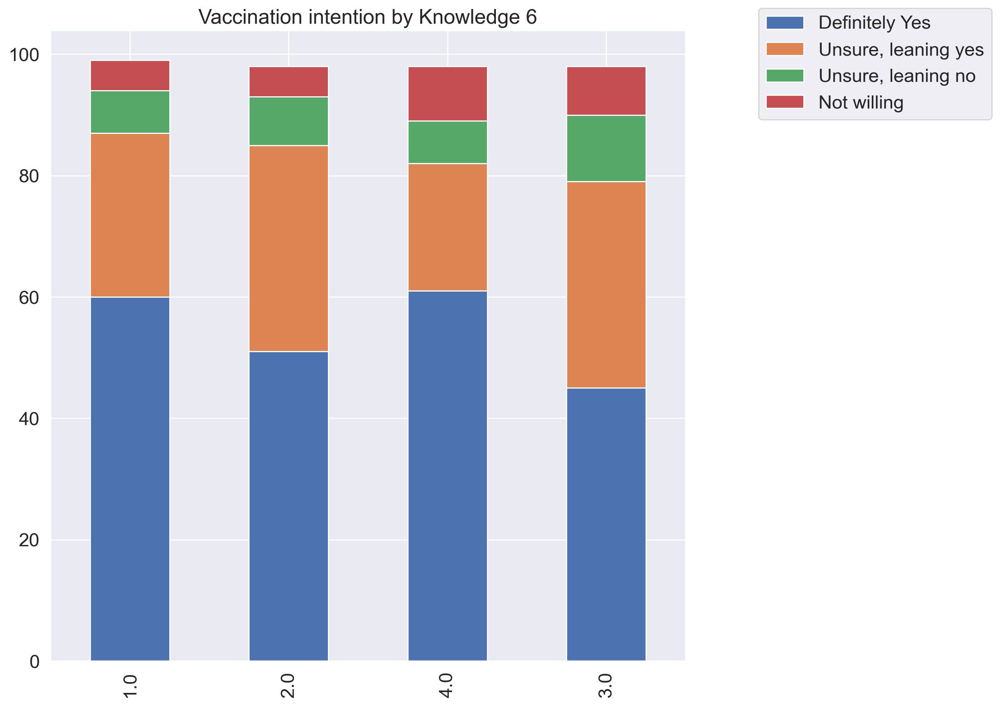

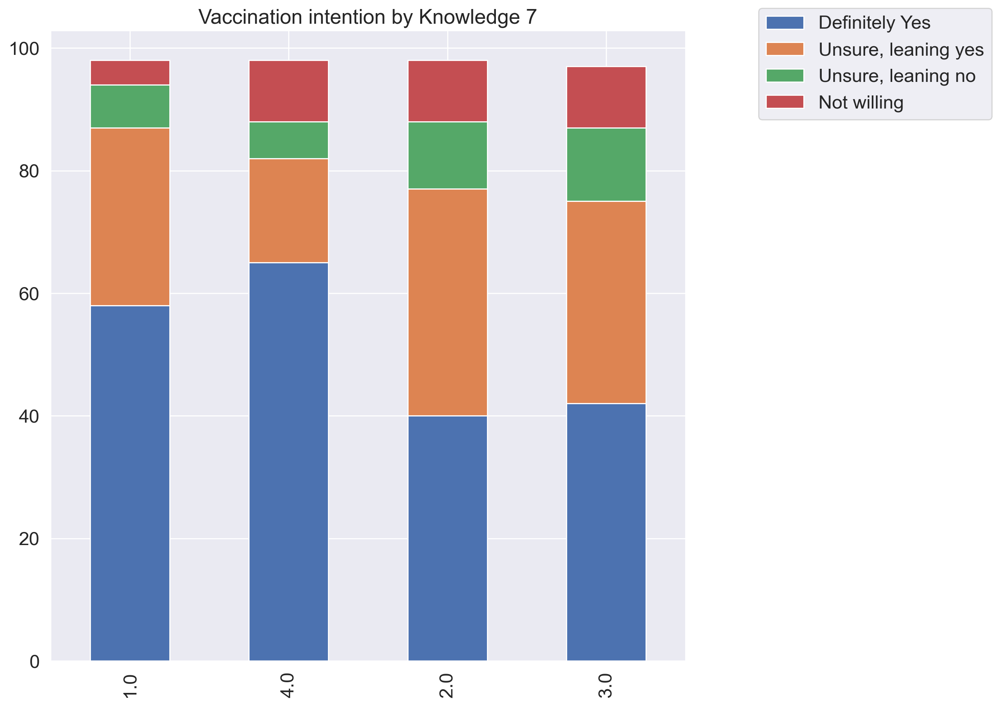

In [31]:
# W1 knowledge variables and vaccine willingness

w1_list = [('COV_KNOWL_1', 'Knowledge 1'), ('COV_KNOWL_2', 'Knowledge 2'), 
           ('COV_KNOWL_3', 'Knowledge 3'), ('COV_KNOWL_4', 'Knowledge 4'), 
           ('COV_KNOWL_5', 'Knowledge 5'), 
           ('COV_KNOWL_6', 'Knowledge 6'), ('COV_KNOWL_7', 'Knowledge 7')]

for item in w1_list:
    df_group, df_chart = group_analysis(w1_nondum, 'COV_VAC_SELF', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])

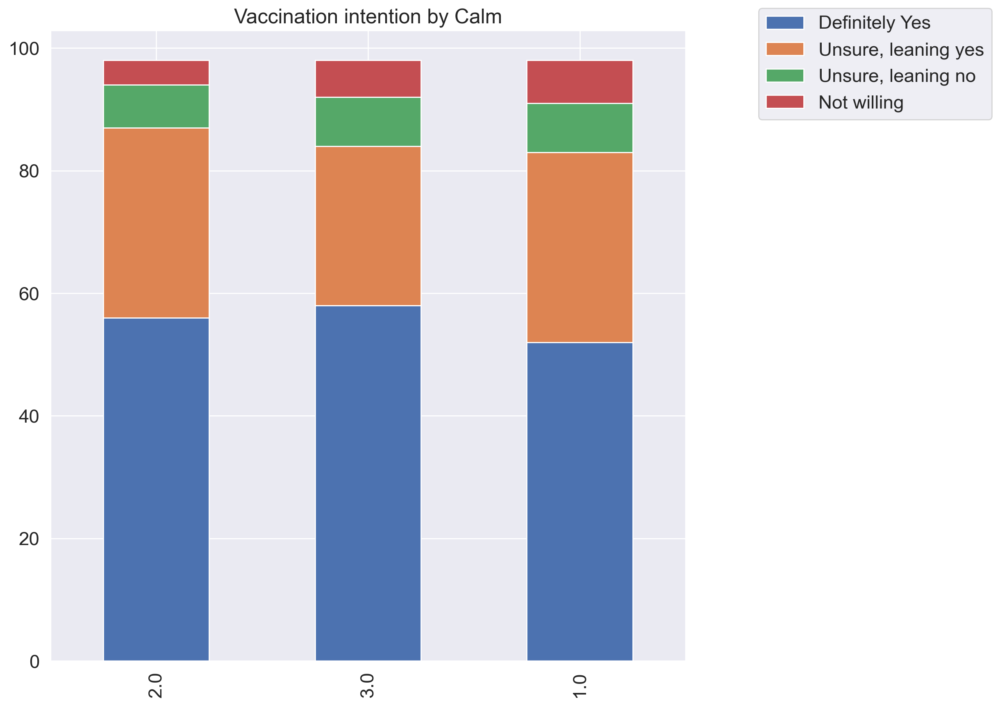

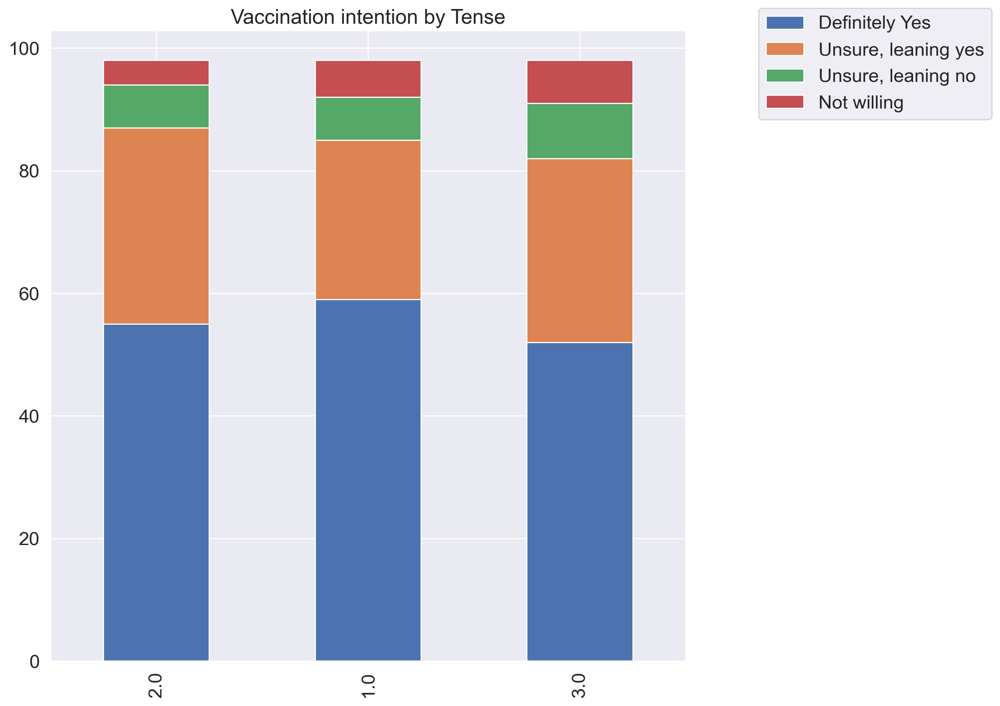

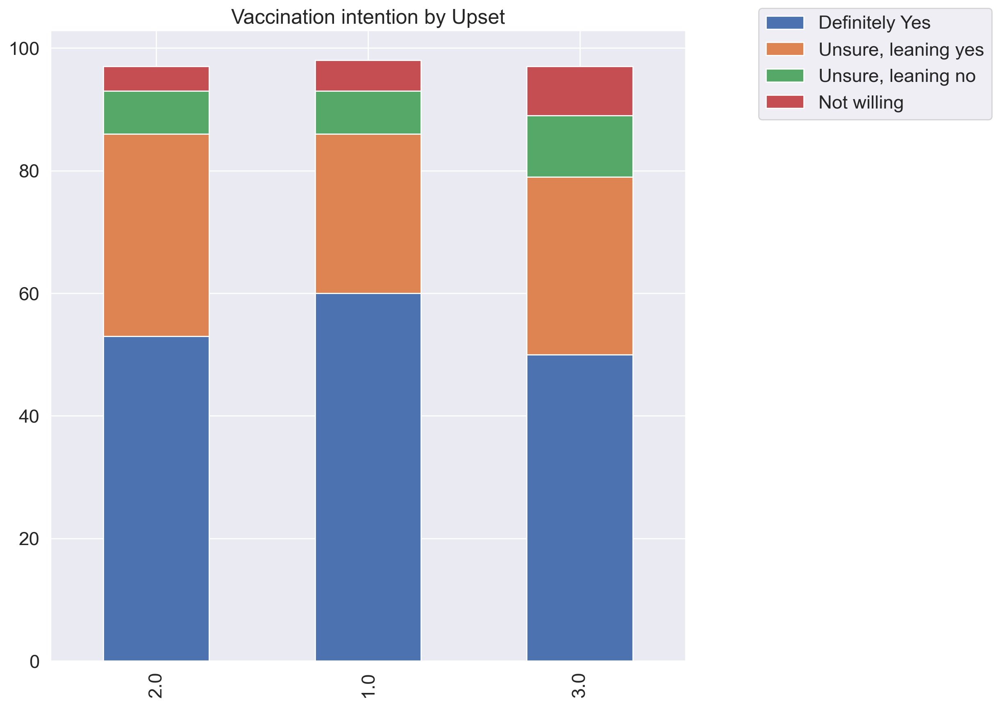

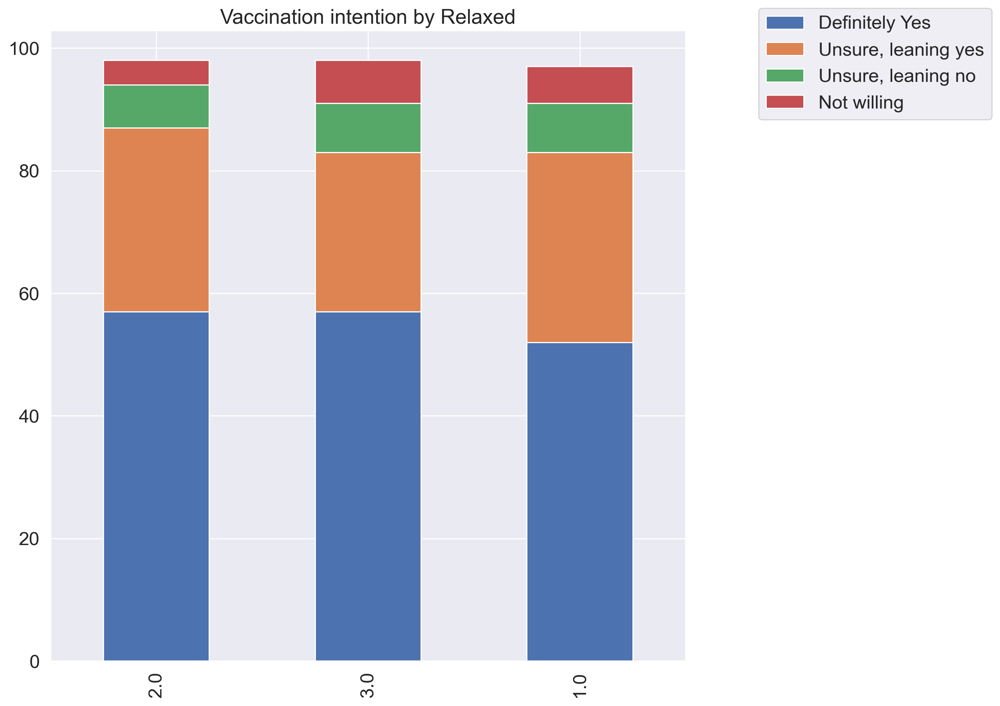

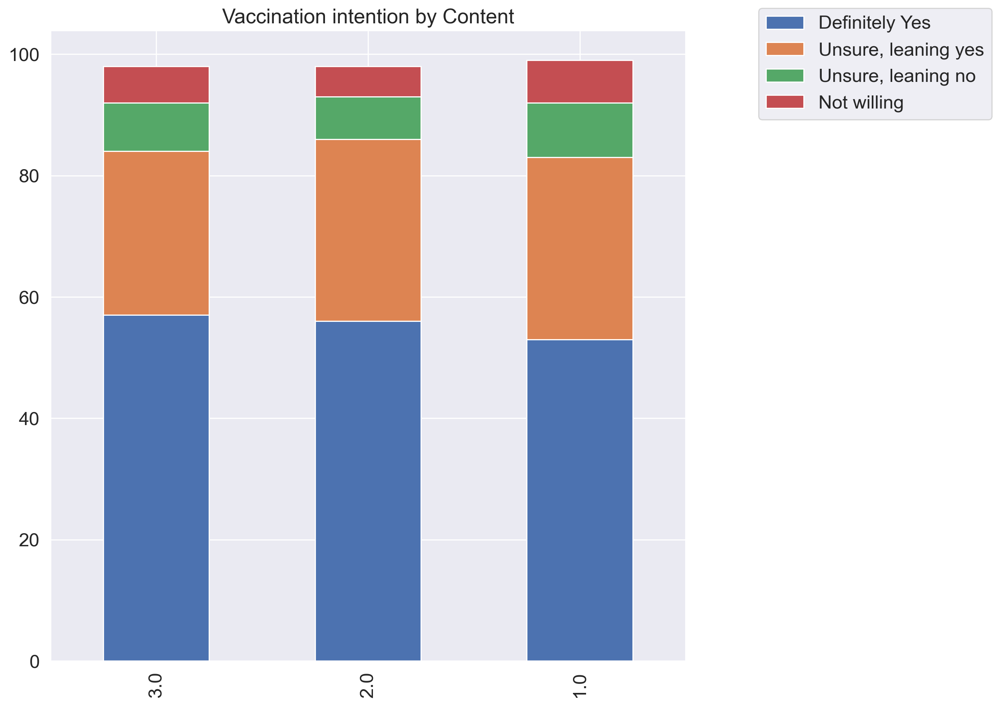

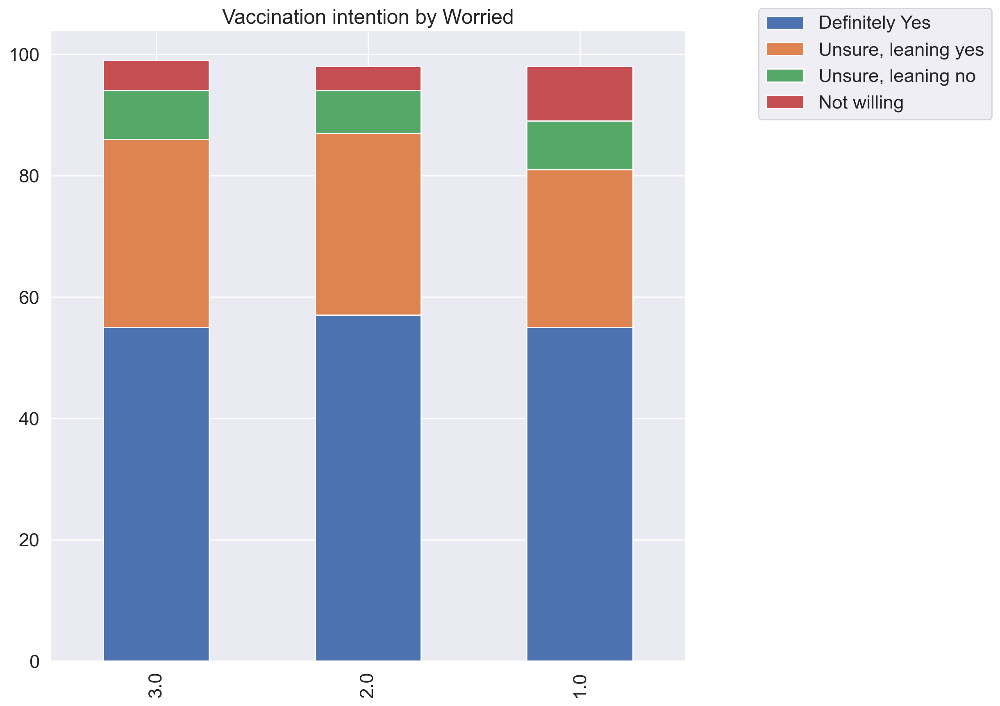

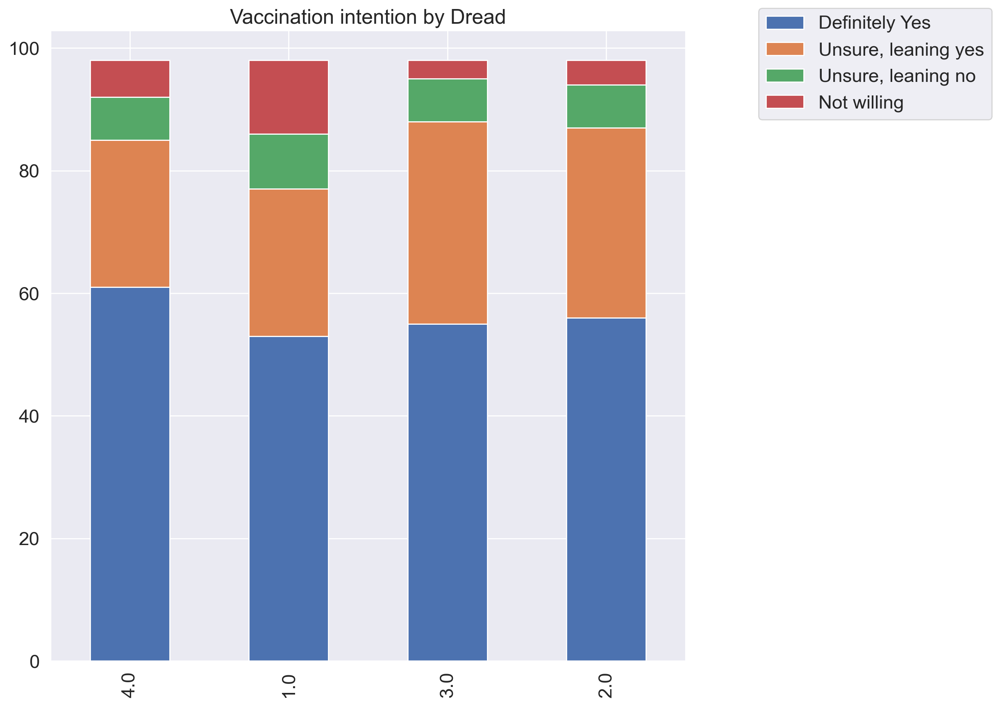

In [32]:
# W1 emotion variables and vaccine willingness

w1_list = [('ANX_1', 'Calm'), ('ANX_2', 'Tense'), 
           ('ANX_3', 'Upset'), ('ANX_4', 'Relaxed'), 
           ('ANX_5', 'Content'), ('ANX_6', 'Worried'), 
           ('DREAD', 'Dread')]

for item in w1_list:
    df_group, df_chart = group_analysis(w1_nondum, 'COV_VAC_SELF', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])

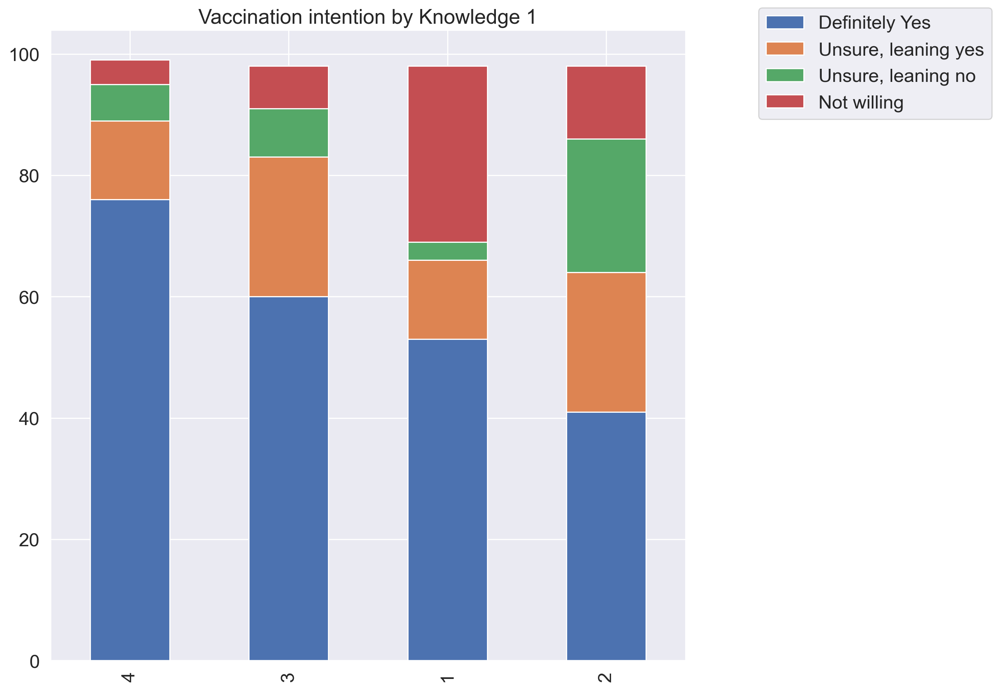

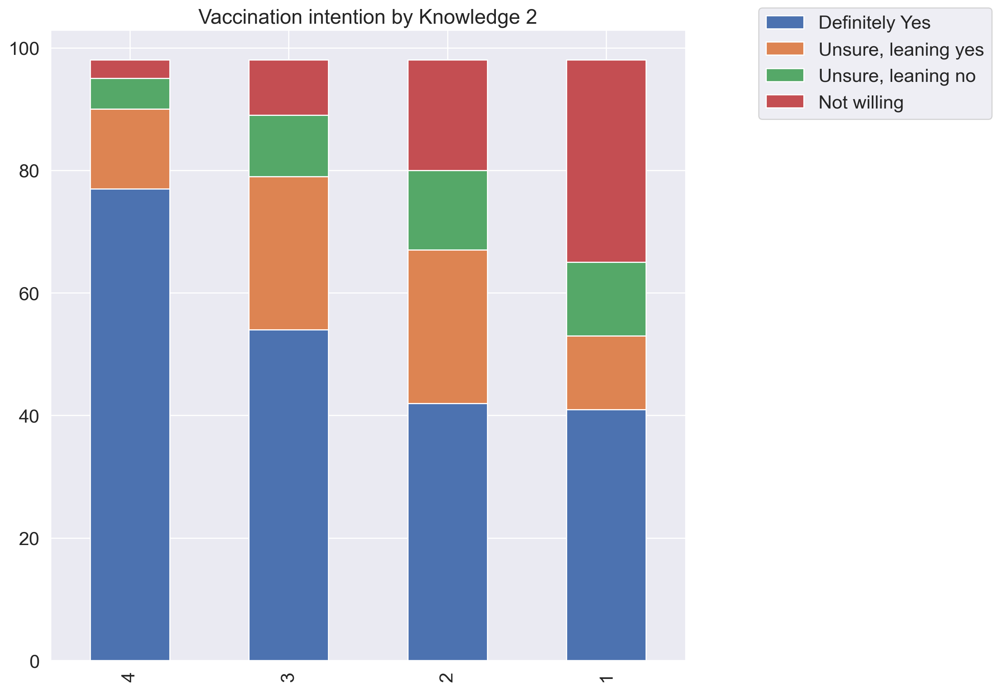

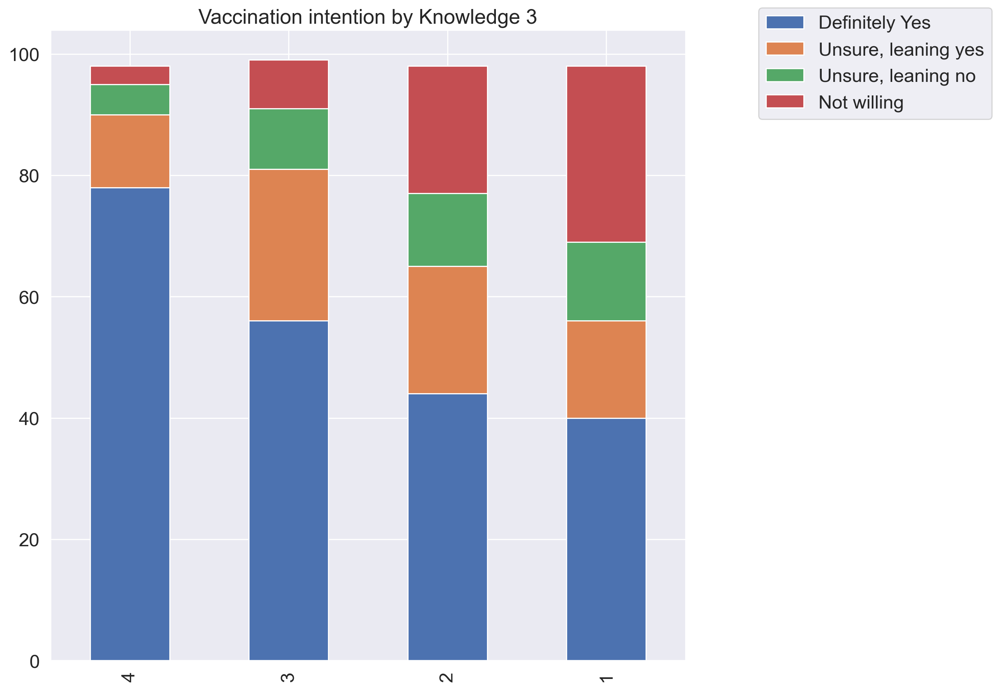

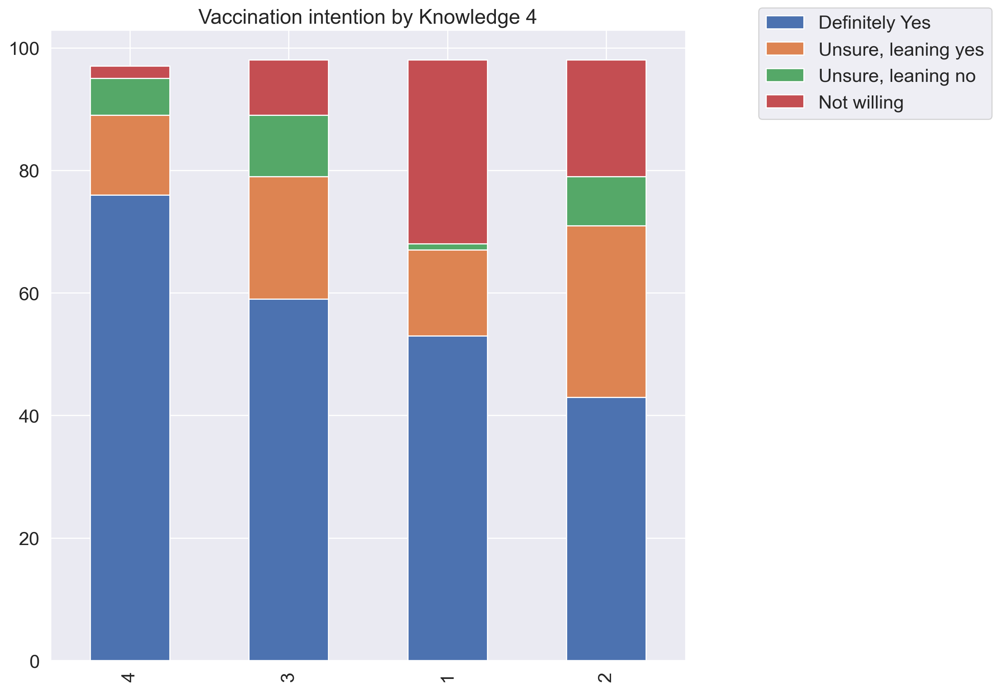

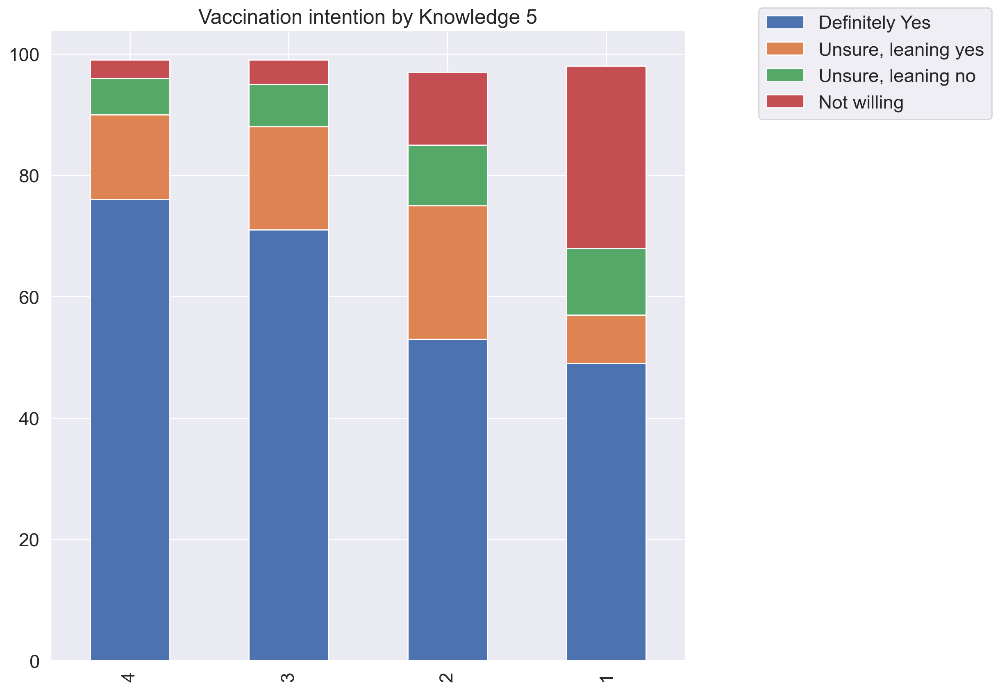

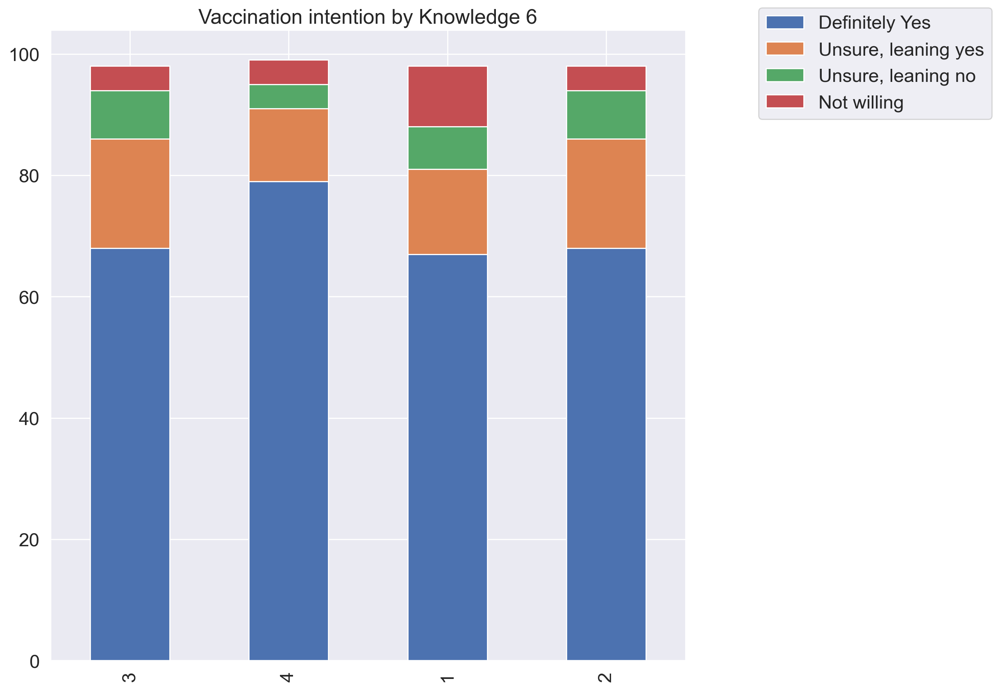

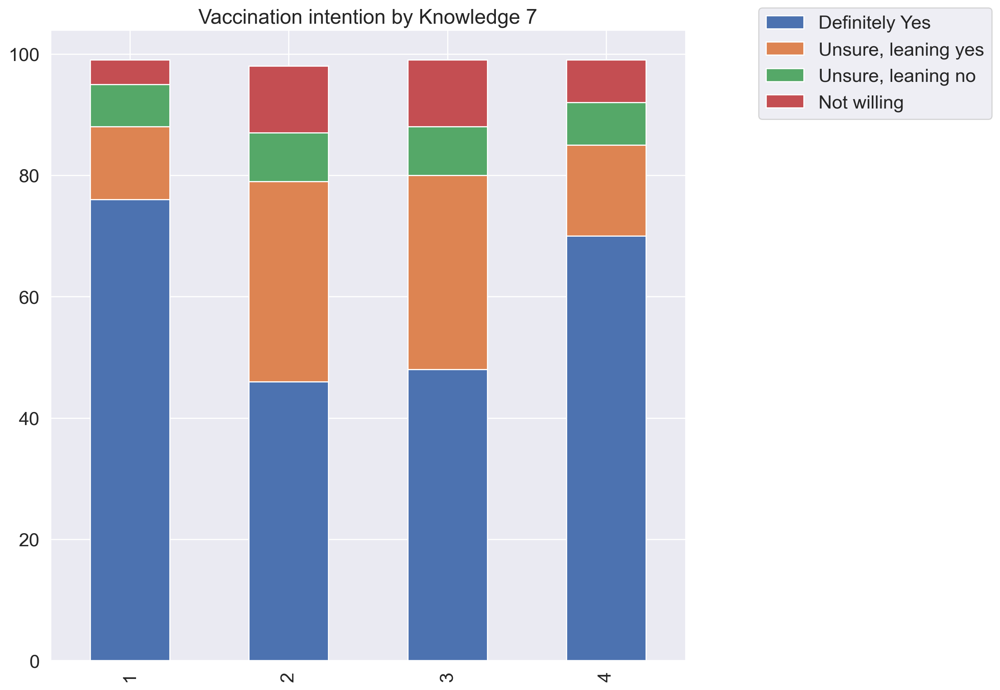

In [33]:
# W2 knowledge variables and vaccine willingess

w2_list = [('COV_KNOWL_1', 'Knowledge 1'), ('COV_KNOWL_2', 'Knowledge 2'), 
           ('COV_KNOWL_3', 'Knowledge 3'), ('COV_KNOWL_4', 'Knowledge 4'), 
           ('COV_KNOWL_5', 'Knowledge 5'), 
           ('COV_KNOWL_6', 'Knowledge 6'), ('COV_KNOWL_7', 'Knowledge 7')]

for item in w2_list:
    df_group, df_chart = group_analysis(w2intent_nondum, 'intention', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])

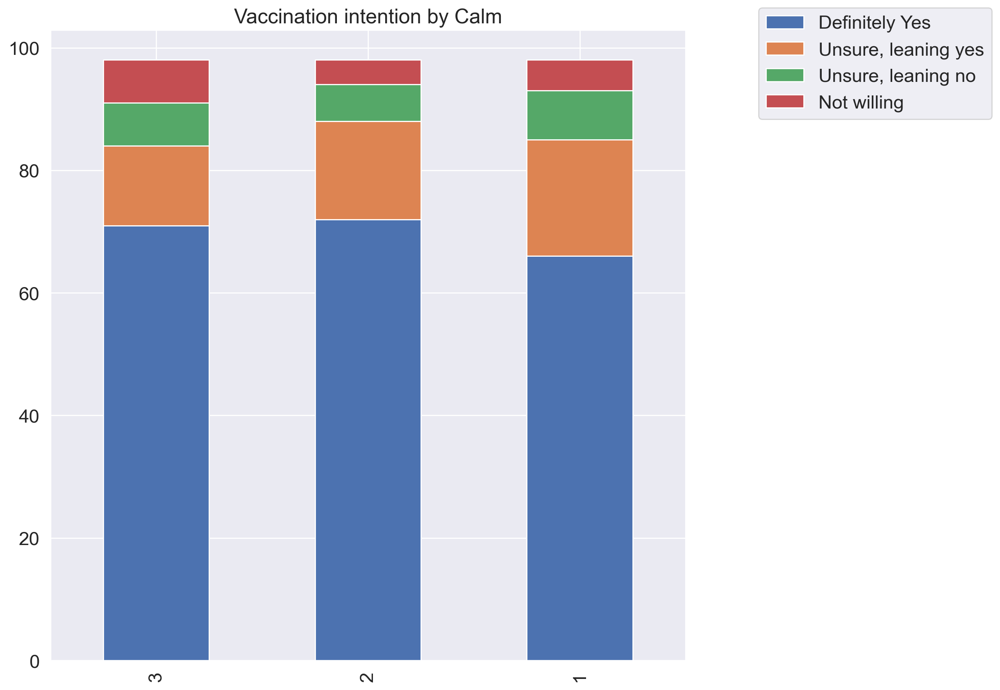

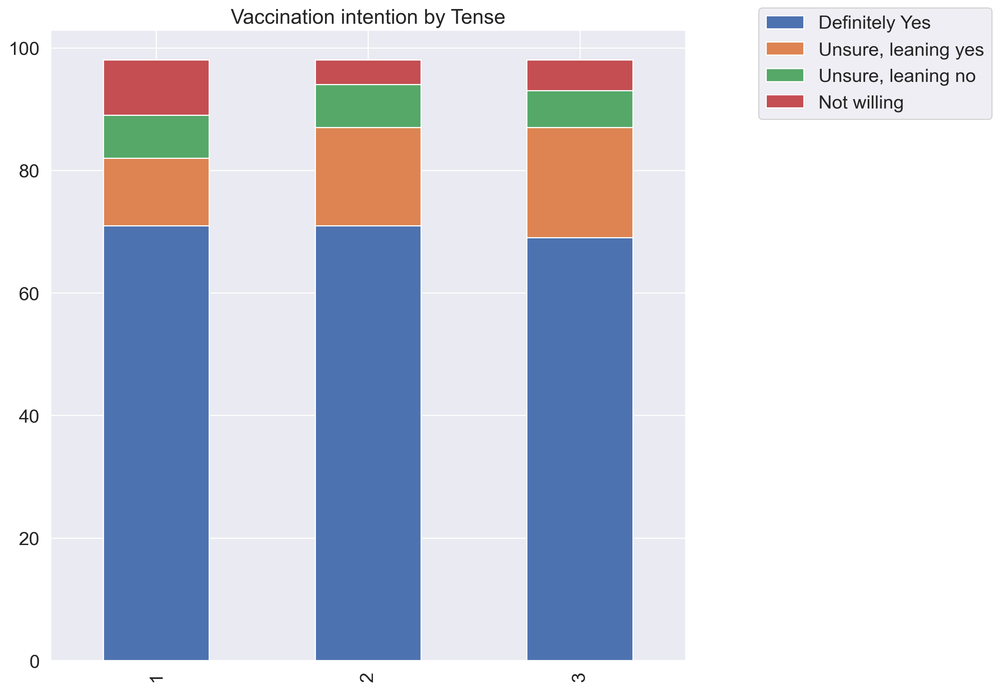

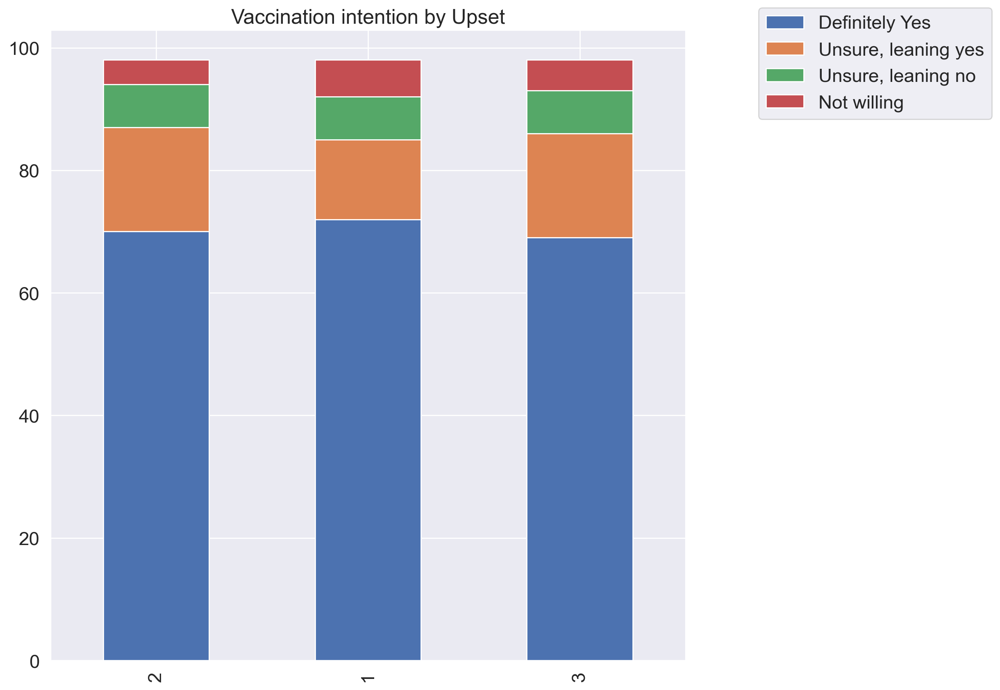

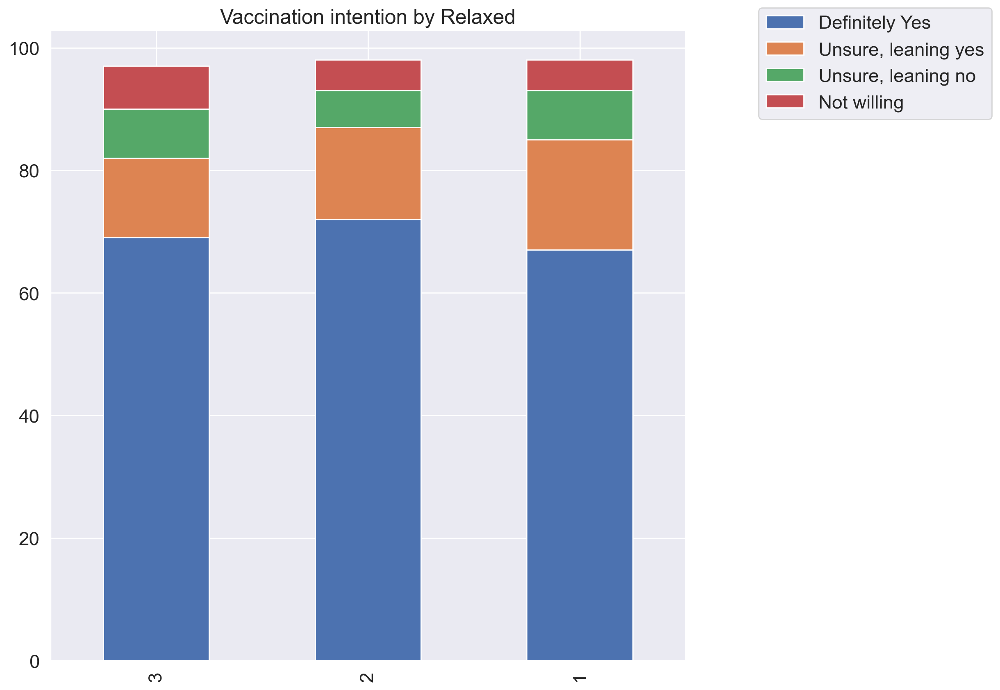

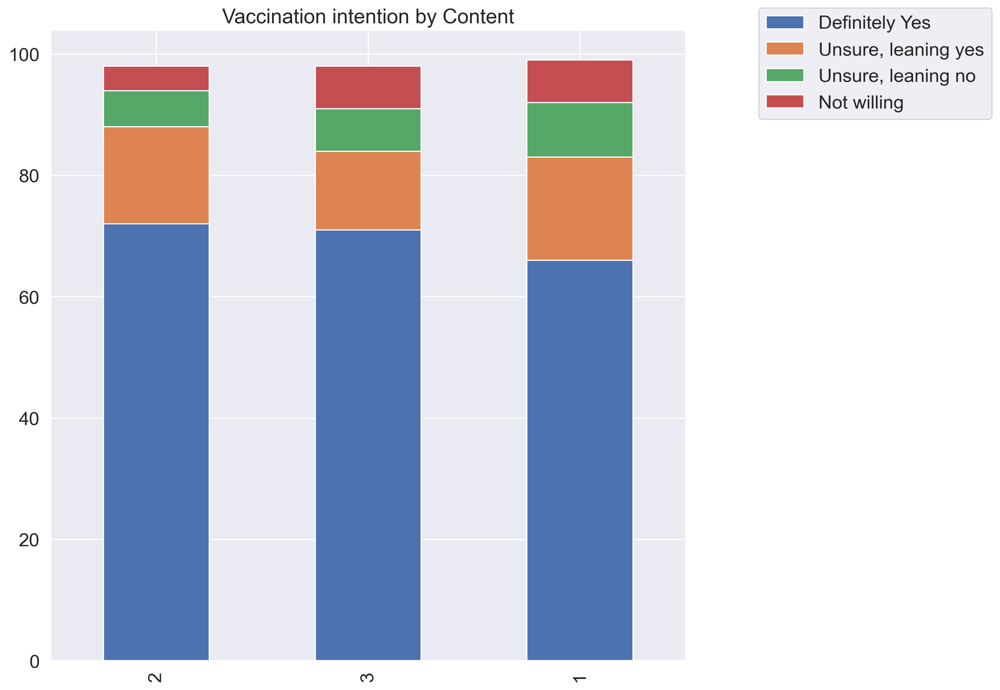

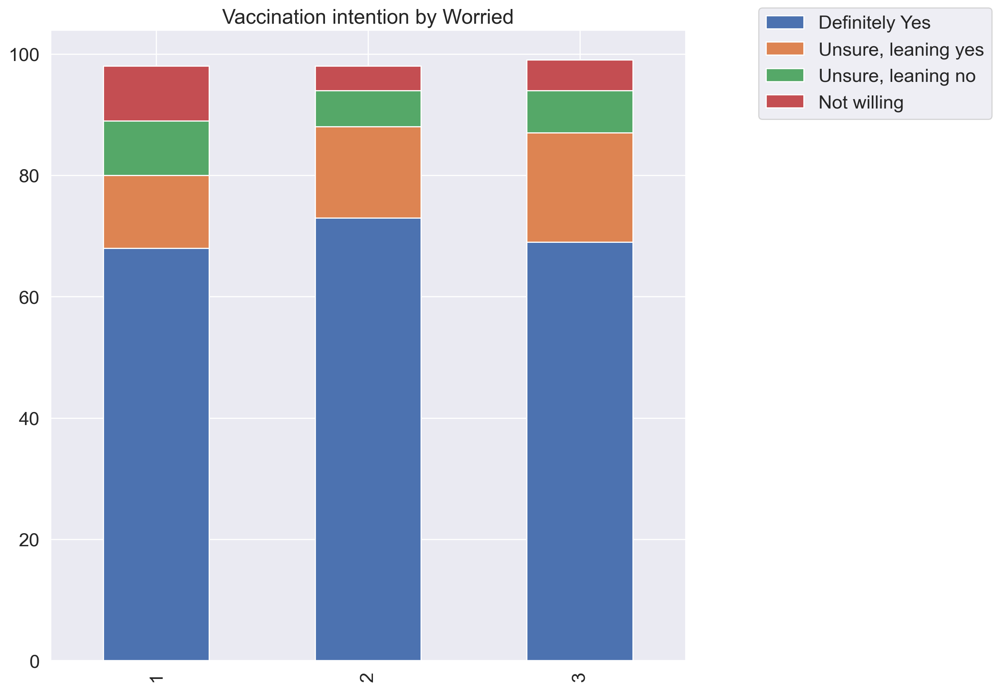

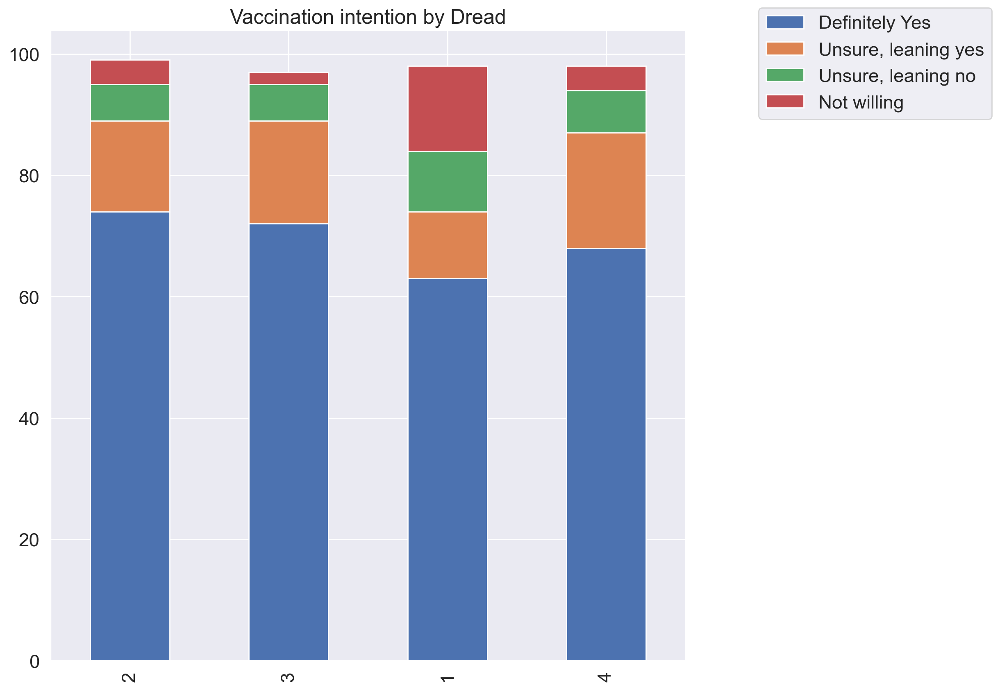

In [34]:
# W2 emotion variables and vaccine willingess

w2_list = [('ANX_1', 'Calm'), ('ANX_2', 'Tense'), 
           ('ANX_3', 'Upset'), ('ANX_4', 'Relaxed'), 
           ('ANX_5', 'Content'), ('ANX_6', 'Worried'), 
           ('DREAD', 'Dread')]

for item in w2_list:
    df_group, df_chart = group_analysis(w2intent_nondum, 'intention', item[0], 'DEMAGE')
    stacked_bar(df_chart, item[1])

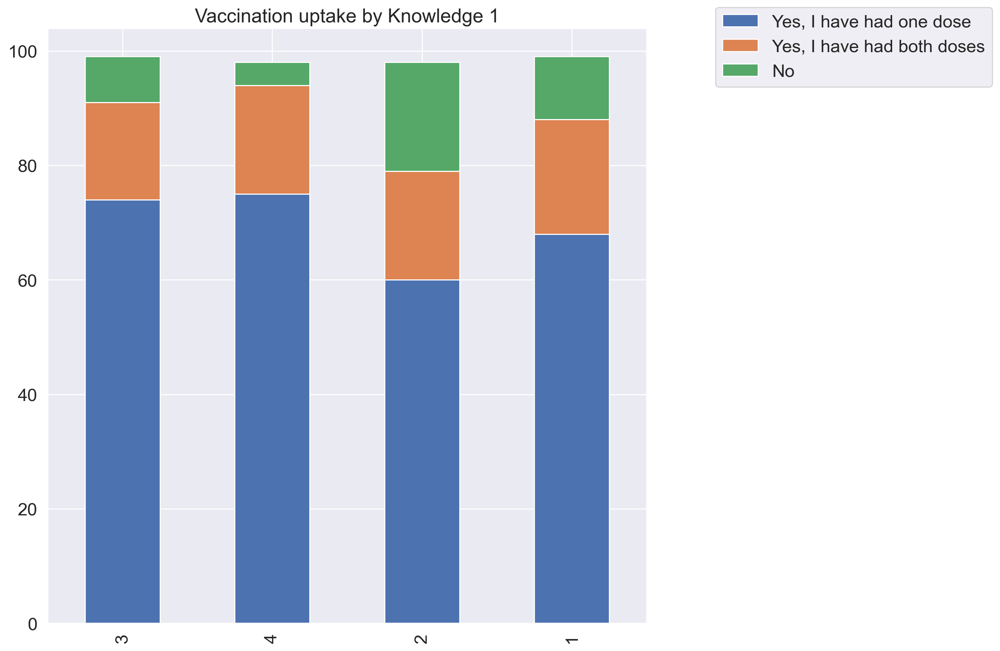

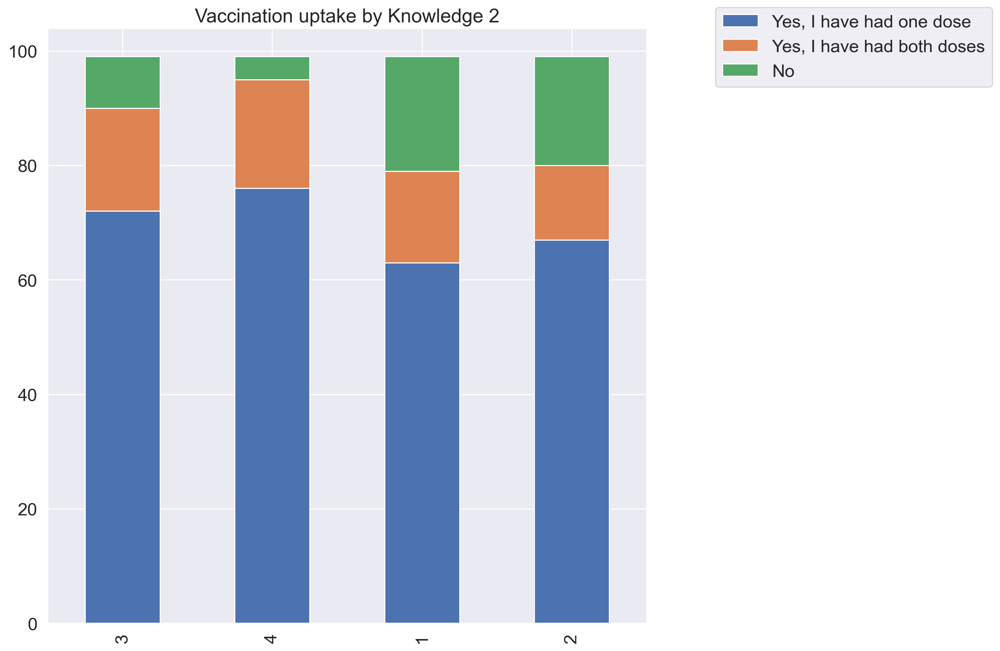

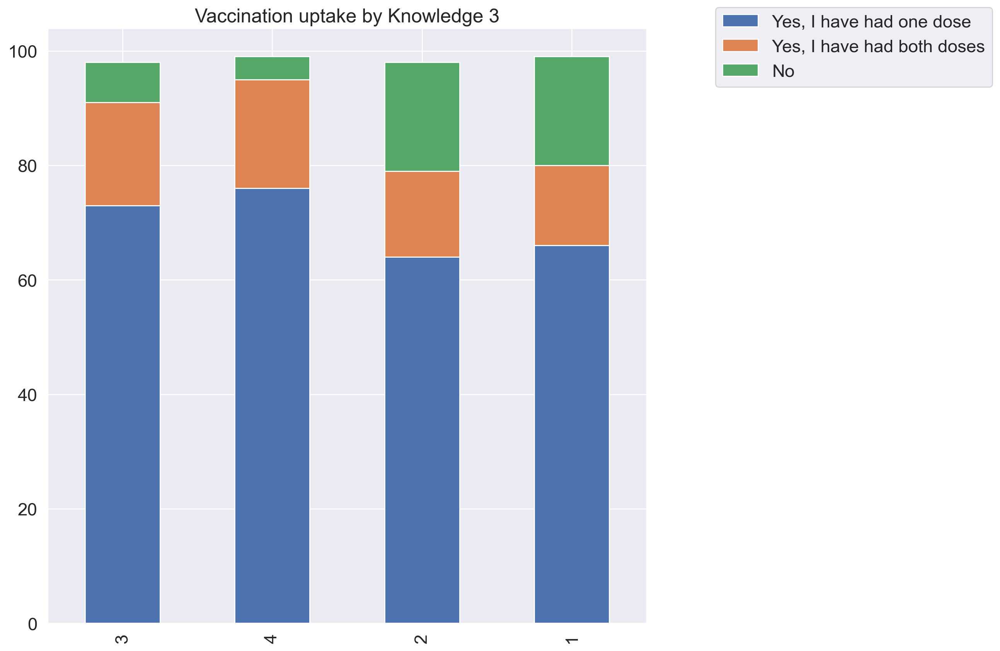

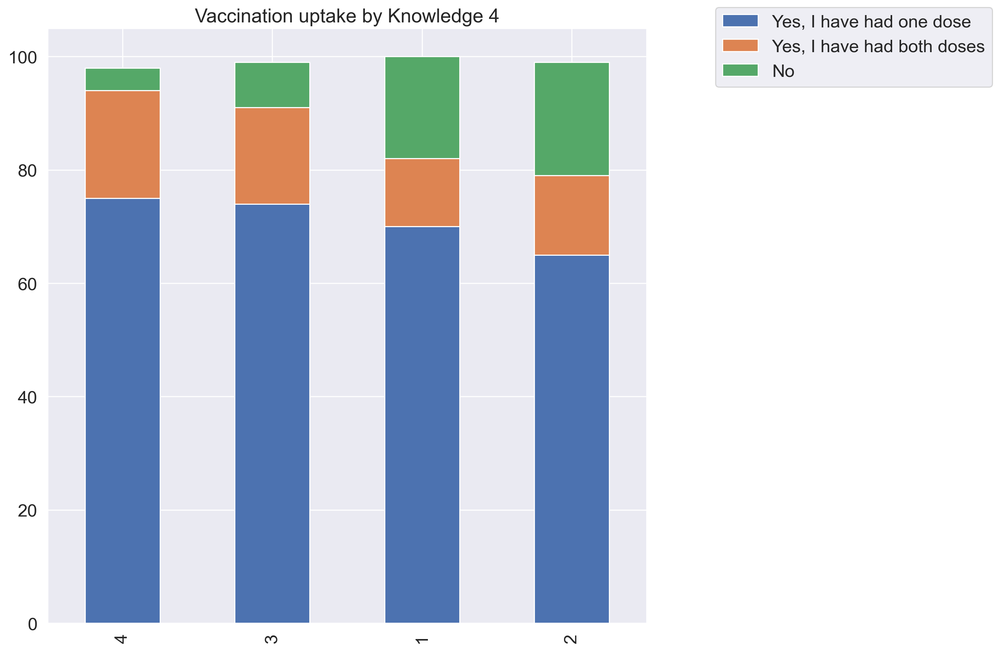

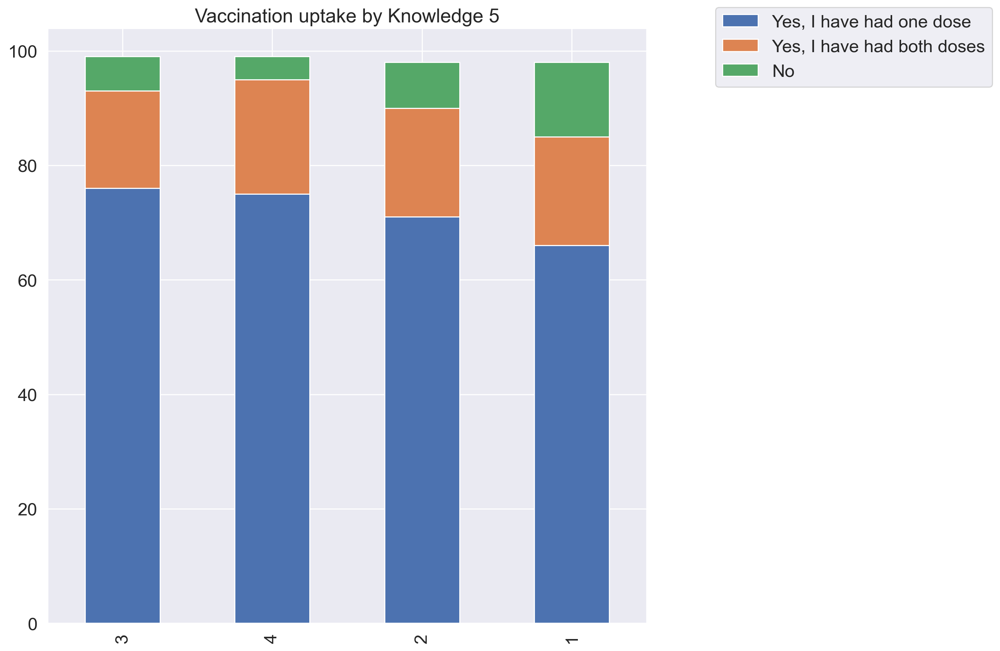

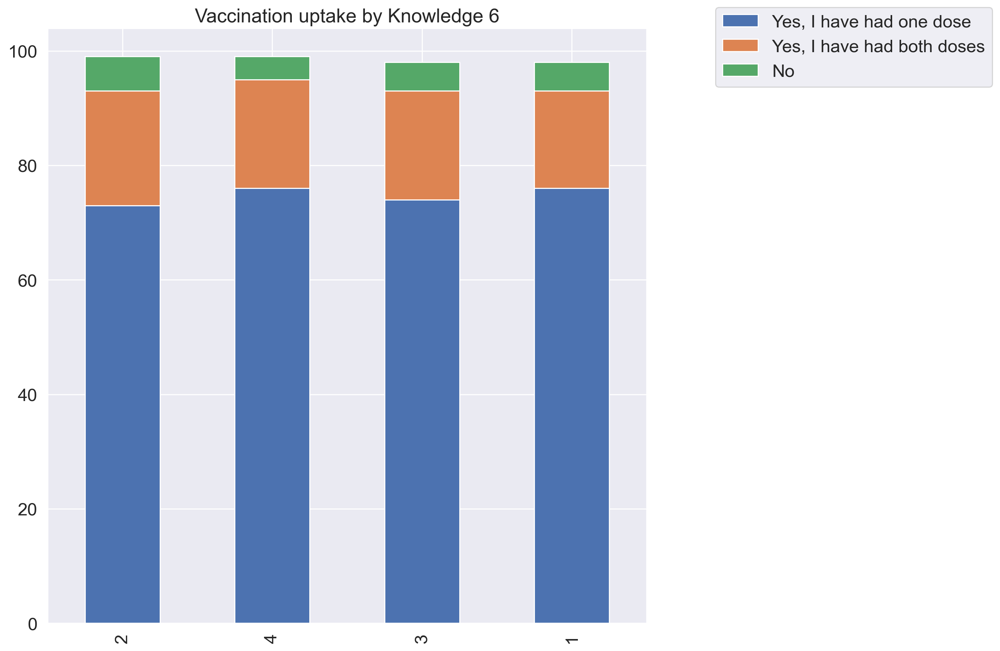

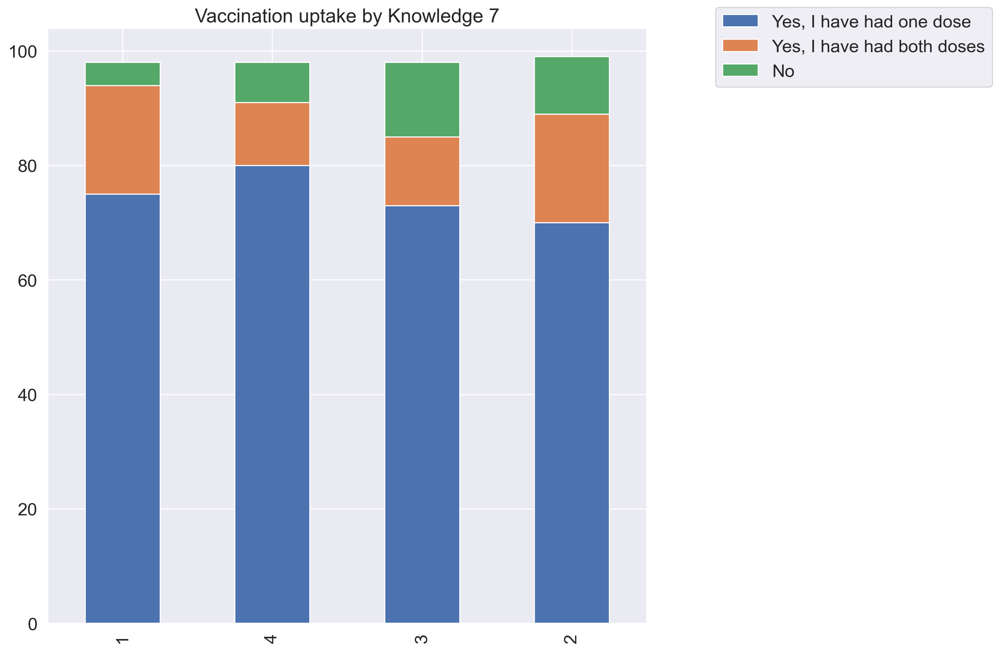

In [35]:
# W2 knowledge variables and vaccine uptake

w2_list = [('COV_KNOWL_1', 'Knowledge 1'), ('COV_KNOWL_2', 'Knowledge 2'), 
           ('COV_KNOWL_3', 'Knowledge 3'), ('COV_KNOWL_4', 'Knowledge 4'), 
           ('COV_KNOWL_5', 'Knowledge 5'), 
           ('COV_KNOWL_6', 'Knowledge 6'), ('COV_KNOWL_7', 'Knowledge 7')]

for item in w2_list:
    df_group, df_chart = uptake_group_analysis(w2uptake_nondum, 'COV_DOSE', item[0], 'DEMAGE')
    uptake_stacked_bar(df_chart, item[1])

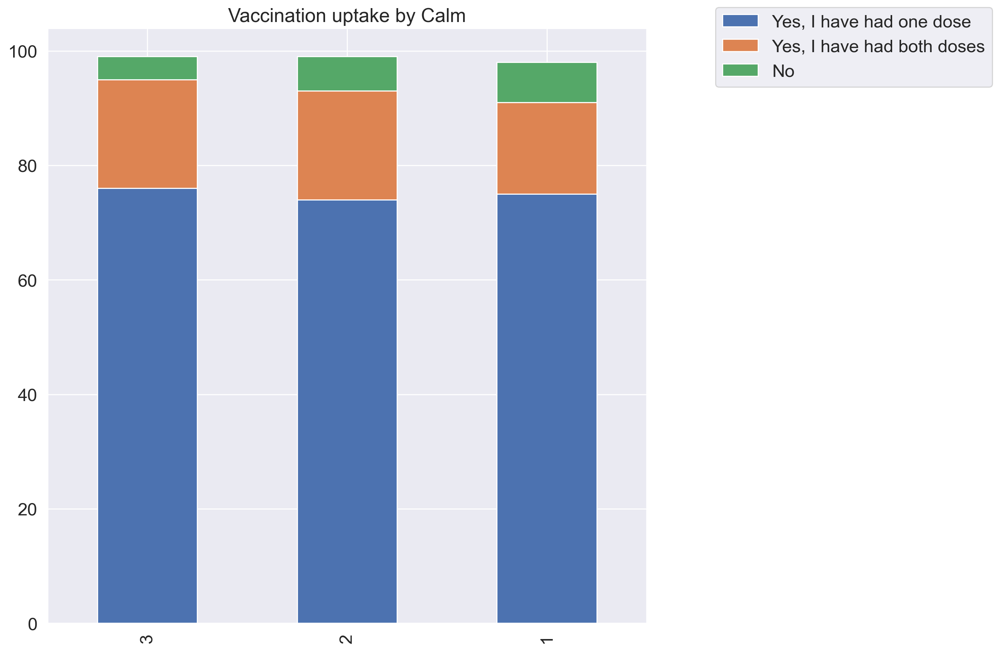

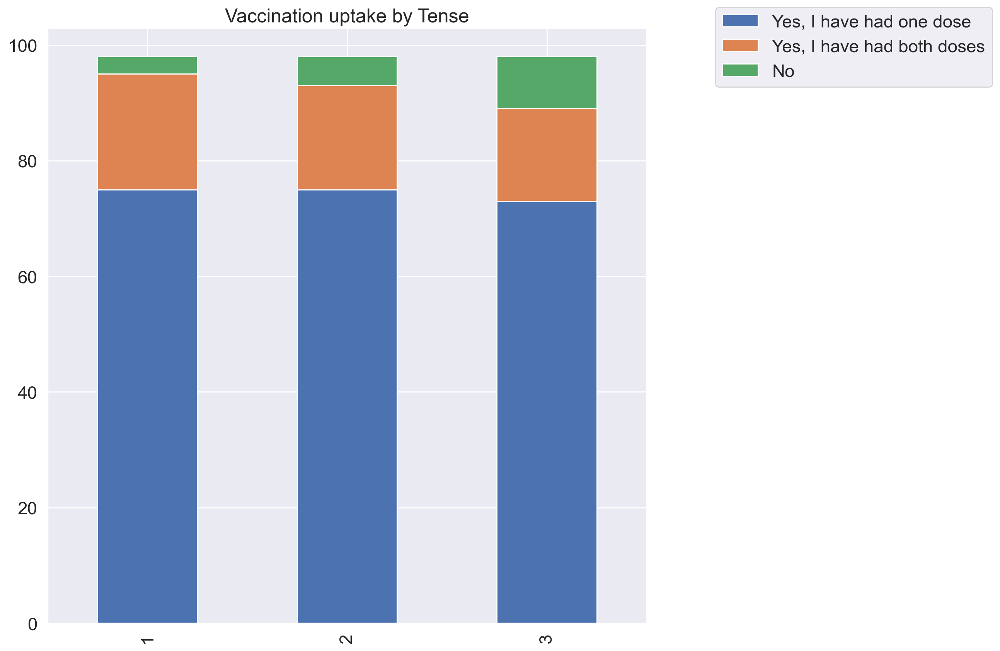

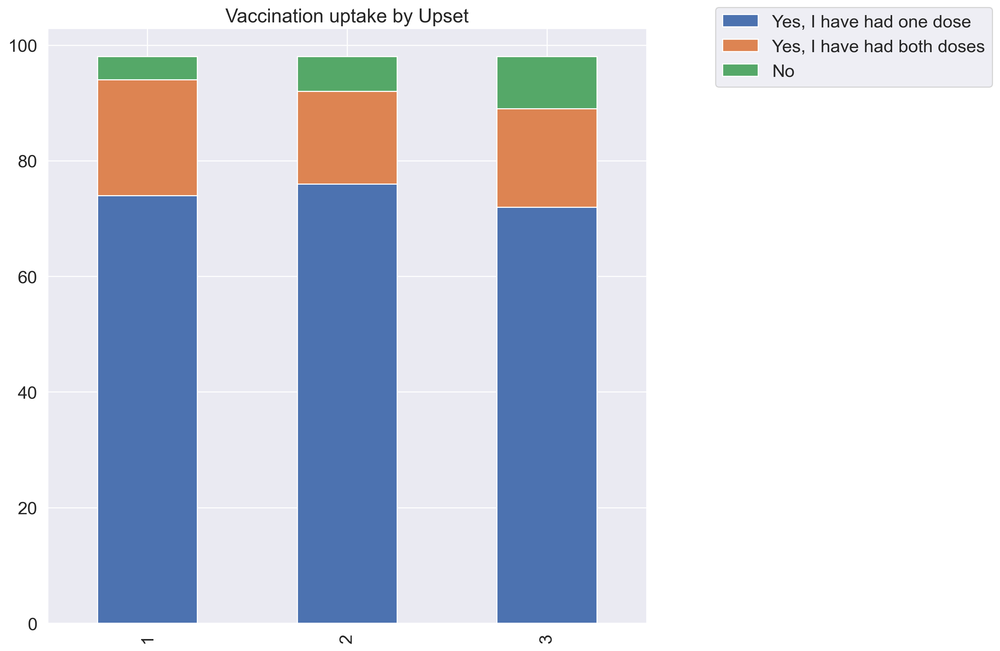

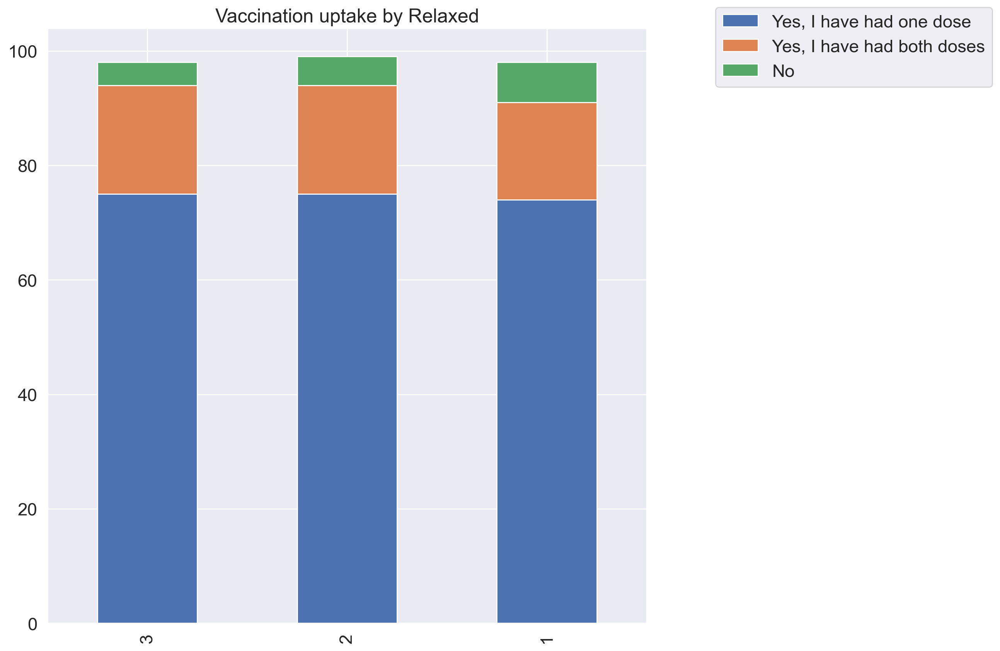

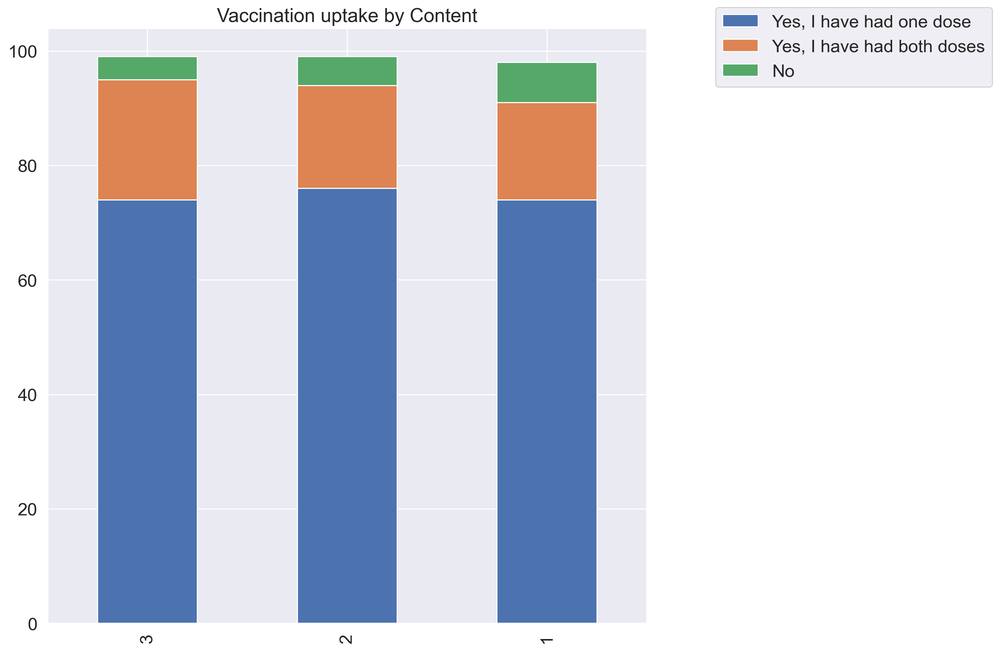

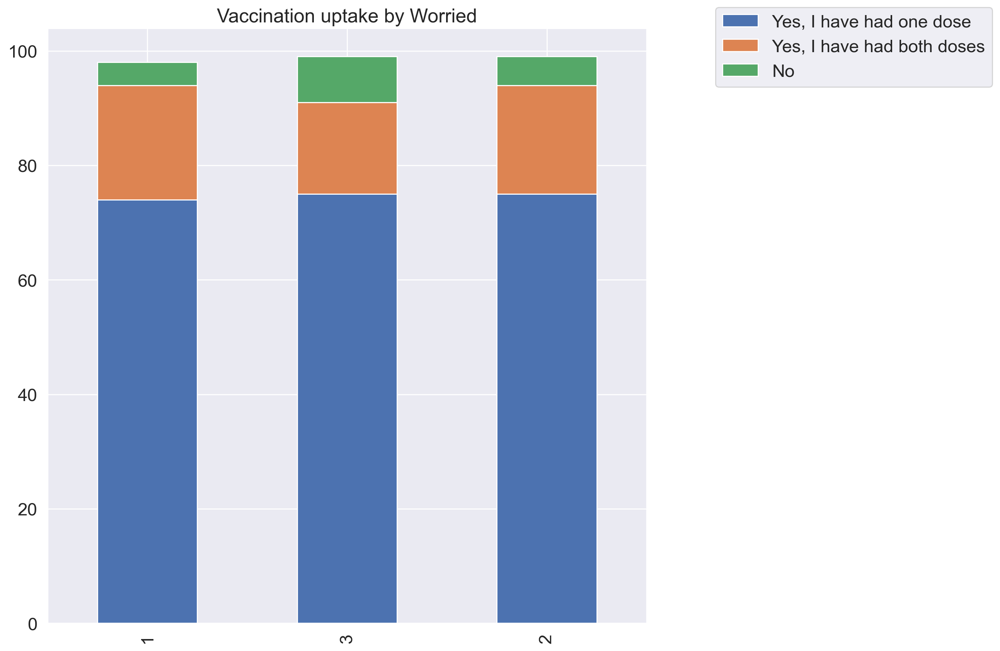

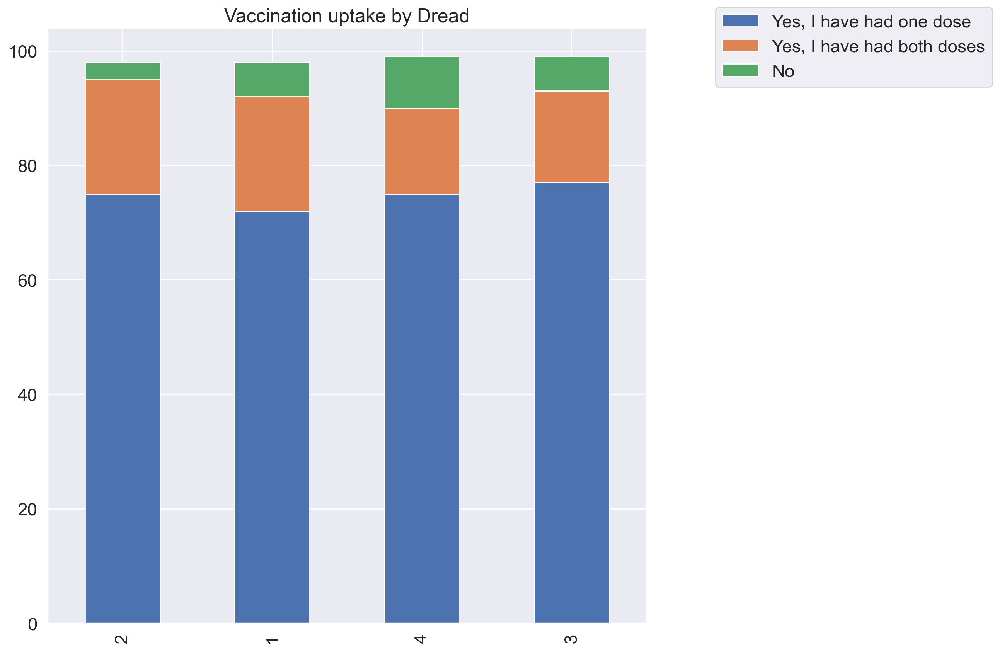

In [36]:
# W2 knowledge variables and vaccine uptake

w2_list = [('ANX_1', 'Calm'), ('ANX_2', 'Tense'), 
           ('ANX_3', 'Upset'), ('ANX_4', 'Relaxed'), 
           ('ANX_5', 'Content'), ('ANX_6', 'Worried'), 
           ('DREAD', 'Dread')]

for item in w2_list:
    df_group, df_chart = uptake_group_analysis(w2uptake_nondum, 'COV_DOSE', item[0], 'DEMAGE')
    uptake_stacked_bar(df_chart, item[1])

**Exploration of Age variable**

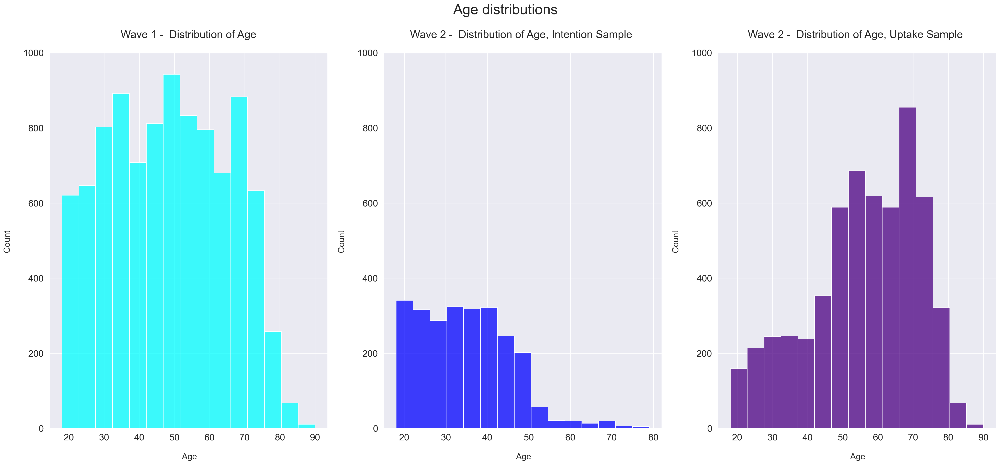

In [37]:
# Creating histograms to compare the distribution of age for each subsample

fig, ax = plt.subplots(ncols=3, figsize=(30, 12))
fig.suptitle('Age distributions \n \n', fontsize=25)
sns.histplot(w1['DEMAGE'], bins=15, kde=False, ax=ax[0], color='aqua')
sns.histplot(w2_intention['DEMAGE'], bins=15, kde=False, ax=ax[1], color='blue')
sns.histplot(w2_uptake['DEMAGE'], bins=15, kde=False, ax=ax[2], color='indigo')
ax[0].set_ylim(0, 1000)
ax[1].set_ylim(0, 1000)
ax[2].set_ylim(0, 1000)
ax[0].set_title('\n Wave 1 -  Distribution of Age \n', fontsize=19)
ax[1].set_title('\n Wave 2 -  Distribution of Age, Intention Sample  \n', fontsize=19)
ax[2].set_title('\n Wave 2 -  Distribution of Age, Uptake Sample  \n', fontsize=19)
ax[0].set_xlabel('\n Age', fontsize=15)
ax[1].set_xlabel('\n Age', fontsize=15)
ax[2].set_xlabel('\n Age', fontsize=15)
ax[0].set_ylabel('Count \n', fontsize=15)
ax[1].set_ylabel('Count \n', fontsize=15)
ax[2].set_ylabel('Count \n', fontsize=15)
plt.show()

In [38]:
# Exploring age correlation with target variable

# W1 age and willingness correlation
print(w1[['COV_VAC_SELF', 'DEMAGE']].corr())
print("--------")
# W1 mean age by willingness category.
w1.groupby('COV_VAC_SELF')['DEMAGE'].mean()

              COV_VAC_SELF    DEMAGE
COV_VAC_SELF      1.000000 -0.178469
DEMAGE           -0.178469  1.000000
--------


COV_VAC_SELF
1    50.888641
2    45.464509
3    43.177232
4    42.702899
Name: DEMAGE, dtype: float64

In [39]:
# Exploring age correlation with target variable

# W2 age and willingness correlation
print(w2intent_nondum[['intention', 'DEMAGE']].corr())
print("--------")
# W2 mean age by willingness category.
w2intent_nondum.groupby('intention')['DEMAGE'].mean()

           intention    DEMAGE
intention   1.000000  0.159706
DEMAGE      0.159706  1.000000
--------


intention
1.0    34.174281
2.0    34.032500
3.0    37.379121
4.0    41.937931
Name: DEMAGE, dtype: float64

In [40]:
# Exploring age correlation with target variable

# W2 age and uptake correlation
print(w2uptake_nondum[['COV_DOSE', 'DEMAGE']].corr())
print("--------")
# W2 mean age by uptake category.
w2uptake_nondum.groupby('COV_DOSE')['DEMAGE'].mean()

          COV_DOSE    DEMAGE
COV_DOSE  1.000000 -0.085009
DEMAGE   -0.085009  1.000000
--------


COV_DOSE
1.0    55.766240
2.0    59.897205
3.0    42.285714
Name: DEMAGE, dtype: float64

C:\Users\laure\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\laure\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\laure\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


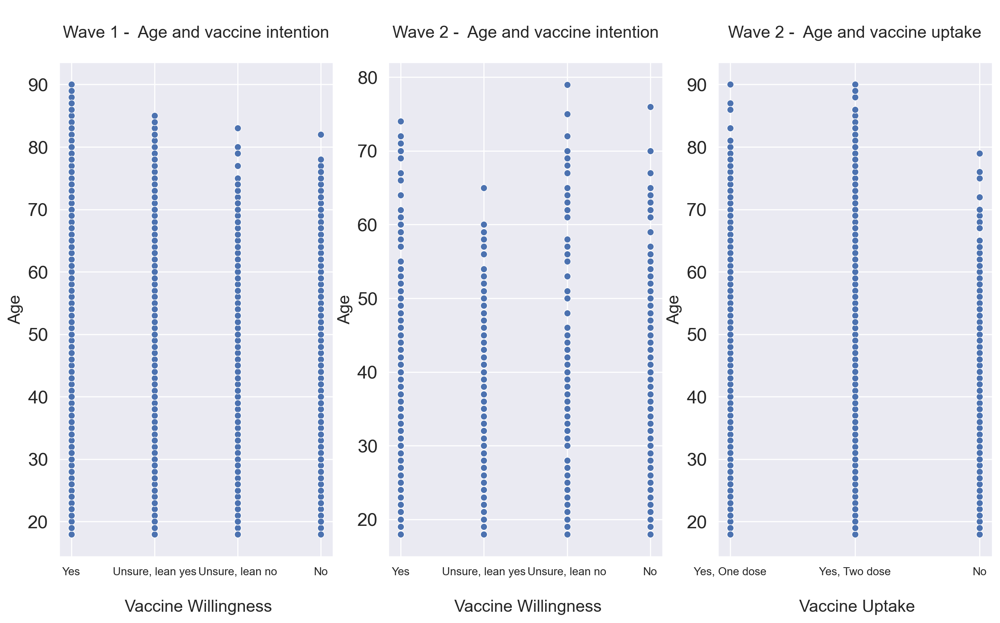

In [41]:
# Visualising age and target variable relationships.

fig,ax = plt.subplots(ncols=3, figsize=(15, 8))
sns.scatterplot(w1['COV_VAC_SELF'], w1['DEMAGE'], ax=ax[0])
sns.scatterplot(w2intent_nondum['intention'], w2intent_nondum['DEMAGE'], ax=ax[1])
sns.scatterplot( w2uptake_nondum['COV_DOSE'], w2uptake_nondum['DEMAGE'], ax=ax[2])

labels = ['Yes', 'Unsure, lean yes', 'Unsure, lean no', 'No']
labels2 = ['Yes, One dose', 'Yes, Two dose', 'No']
ax[0].set_xticks([1, 2, 3, 4])
ax[0].set_xticklabels(labels, fontsize=10)
ax[1].set_xticks([1, 2, 3, 4])
ax[1].set_xticklabels(labels, fontsize=10)
ax[2].set_xticks([1, 2, 3])
ax[2].set_xticklabels(labels2, fontsize=10)
ax[0].set_title('\n Wave 1 -  Age and vaccine intention \n', fontsize=15)
ax[1].set_title('\n Wave 2 -  Age and vaccine intention \n', fontsize=15)
ax[2].set_title('\n Wave 2 -  Age and vaccine uptake \n', fontsize=15)
ax[0].set_xlabel('\n Vaccine Willingness', fontsize=15)
ax[1].set_xlabel('\n Vaccine Willingness', fontsize=15)
ax[2].set_xlabel('\n Vaccine Uptake', fontsize=15)
ax[0].set_ylabel('Age', fontsize=15)
ax[1].set_ylabel('Age', fontsize=15)
ax[2].set_ylabel('Age', fontsize=15)

plt.show()

C:\Users\laure\AppData\Local\Temp\ipykernel_3748\861279381.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corrs, dtype=np.bool)
C:\Users\laure\AppData\Local\Temp\ipykernel_3748\861279381.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corrs, dtype=np.bool)
C:\Users\laure\AppData\Local\Temp\ipyker

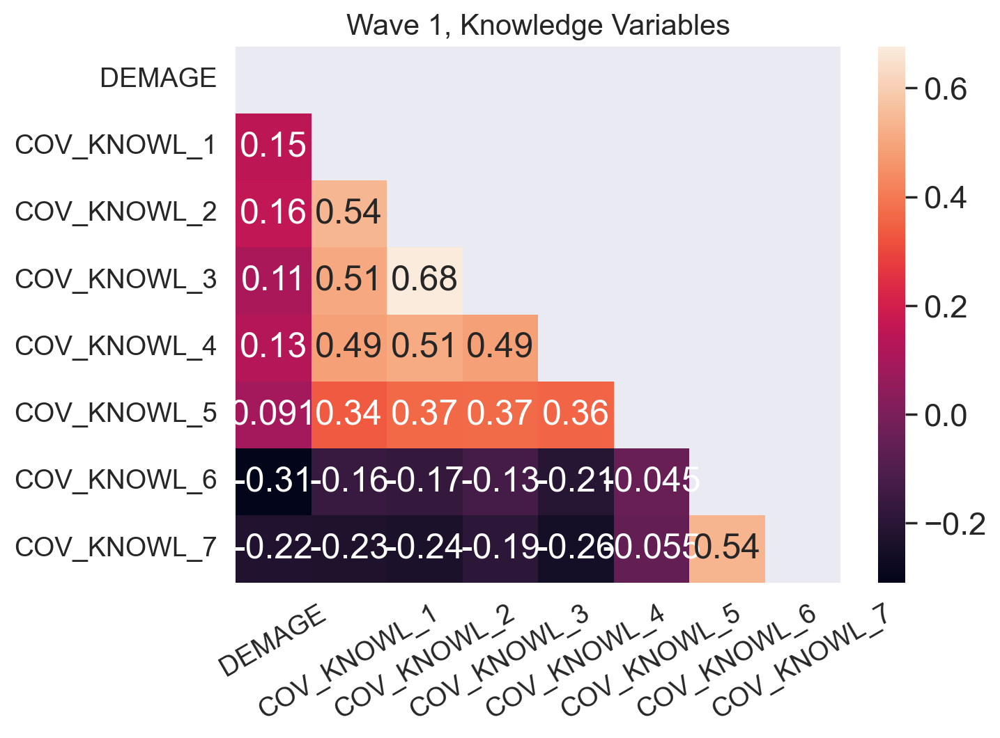

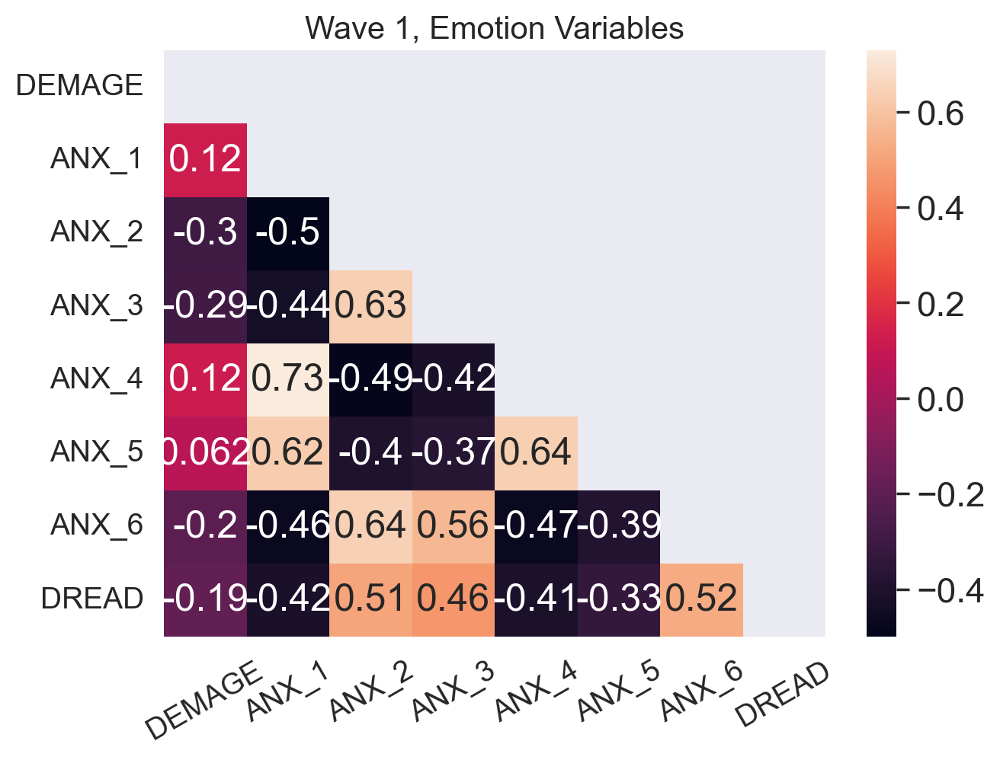

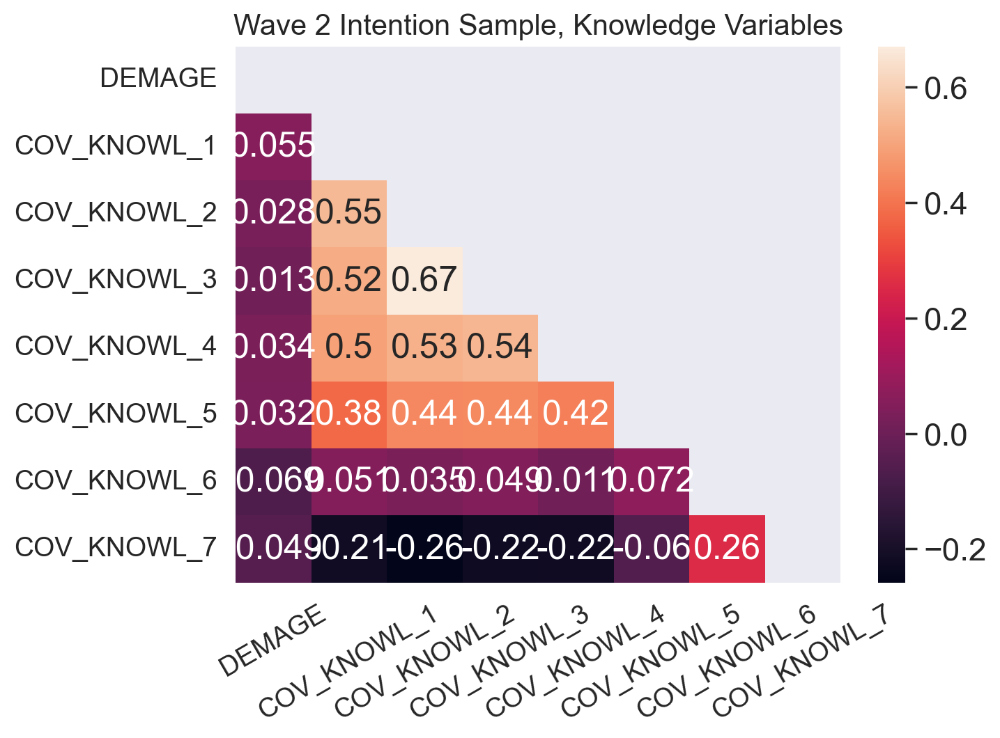

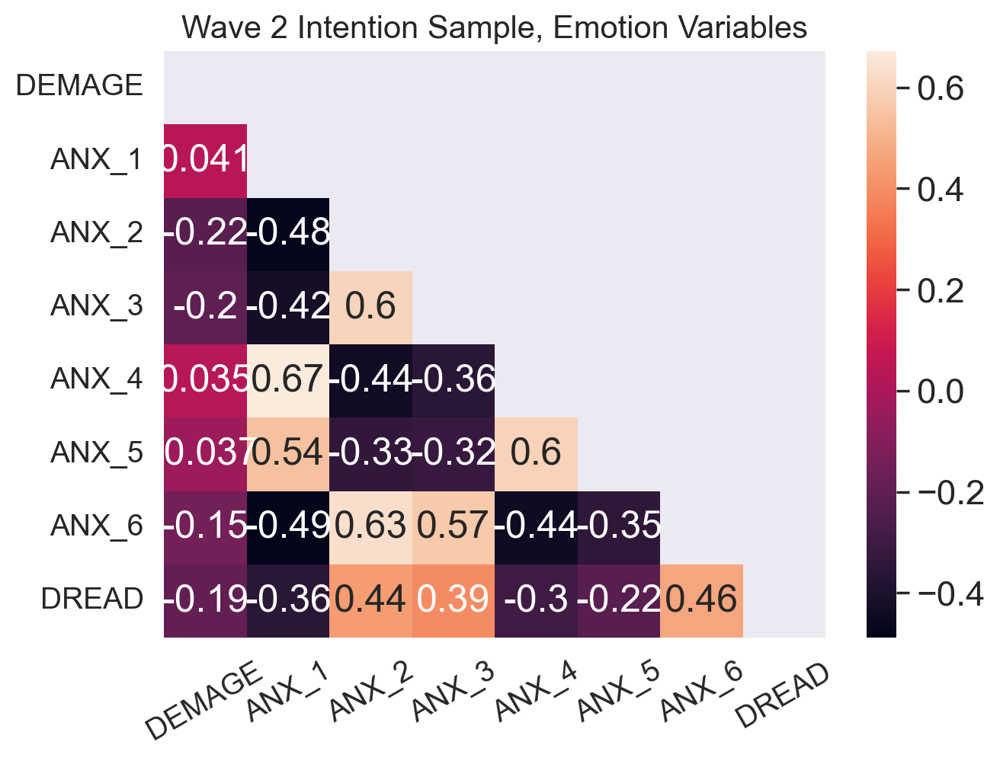

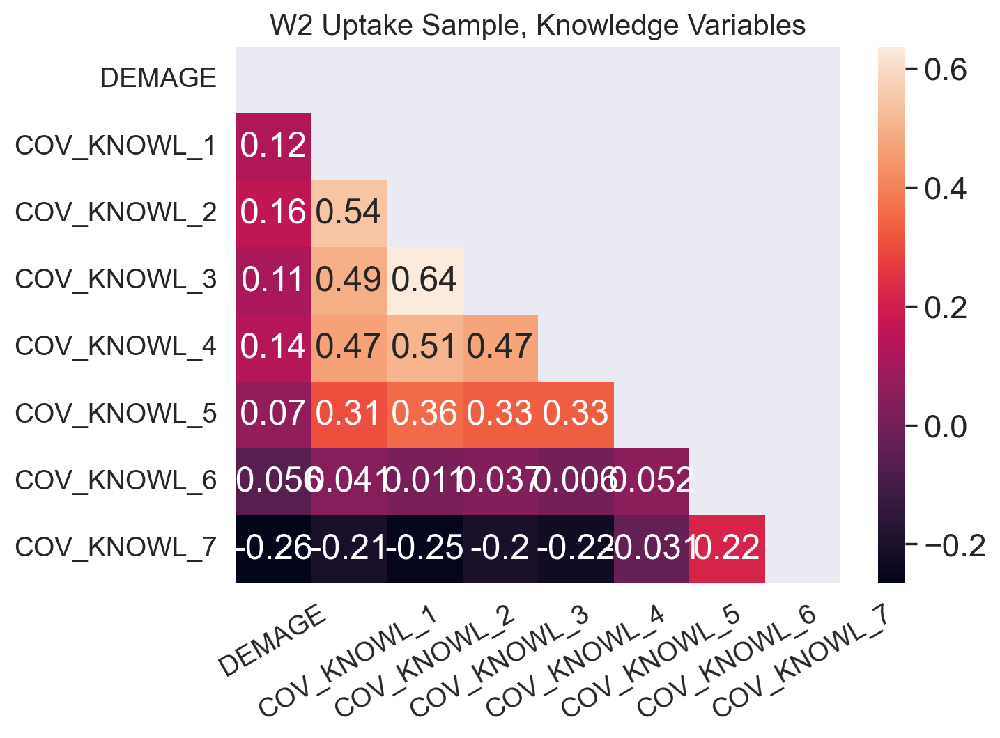

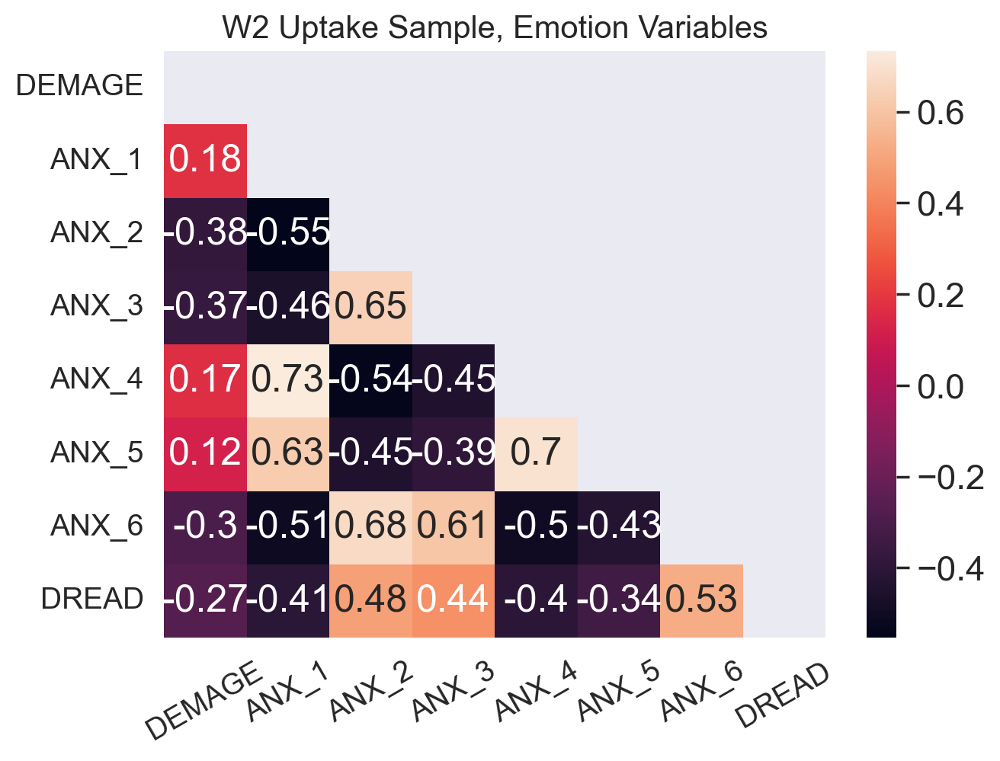

In [42]:
# Exploring Age correlation
knowledge_list_age = ['DEMAGE', 'COV_KNOWL_1', 'COV_KNOWL_2', 'COV_KNOWL_3', 'COV_KNOWL_4', 'COV_KNOWL_5', 'COV_KNOWL_6', 'COV_KNOWL_7']
emotion_list_age = ['DEMAGE', 'ANX_1', 'ANX_2', 'ANX_3', 'ANX_4', 'ANX_5', 'ANX_6', 'DREAD']

for data in [(w1, 'Wave 1'), (w2intent_nondum, 'Wave 2 Intention Sample'), (w2uptake_nondum, 'W2 Uptake Sample')]:
    for i in [(knowledge_list_age, 'Knowledge Variables'), (emotion_list_age, 'Emotion Variables')]:
        x = data[0]
        y = i[0]
        title = f"{data[1]}, {i[1]}"
        correlation_heat_map(x[y], title)

In [43]:
# Running final overview of W1 data
w1_nondum.describe()

,Unnamed: 0,DEMAGE,VAC_DEC,COV_VAC_SELF,COV_KNOWL_1,COV_KNOWL_2,COV_KNOWL_3,COV_KNOWL_4,COV_KNOWL_5,COV_KNOWL_6,COV_KNOWL_7,DREAD,ANX_1,ANX_2,ANX_3,ANX_4,ANX_5,ANX_6,target_1,target_2
count,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,9587.000000,5940.000000,9587.000000
mean,8255.031710,48.169500,0.325128,1.633775,3.654011,3.652759,3.602900,3.653489,3.253364,1.665797,1.301033,2.365808,2.068843,1.896318,1.720350,2.002503,1.979451,2.100761,0.907071,0.861792
std,4860.755123,16.690309,0.468447,0.859598,0.598119,0.625876,0.665789,0.613916,0.753708,0.899220,0.748545,0.915141,0.669954,0.743491,0.721583,0.675951,0.669205,0.708850,0.290358,0.345136
min,1.000000,18.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,4016.500000,34.000000,0.000000,1.000000,3.000000,3.000000,3.000000,3.000000,3.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,2.000000,1.000000,1.000000
50%,8166.000000,48.000000,0.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000
75%,12429.000000,62.000000,1.000000,2.000000,4.000000,4.000000,4.000000,4.000000,4.000000,2.000000,1.000000,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000,3.000000,1.000000,1.000000
max,17000.000000,90.000000,1.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,1.000000,1.000000


In [44]:
# Running final overview of W2 data
w2_nondum.describe()

,Unnamed: 0,COV_DOSE,COV_DOSE_2,COV_KNOWL_1,COV_KNOWL_2,COV_KNOWL_3,COV_KNOWL_4,COV_KNOWL_5,COV_KNOWL_6,COV_KNOWL_7,...,VAC_PASS_2,VAC_PASS_3,VAC_PASS_4,VAC_PASS_5,VAC_PASS_6,VAC_PASS_7,VAC_PASS_UK,intenttarget_1,intenttarget_2,uptaketarget
count,7981.000000,5810.000000,4372.000000,7981.000000,7981.000000,7981.000000,7981.000000,7981.000000,7981.000000,7981.000000,...,7981.000000,7981.000000,7981.000000,7981.000000,7981.000000,7981.000000,7981.000000,1918.000000,2500.000000,5810.000000
mean,8282.844756,1.304131,1.051235,3.724345,3.743015,3.704674,3.718832,3.347074,2.630873,1.324646,...,2.716201,3.590653,3.598547,3.466733,3.843629,3.636888,3.731613,0.924400,0.869200,0.943373
std,4775.334026,0.570039,0.251522,0.588269,0.588946,0.625974,0.600653,0.741248,1.085825,0.792812,...,1.382589,1.291948,1.285632,1.331252,1.240243,1.226161,1.093677,0.264425,0.337249,0.231147
min,56.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,4067.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,1.000000,...,1.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,1.000000,1.000000,1.000000
50%,8336.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,1.000000,...,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,1.000000,1.000000,1.000000
75%,12475.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,1.000000,...,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.000000,1.000000,1.000000
max,16604.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.000000,1.000000,1.000000


## Progress Report

Approach has been to:
-	Explore the W1 and W2 data within and across 3 subsets. I.e. conducting EDA w.r.t the target variables of each of the sub-samples:
    - W1 data as a whole – Willingness to take vaccine
    - W2 ‘willingness’ subset (those who have not been offered the vaccine) 
    - W2 ‘uptake’ subset (those who have been offered the vaccine).

**EDA Suggests:**
Overall sample demographic and target variable comparisons
-	Distribution of willingness in waves 1 and 2, and uptake in wave 2 are generally quite consistent – the majority express willingness to take the vaccine. We do observe a dip in ‘unsure but lean towards yes’ in wave 2 willingness, but no corresponding increase in skepticism. Suggests this group may have become more definite in their positive willingness (and/or have been offered vaccines). 
-	W1 and W2 (total, i.e. willingness+uptake samples) demographics generally appear consistent across wave 1 and wave 2 (despite removal of records with null values). Verifies that the analysis will be conducted across comparable samples.
    - Some mismatch in gender breakdown, proportionally fewer females in both samples, esp. wave 2. But don’t think this is anything to worry about.
-	Clear shift in age distribution from wave 1 to wave 2. Those of higher ages more likely to fall into the uptake sample in wave 2 (because the rollout was age determined), while younger age groups fall into the ‘intention’/willingness sample.

**Willingness demography comparisons**
-	Comparison of willingness by demographic groups across wave 1 and wave 2 suggests the general trend is towards increased willingness across all demographics. 
-	Regionally some variation in skepticism in wave 2 compared to wave 1 (e.g. N. Ireland).
-	In wave 1, women were more likely to express skepticism towards the vaccine. This effect has disappeared (or even reversed) in wave 2. Possibly due to initial fears around Astra Zeneca and blood clots, and around impact on pregnancy etc that were assuaged after new vaccines became available and new evidence and reassurance was provided.
-	Generally, skepticism appears to decline with higher education levels.
-	Big increase in skepticism among retired – but sample size is decreased massively in the wave 2 willingness set (as this group were offered first). Therefore can’t read to much into this result.
-	Some increase in skepticism among shielders in wave 2. Reasons for this not entirely clear.

**W2 – Uptake/willingness demography comparisons**
-	Uptake appears to follow the same overall, and demographic patterns as willingness. Seems to suggest stated willingness is a good indicator of actual behaviour.
-	Uptake and willingness are generally stable across all political parties, while those who would vote for smaller parties express more skepticism. Note that base sizes are smaller here.

**Uptake/willingness by Media sources**
-	Uptake and willingness appear broadly stable across media sources. Traditional media channels and govt/int. health authorities tend to indicate increased willingness (possibly reflective of underlying characteristics - i.e. Those who are willing are more likely to trust traditional media channels)
- Uptake/willingness by Knowledge: Clear positive pattern between willingness and ‘agreement’ with statements reflecting knowledge of covid prevention steps or facts . Again, may reflect underlying patterns, but knowledge statements do seem to be correlated with intention and uptake. 
- Uptake/willingness by Emotion: Less clear pattern of willingness/uptake attitudes/behaviour w.r.t emotion variables. This makes sense (you may be skeptical of the vaccine, but lockdown laws make you feel negative). Some suggestion that those who have felt less negative emotions are more skeptical of the vaccine (but lots to potentially unpack here)

High correlation among certain groupings of knowledge and emotion variables.

**Notes to take into modelling stages**:
-	Unbalanced target classes – will need to use oversampling strategies to deal with this. 
-	Unlike other demographics, the age-focused vaccine rollout means that age distribution varies across samples – this may impact on the generalizability of models trained on wave 1 data.
-	Correlation among knowledge and emotion variables may cause multicollinearity in parametric models. Worth considering the application of PCA on these subsets?
-   W2 intention sample is small, therefore this may impact on the robustness of models based on this dataset.
